In [1]:
import pandas as pd
dataset=pd.read_csv("austin_weather.csv")
dataset.head()

,Date,TempHighF,TempAvgF,TempLowF,DewPointHighF,DewPointAvgF,DewPointLowF,HumidityHighPercent,HumidityAvgPercent,HumidityLowPercent,...,SeaLevelPressureAvgInches,SeaLevelPressureLowInches,VisibilityHighMiles,VisibilityAvgMiles,VisibilityLowMiles,WindHighMPH,WindAvgMPH,WindGustMPH,PrecipitationSumInches,Events
0,2013-12-21,74,60,45,67,49,43,93,75,57,...,29.68,29.59,10,7,2,20,4,31,0.46,"Rain , Thunderstorm"
1,2013-12-22,56,48,39,43,36,28,93,68,43,...,30.13,29.87,10,10,5,16,6,25,0,
2,2013-12-23,58,45,32,31,27,23,76,52,27,...,30.49,30.41,10,10,10,8,3,12,0,
3,2013-12-24,61,46,31,36,28,21,89,56,22,...,30.45,30.3,10,10,7,12,4,20,0,
4,2013-12-25,58,50,41,44,40,36,86,71,56,...,30.33,30.27,10,10,7,10,2,16,T,


In [ ]:
dataset.isnull().sum()

In [3]:
dataset['Date']=pd.to_datetime(dataset.Date)
dataset['Year']=dataset['Date'].dt.year
dataset['Month']=dataset['Date'].dt.month
dataset['Day']=dataset['Date'].dt.day
dataset=dataset.drop('Date',axis=1)
dataset=dataset.drop('Events',axis=1)
dataset.head()

,TempHighF,TempAvgF,TempLowF,DewPointHighF,DewPointAvgF,DewPointLowF,HumidityHighPercent,HumidityAvgPercent,HumidityLowPercent,SeaLevelPressureHighInches,...,VisibilityHighMiles,VisibilityAvgMiles,VisibilityLowMiles,WindHighMPH,WindAvgMPH,WindGustMPH,PrecipitationSumInches,Year,Month,Day
0,74,60,45,67,49,43,93,75,57,29.86,...,10,7,2,20,4,31,0.46,2013,12,21
1,56,48,39,43,36,28,93,68,43,30.41,...,10,10,5,16,6,25,0,2013,12,22
2,58,45,32,31,27,23,76,52,27,30.56,...,10,10,10,8,3,12,0,2013,12,23
3,61,46,31,36,28,21,89,56,22,30.56,...,10,10,7,12,4,20,0,2013,12,24
4,58,50,41,44,40,36,86,71,56,30.41,...,10,10,7,10,2,16,T,2013,12,25


In [4]:
for col in dataset:
    print(dataset[col].unique())
    print("\n\n")
    if col=='PrecipitationSumInches':
        break

[ 74  56  58  61  57  60  62  64  44  55  69  71  59  36  48  53  70  72
  75  67  76  82  63  40  39  49  65  80  46  32  38  86  81  83  77  52
  73  47  50  68  66  89  79  85  84  87  78  88  96  93  94  91  92  90
  95  97  98 100 101  99 102 104 103  51  41  45  54  42  43  37 105  34
 107 106]



[60 48 45 46 50 53 51 40 54 44 43 57 47 29 35 62 65 52 56 59 64 42 33 38
 68 66 34 67 70 69 73 63 74 36 49 61 55 58 72 76 77 75 78 85 80 79 83 81
 82 92 84 86 87 88 90 89 91 71 39 37 41 30 32 93]



[45 39 32 31 41 40 36 35 33 28 42 34 22 53 57 48 46 43 37 38 27 26 55 29
 47 59 58 63 62 52 44 24 30 50 56 49 51 54 61 60 66 70 71 65 68 64 67 73
 72 74 75 76 77 78 69 79 80 23 81 19 21]



['67' '43' '31' '36' '44' '39' '41' '49' '51' '37' '55' '54' '15' '29'
 '60' '64' '58' '28' '42' '22' '38' '45' '19' '59' '62' '40' '17' '53'
 '34' '48' '52' '61' '63' '33' '57' '65' '46' '32' '50' '27' '56' '47'
 '68' '69' '66' '70' '73' '71' '76' '72' '75' '74' '-' '77' '23' '35' '30'
 '79' '78' '80' '2

In [5]:
dataset=dataset.replace('-','0')
dataset=dataset.replace(' ','Nan')
dataset=dataset.replace('T','0')
print(dataset.dtypes)

TempHighF                      int64
TempAvgF                       int64
TempLowF                       int64
DewPointHighF                 object
DewPointAvgF                  object
DewPointLowF                  object
HumidityHighPercent           object
HumidityAvgPercent            object
HumidityLowPercent            object
SeaLevelPressureHighInches    object
SeaLevelPressureAvgInches     object
SeaLevelPressureLowInches     object
VisibilityHighMiles           object
VisibilityAvgMiles            object
VisibilityLowMiles            object
WindHighMPH                   object
WindAvgMPH                    object
WindGustMPH                   object
PrecipitationSumInches        object
Year                           int64
Month                          int64
Day                            int64
dtype: object


In [6]:
c=0
for col in dataset:
    if c>2:
        dataset[col]=dataset[col].astype('float')
    if col=='PrecipitationSumInches':
        break
    c = c+1
data=dataset.copy()

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns

corrMatrix = data.corr()
plt.figure(figsize=(12, 12))
sns.heatmap(corrMatrix, annot=True)

In [8]:
Y_out = pd.DataFrame(data, columns = ['TempHighF','TempAvgF','TempLowF'])
data=data.drop('TempAvgF',axis=1)
data=data.drop('TempLowF',axis=1)
data=data.drop('TempHighF',axis=1)

In [9]:
X_train=pd.concat([data.iloc[0:100,:],data.iloc[200:1200,:]])
X_test=pd.concat([data.iloc[100:200,:],data.iloc[1200:,:]])
Y_train=pd.concat([Y_out.iloc[0:100,1:2],Y_out.iloc[200:1200,1:2]])
Y_test=pd.concat([Y_out.iloc[100:200,1:2],Y_out.iloc[1200:,1:2]])

In [10]:
print(X_train.shape)
print(Y_train.shape)
print(X_test.shape)
print(Y_test.shape)

(1100, 19)
(1100, 1)
(219, 19)
(219, 1)


In [11]:
import numpy as np
def weight_initializer(no_independent_variables):
    weights=np.random.randn(no_independent_variables,1)
    return weights

def cost_computation(X,Y,weights,samples):
    Y_hat=np.dot(X,weights)
    cost= (1/(2*samples))*np.sum((Y_hat-Y)**2)
    mae=np.sum(Y_hat-Y)
    return cost,mae

def cal_gradient(X,Y,samples,weights):
    return 1/samples * np.dot(X.T,np.subtract(np.dot(X,weights),Y))

def update_weights(X,Y,weights,learning_rate,samples):
    weights=weights - learning_rate*cal_gradient(X,Y,samples,weights)
    return weights

def gradient_descent(X,Y,learning_rate,epochs):
    cost=[]
    it=[]
    samples=len(Y)
    n_variables=X.shape[1]
    weights=weight_initializer(n_variables)
    loss=cost_computation(X,Y,weights,samples)
    for i in range(epochs):
        weights=update_weights(X,Y,weights,learning_rate,samples)
        loss,mae=cost_computation(X,Y,weights,samples)
        if i%1000==0:
            cost.append(loss)
            it.append(i)
        print(f"Cost after iteration {str(i)}  ===>>>    {str(loss)}")
        print(f" MAE ===>>>  {str(mae)}")
        print("\n")
        
    %matplotlib inline
    plt.plot(it,cost)
    plt.xlabel('Iteration')
    plt.ylabel('Cost')
    
    return weights

def Predict(X_test, Y_test, weights):
    Y_hat=np.dot(X_test,weights)
    mae=np.sum(Y_hat-Y_test)
    d=pd.DataFrame({'Actual':[Y_test], 'Predicted':[Y_hat]})
    return d,Y_test,Y_hat

def manual_predict(X_test, weights):
    Y_hat=np.dot(X_test,weights)
    return Y_hat

Cost after iteration 0  ===>>>    75.71609641309774
 MAE ===>>>  2881.0171166810387


Cost after iteration 1  ===>>>    71.99332349573119
 MAE ===>>>  181.05754140504712


Cost after iteration 2  ===>>>    71.11520593187593
 MAE ===>>>  262.80788907750286


Cost after iteration 3  ===>>>    70.25626100651127
 MAE ===>>>  255.21171863608458


Cost after iteration 4  ===>>>    69.41320997653222
 MAE ===>>>  250.53721299499773


Cost after iteration 5  ===>>>    68.5856983308818
 MAE ===>>>  245.81854465661445


Cost after iteration 6  ===>>>    67.77338369288971
 MAE ===>>>  241.1504815123102


Cost after iteration 7  ===>>>    66.97593254029401
 MAE ===>>>  236.52943813923628


Cost after iteration 8  ===>>>    66.19301993862865
 MAE ===>>>  231.9549966040223


Cost after iteration 9  ===>>>    65.42432928647102
 MAE ===>>>  227.42664373961395


Cost after iteration 10  ===>>>    64.6695520691359
 MAE ===>>>  222.94387591004318


Cost after iteration 11  ===>>>    63.92838762051005
 MAE

Cost after iteration 749  ===>>>    11.288472020705505
 MAE ===>>>  -208.93483901525278


Cost after iteration 750  ===>>>    11.283012161096224
 MAE ===>>>  -208.8662728633102


Cost after iteration 751  ===>>>    11.27756137689513
 MAE ===>>>  -208.79767894841976


Cost after iteration 752  ===>>>    11.272119635122468
 MAE ===>>>  -208.7290578974366


Cost after iteration 753  ===>>>    11.266686902967164
 MAE ===>>>  -208.66041033216746


Cost after iteration 754  ===>>>    11.261263147785693
 MAE ===>>>  -208.591736869525


Cost after iteration 755  ===>>>    11.255848337100886
 MAE ===>>>  -208.52303812143288


Cost after iteration 756  ===>>>    11.250442438600857
 MAE ===>>>  -208.4543146950063


Cost after iteration 757  ===>>>    11.245045420137817
 MAE ===>>>  -208.38556719243684


Cost after iteration 758  ===>>>    11.239657249726998
 MAE ===>>>  -208.31679621116697


Cost after iteration 759  ===>>>    11.234277895545542
 MAE ===>>>  -208.24800234379697


Cost after itera

Cost after iteration 1298  ===>>>    9.120612382748636
 MAE ===>>>  -174.3707640951903


Cost after iteration 1299  ===>>>    9.117600684806103
 MAE ===>>>  -174.31758163613145


Cost after iteration 1300  ===>>>    9.114591161125817
 MAE ===>>>  -174.26443460372832


Cost after iteration 1301  ===>>>    9.11158380786011
 MAE ===>>>  -174.2113229661354


Cost after iteration 1302  ===>>>    9.10857862117345
 MAE ===>>>  -174.15824669140045


Cost after iteration 1303  ===>>>    9.105575597242376
 MAE ===>>>  -174.10520574756364


Cost after iteration 1304  ===>>>    9.102574732255459
 MAE ===>>>  -174.05220010260567


Cost after iteration 1305  ===>>>    9.099576022413263
 MAE ===>>>  -173.9992297244847


Cost after iteration 1306  ===>>>    9.096579463928283
 MAE ===>>>  -173.9462945810916


Cost after iteration 1307  ===>>>    9.093585053024908
 MAE ===>>>  -173.89339464030732


Cost after iteration 1308  ===>>>    9.090592785939366
 MAE ===>>>  -173.84052986994843


Cost after itera

Cost after iteration 1969  ===>>>    7.461582947487083
 MAE ===>>>  -145.07792462292417


Cost after iteration 1970  ===>>>    7.459524765452817
 MAE ===>>>  -145.04176980708291


Cost after iteration 1971  ===>>>    7.457467560278297
 MAE ===>>>  -145.0056323167169


Cost after iteration 1972  ===>>>    7.455411331166388
 MAE ===>>>  -144.96951213443322


Cost after iteration 1973  ===>>>    7.453356077321256
 MAE ===>>>  -144.93340924292073


Cost after iteration 1974  ===>>>    7.451301797948363
 MAE ===>>>  -144.89732362487052


Cost after iteration 1975  ===>>>    7.449248492254465
 MAE ===>>>  -144.86125526298537


Cost after iteration 1976  ===>>>    7.447196159447599
 MAE ===>>>  -144.82520414002292


Cost after iteration 1977  ===>>>    7.4451447987371004
 MAE ===>>>  -144.7891702387277


Cost after iteration 1978  ===>>>    7.443094409333581
 MAE ===>>>  -144.75315354192043


Cost after iteration 1979  ===>>>    7.44104499044893
 MAE ===>>>  -144.71715403238687


Cost after i

Cost after iteration 2617  ===>>>    6.303788773815466
 MAE ===>>>  -124.64972019877945


Cost after iteration 2618  ===>>>    6.302237927669684
 MAE ===>>>  -124.62205175991102


Cost after iteration 2619  ===>>>    6.30068771573252
 MAE ===>>>  -124.59439325656248


Cost after iteration 2620  ===>>>    6.299138137647652
 MAE ===>>>  -124.5667446815188


Cost after iteration 2621  ===>>>    6.297589193059093
 MAE ===>>>  -124.53910602760782


Cost after iteration 2622  ===>>>    6.296040881611207
 MAE ===>>>  -124.51147728763854


Cost after iteration 2623  ===>>>    6.2944932029486935
 MAE ===>>>  -124.4838584544577


Cost after iteration 2624  ===>>>    6.292946156716598
 MAE ===>>>  -124.4562495208946


Cost after iteration 2625  ===>>>    6.291399742560305
 MAE ===>>>  -124.42865047980013


Cost after iteration 2626  ===>>>    6.289853960125541
 MAE ===>>>  -124.40106132401742


Cost after iteration 2627  ===>>>    6.288308809058374
 MAE ===>>>  -124.37348204642953


Cost after it

Cost after iteration 3303  ===>>>    5.372424728480326
 MAE ===>>>  -107.68388877819069


Cost after iteration 3304  ===>>>    5.37123977398796
 MAE ===>>>  -107.66171304084418


Cost after iteration 3305  ===>>>    5.370055268688312
 MAE ===>>>  -107.63954379509192


Cost after iteration 3306  ===>>>    5.368871212375894
 MAE ===>>>  -107.61738103747493


Cost after iteration 3307  ===>>>    5.367687604845373
 MAE ===>>>  -107.59522476453566


Cost after iteration 3308  ===>>>    5.366504445891542
 MAE ===>>>  -107.57307497281187


Cost after iteration 3309  ===>>>    5.365321735309345
 MAE ===>>>  -107.55093165885465


Cost after iteration 3310  ===>>>    5.36413947289385
 MAE ===>>>  -107.5287948192138


Cost after iteration 3311  ===>>>    5.362957658440274
 MAE ===>>>  -107.50666445043227


Cost after iteration 3312  ===>>>    5.36177629174397
 MAE ===>>>  -107.48454054907535


Cost after iteration 3313  ===>>>    5.360595372600424
 MAE ===>>>  -107.46242311170634


Cost after ite

Cost after iteration 3978  ===>>>    4.665314207384359
 MAE ===>>>  -94.03849404990008


Cost after iteration 3979  ===>>>    4.664391710517611
 MAE ===>>>  -94.02004577271543


Cost after iteration 3980  ===>>>    4.663469549518658
 MAE ===>>>  -94.00160220836715


Cost after iteration 3981  ===>>>    4.662547724250015
 MAE ===>>>  -93.98316335487806


Cost after iteration 3982  ===>>>    4.6616262345742765
 MAE ===>>>  -93.96472921023147


Cost after iteration 3983  ===>>>    4.660705080354105
 MAE ===>>>  -93.94629977245488


Cost after iteration 3984  ===>>>    4.659784261452237
 MAE ===>>>  -93.92787503952572


Cost after iteration 3985  ===>>>    4.658863777731483
 MAE ===>>>  -93.90945500947845


Cost after iteration 3986  ===>>>    4.657943629054726
 MAE ===>>>  -93.89103968031563


Cost after iteration 3987  ===>>>    4.657023815284919
 MAE ===>>>  -93.87262905003738


Cost after iteration 3988  ===>>>    4.656104336285093
 MAE ===>>>  -93.85422311666655


Cost after iteration

Cost after iteration 4695  ===>>>    4.082400477268839
 MAE ===>>>  -81.91233180633812


Cost after iteration 4696  ===>>>    4.081687411608297
 MAE ===>>>  -81.89682440175946


Cost after iteration 4697  ===>>>    4.080974598955317
 MAE ===>>>  -81.88132057424443


Cost after iteration 4698  ===>>>    4.08026203921287
 MAE ===>>>  -81.86582032251718


Cost after iteration 4699  ===>>>    4.079549732283968
 MAE ===>>>  -81.85032364533018


Cost after iteration 4700  ===>>>    4.078837678071677
 MAE ===>>>  -81.83483054145708


Cost after iteration 4701  ===>>>    4.0781258764790955
 MAE ===>>>  -81.81934100961615


Cost after iteration 4702  ===>>>    4.077414327409371
 MAE ===>>>  -81.80385504858299


Cost after iteration 4703  ===>>>    4.076703030765693
 MAE ===>>>  -81.78837265707341


Cost after iteration 4704  ===>>>    4.075991986451295
 MAE ===>>>  -81.77289383389056


Cost after iteration 4705  ===>>>    4.07528119436946
 MAE ===>>>  -81.75741857773332


Cost after iteration 4

Cost after iteration 5317  ===>>>    3.684115757837426
 MAE ===>>>  -72.91168925281278


Cost after iteration 5318  ===>>>    3.683542919397563
 MAE ===>>>  -72.89819085010544


Cost after iteration 5319  ===>>>    3.6829702811159684
 MAE ===>>>  -72.88469536621773


Cost after iteration 5320  ===>>>    3.682397842918441
 MAE ===>>>  -72.87120280028657


Cost after iteration 5321  ===>>>    3.681825604730807
 MAE ===>>>  -72.85771315137679


Cost after iteration 5322  ===>>>    3.6812535664789268
 MAE ===>>>  -72.84422641862669


Cost after iteration 5323  ===>>>    3.6806817280886817
 MAE ===>>>  -72.83074260114927


Cost after iteration 5324  ===>>>    3.680110089485996
 MAE ===>>>  -72.81726169802565


Cost after iteration 5325  ===>>>    3.67953865059682
 MAE ===>>>  -72.80378370839586


Cost after iteration 5326  ===>>>    3.678967411347127
 MAE ===>>>  -72.79030863134176


Cost after iteration 5327  ===>>>    3.678396371662935
 MAE ===>>>  -72.77683646599937


Cost after iteratio

Cost after iteration 6018  ===>>>    3.327709370454946
 MAE ===>>>  -64.11847490017237


Cost after iteration 6019  ===>>>    3.3272602517081182
 MAE ===>>>  -64.10682632118495


Cost after iteration 6020  ===>>>    3.32681128784381
 MAE ===>>>  -64.09518012915746


Cost after iteration 6021  ===>>>    3.3263624788060495
 MAE ===>>>  -64.0835363234285


Cost after iteration 6022  ===>>>    3.3259138245388846
 MAE ===>>>  -64.07189490336441


Cost after iteration 6023  ===>>>    3.325465324986385
 MAE ===>>>  -64.06025586834161


Cost after iteration 6024  ===>>>    3.3250169800926432
 MAE ===>>>  -64.04861921766596


Cost after iteration 6025  ===>>>    3.3245687898017717
 MAE ===>>>  -64.03698495074082


Cost after iteration 6026  ===>>>    3.324120754057909
 MAE ===>>>  -64.02535306691541


Cost after iteration 6027  ===>>>    3.3236728728052127
 MAE ===>>>  -64.01372356553355


Cost after iteration 6028  ===>>>    3.32322514598786
 MAE ===>>>  -64.00209644595509


Cost after iterati

Cost after iteration 6677  ===>>>    3.0628237536847873
 MAE ===>>>  -56.93095768372548


Cost after iteration 6678  ===>>>    3.062465535449437
 MAE ===>>>  -56.92075421082915


Cost after iteration 6679  ===>>>    3.062107439530292
 MAE ===>>>  -56.91055275247942


Cost after iteration 6680  ===>>>    3.061749465883908
 MAE ===>>>  -56.90035330818346


Cost after iteration 6681  ===>>>    3.0613916144668565
 MAE ===>>>  -56.890155877405014


Cost after iteration 6682  ===>>>    3.0610338852357297
 MAE ===>>>  -56.87996045970696


Cost after iteration 6683  ===>>>    3.060676278147128
 MAE ===>>>  -56.869767054565536


Cost after iteration 6684  ===>>>    3.060318793157679
 MAE ===>>>  -56.85957566146786


Cost after iteration 6685  ===>>>    3.059961430224015
 MAE ===>>>  -56.84938627994755


Cost after iteration 6686  ===>>>    3.0596041893027914
 MAE ===>>>  -56.839198909496204


Cost after iteration 6687  ===>>>    3.05924707035068
 MAE ===>>>  -56.82901354962533


Cost after iter

Cost after iteration 7363  ===>>>    2.8436396661179573
 MAE ===>>>  -50.37971140986045


Cost after iteration 7364  ===>>>    2.843355970230126
 MAE ===>>>  -50.37078243241805


Cost after iteration 7365  ===>>>    2.8430723703744083
 MAE ===>>>  -50.36185516767887


Cost after iteration 7366  ===>>>    2.8427888665171714
 MAE ===>>>  -50.352929615259825


Cost after iteration 7367  ===>>>    2.842505458624795
 MAE ===>>>  -50.344005774754336


Cost after iteration 7368  ===>>>    2.8422221466636692
 MAE ===>>>  -50.33508364578631


Cost after iteration 7369  ===>>>    2.8419389306002025
 MAE ===>>>  -50.32616322793551


Cost after iteration 7370  ===>>>    2.8416558104008107
 MAE ===>>>  -50.317244520849584


Cost after iteration 7371  ===>>>    2.8413727860319242
 MAE ===>>>  -50.308327524120514


Cost after iteration 7372  ===>>>    2.841089857459984
 MAE ===>>>  -50.299412237356464


Cost after iteration 7373  ===>>>    2.8408070246514474
 MAE ===>>>  -50.29049866017923


Cost aft

Cost after iteration 8013  ===>>>    2.6780474633303015
 MAE ===>>>  -44.92019893749485


Cost after iteration 8014  ===>>>    2.6778196245435923
 MAE ===>>>  -44.91230611852701


Cost after iteration 8015  ===>>>    2.677591862331534
 MAE ===>>>  -44.904414782277584


Cost after iteration 8016  ===>>>    2.677364176667599
 MAE ===>>>  -44.89652492847277


Cost after iteration 8017  ===>>>    2.677136567525267
 MAE ===>>>  -44.88863655674144


Cost after iteration 8018  ===>>>    2.676909034878029
 MAE ===>>>  -44.8807496668014


Cost after iteration 8019  ===>>>    2.676681578699384
 MAE ===>>>  -44.872864258315325


Cost after iteration 8020  ===>>>    2.6764541989628396
 MAE ===>>>  -44.86498033098061


Cost after iteration 8021  ===>>>    2.6762268956419177
 MAE ===>>>  -44.85709788446166


Cost after iteration 8022  ===>>>    2.6759996687101464
 MAE ===>>>  -44.84921691843489


Cost after iteration 8023  ===>>>    2.675772518141063
 MAE ===>>>  -44.84133743257881


Cost after iter

Cost after iteration 8698  ===>>>    2.53858494217819
 MAE ===>>>  -39.84468870571405


Cost after iteration 8699  ===>>>    2.538403821772136
 MAE ===>>>  -39.83774111317959


Cost after iteration 8700  ===>>>    2.5382227618309936
 MAE ===>>>  -39.83079480366943


Cost after iteration 8701  ===>>>    2.5380417623340086
 MAE ===>>>  -39.82384977693277


Cost after iteration 8702  ===>>>    2.5378608232604414
 MAE ===>>>  -39.81690603266856


Cost after iteration 8703  ===>>>    2.5376799445895575
 MAE ===>>>  -39.809963570643056


Cost after iteration 8704  ===>>>    2.537499126300625
 MAE ===>>>  -39.80302239058551


Cost after iteration 8705  ===>>>    2.537318368372925
 MAE ===>>>  -39.79608249221469


Cost after iteration 8706  ===>>>    2.5371376707857474
 MAE ===>>>  -39.78914387527026


Cost after iteration 8707  ===>>>    2.53695703351838
 MAE ===>>>  -39.7822065395142


Cost after iteration 8708  ===>>>    2.53677645655013
 MAE ===>>>  -39.77527048465482


Cost after iteratio

Cost after iteration 9297  ===>>>    2.440221103674562
 MAE ===>>>  -35.903768547199824


Cost after iteration 9298  ===>>>    2.4400727344235364
 MAE ===>>>  -35.89754431133697


Cost after iteration 9299  ===>>>    2.439924414436937
 MAE ===>>>  -35.89132121114124


Cost after iteration 9300  ===>>>    2.4397761436979772
 MAE ===>>>  -35.88509924638542


Cost after iteration 9301  ===>>>    2.439627922189874
 MAE ===>>>  -35.878878416839946


Cost after iteration 9302  ===>>>    2.4394797498958525
 MAE ===>>>  -35.87265872225955


Cost after iteration 9303  ===>>>    2.439331626799142
 MAE ===>>>  -35.86644016246161


Cost after iteration 9304  ===>>>    2.439183552882979
 MAE ===>>>  -35.86022273715977


Cost after iteration 9305  ===>>>    2.4390355281305998
 MAE ===>>>  -35.85400644617276


Cost after iteration 9306  ===>>>    2.4388875525252587
 MAE ===>>>  -35.847791289257216


Cost after iteration 9307  ===>>>    2.438739626050204
 MAE ===>>>  -35.84157726617274


Cost after it

Cost after iteration 10045  ===>>>    2.3419103830620744
 MAE ===>>>  -31.550166110120244


Cost after iteration 10046  ===>>>    2.3417945568629577
 MAE ===>>>  -31.544731291549418


Cost after iteration 10047  ===>>>    2.341678768879044
 MAE ===>>>  -31.539297452439897


Cost after iteration 10048  ===>>>    2.3415630190974097
 MAE ===>>>  -31.53386459261437


Cost after iteration 10049  ===>>>    2.3414473075051325
 MAE ===>>>  -31.528432711858464


Cost after iteration 10050  ===>>>    2.3413316340892956
 MAE ===>>>  -31.523001809992756


Cost after iteration 10051  ===>>>    2.3412159988369834
 MAE ===>>>  -31.517571886832144


Cost after iteration 10052  ===>>>    2.3411004017352934
 MAE ===>>>  -31.51214294218269


Cost after iteration 10053  ===>>>    2.3409848427713174
 MAE ===>>>  -31.506714975834328


Cost after iteration 10054  ===>>>    2.340869321932156
 MAE ===>>>  -31.501287987617857


Cost after iteration 10055  ===>>>    2.3407538392049174
 MAE ===>>>  -31.4958619773

Cost after iteration 10702  ===>>>    2.2734725913699454
 MAE ===>>>  -28.18189205232173


Cost after iteration 10703  ===>>>    2.2733792863727316
 MAE ===>>>  -28.177061514861386


Cost after iteration 10704  ===>>>    2.2732860119938714
 MAE ===>>>  -28.17223184014152


Cost after iteration 10705  ===>>>    2.273192768223065
 MAE ===>>>  -28.16740302796314


Cost after iteration 10706  ===>>>    2.2730995550500195
 MAE ===>>>  -28.162575078189093


Cost after iteration 10707  ===>>>    2.2730063724644385
 MAE ===>>>  -28.157747990644346


Cost after iteration 10708  ===>>>    2.272913220456036
 MAE ===>>>  -28.152921765175172


Cost after iteration 10709  ===>>>    2.2728200990145253
 MAE ===>>>  -28.148096401597265


Cost after iteration 10710  ===>>>    2.272727008129628
 MAE ===>>>  -28.143271899762986


Cost after iteration 10711  ===>>>    2.272633947791062
 MAE ===>>>  -28.13844825950241


Cost after iteration 10712  ===>>>    2.2725409179885587
 MAE ===>>>  -28.13362548063523

Cost after iteration 11368  ===>>>    2.217634449399003
 MAE ===>>>  -25.147993068777552


Cost after iteration 11369  ===>>>    2.217559419525521
 MAE ===>>>  -25.143702244493184


Cost after iteration 11370  ===>>>    2.2174844141379726
 MAE ===>>>  -25.139412180532887


Cost after iteration 11371  ===>>>    2.2174094332281578
 MAE ===>>>  -25.135122876741946


Cost after iteration 11372  ===>>>    2.2173344767878884
 MAE ===>>>  -25.13083433297932


Cost after iteration 11373  ===>>>    2.2172595448089694
 MAE ===>>>  -25.126546549106024


Cost after iteration 11374  ===>>>    2.217184637283213
 MAE ===>>>  -25.122259524955396


Cost after iteration 11375  ===>>>    2.217109754202436
 MAE ===>>>  -25.117973260424193


Cost after iteration 11376  ===>>>    2.2170348955584576
 MAE ===>>>  -25.11368775533228


Cost after iteration 11377  ===>>>    2.216960061343095
 MAE ===>>>  -25.10940300955361


Cost after iteration 11378  ===>>>    2.2168852515481747
 MAE ===>>>  -25.10511902293665

Cost after iteration 12022  ===>>>    2.173433271715866
 MAE ===>>>  -22.497722404200573


Cost after iteration 12023  ===>>>    2.1733726283386323
 MAE ===>>>  -22.493899604280855


Cost after iteration 12024  ===>>>    2.173312004641753
 MAE ===>>>  -22.490077477155893


Cost after iteration 12025  ===>>>    2.1732514006186654
 MAE ===>>>  -22.486256022683477


Cost after iteration 12026  ===>>>    2.1731908162628106
 MAE ===>>>  -22.48243524077447


Cost after iteration 12027  ===>>>    2.173130251567634
 MAE ===>>>  -22.478615131292102


Cost after iteration 12028  ===>>>    2.1730697065265834
 MAE ===>>>  -22.474795694101424


Cost after iteration 12029  ===>>>    2.173009181133108
 MAE ===>>>  -22.4709769290846


Cost after iteration 12030  ===>>>    2.172948675380656
 MAE ===>>>  -22.46715883611104


Cost after iteration 12031  ===>>>    2.172888189262687
 MAE ===>>>  -22.463341415066452


Cost after iteration 12032  ===>>>    2.1728277227726513
 MAE ===>>>  -22.459524665811593


Cost after iteration 12645  ===>>>    2.139215748256337
 MAE ===>>>  -20.241616273450887


Cost after iteration 12646  ===>>>    2.139166179444283
 MAE ===>>>  -20.238189398909583


Cost after iteration 12647  ===>>>    2.1391166266277835
 MAE ===>>>  -20.234763124011174


Cost after iteration 12648  ===>>>    2.1390670898015256
 MAE ===>>>  -20.23133744865062


Cost after iteration 12649  ===>>>    2.1390175689602
 MAE ===>>>  -20.22791237272613


Cost after iteration 12650  ===>>>    2.138968064098494
 MAE ===>>>  -20.22448789610081


Cost after iteration 12651  ===>>>    2.1389185752111044
 MAE ===>>>  -20.221064018712234


Cost after iteration 12652  ===>>>    2.1388691022927264
 MAE ===>>>  -20.21764074040209


Cost after iteration 12653  ===>>>    2.1388196453380535
 MAE ===>>>  -20.214218061087443


Cost after iteration 12654  ===>>>    2.138770204341788
 MAE ===>>>  -20.210795980634074


Cost after iteration 12655  ===>>>    2.138720779298629
 MAE ===>>>  -20.207374498972186




Cost after iteration 13329  ===>>>    2.1087804080700203
 MAE ===>>>  -18.03204535994442


Cost after iteration 13330  ===>>>    2.108740629242478
 MAE ===>>>  -18.02900403153761


Cost after iteration 13331  ===>>>    2.1087008631648567
 MAE ===>>>  -18.02596323229912


Cost after iteration 13332  ===>>>    2.1086611098329384
 MAE ===>>>  -18.02292296210703


Cost after iteration 13333  ===>>>    2.108621369242503
 MAE ===>>>  -18.01988322090824


Cost after iteration 13334  ===>>>    2.108581641389341
 MAE ===>>>  -18.016844008590354


Cost after iteration 13335  ===>>>    2.1085419262692304
 MAE ===>>>  -18.01380532504586


Cost after iteration 13336  ===>>>    2.10850222387796
 MAE ===>>>  -18.01076717017532


Cost after iteration 13337  ===>>>    2.108462534211318
 MAE ===>>>  -18.007729543923915


Cost after iteration 13338  ===>>>    2.1084228572650954
 MAE ===>>>  -18.00469244613779


Cost after iteration 13339  ===>>>    2.108383193035081
 MAE ===>>>  -18.00165587675498


Cost

Cost after iteration 14091  ===>>>    2.0818745464837587
 MAE ===>>>  -15.8611654435921


Cost after iteration 14092  ===>>>    2.0818433575289252
 MAE ===>>>  -15.858500765310573


Cost after iteration 14093  ===>>>    2.081812178486733
 MAE ===>>>  -15.855836548050782


Cost after iteration 14094  ===>>>    2.081781009353915
 MAE ===>>>  -15.853172791706143


Cost after iteration 14095  ===>>>    2.081749850127205
 MAE ===>>>  -15.850509496215231


Cost after iteration 14096  ===>>>    2.0817187008033367
 MAE ===>>>  -15.847846661462988


Cost after iteration 14097  ===>>>    2.0816875613790464
 MAE ===>>>  -15.845184287399341


Cost after iteration 14098  ===>>>    2.0816564318510675
 MAE ===>>>  -15.842522373920076


Cost after iteration 14099  ===>>>    2.081625312216143
 MAE ===>>>  -15.839860920966736


Cost after iteration 14100  ===>>>    2.0815942024710066
 MAE ===>>>  -15.83719992841678


Cost after iteration 14101  ===>>>    2.081563102612401
 MAE ===>>>  -15.83453939622369

Cost after iteration 14792  ===>>>    2.0622667543631747
 MAE ===>>>  -14.101743700237023


Cost after iteration 14793  ===>>>    2.0622417713687398
 MAE ===>>>  -14.099382702739348


Cost after iteration 14794  ===>>>    2.062216796244396
 MAE ===>>>  -14.097022111770904


Cost after iteration 14795  ===>>>    2.0621918289875505
 MAE ===>>>  -14.094661927290609


Cost after iteration 14796  ===>>>    2.0621668695956257
 MAE ===>>>  -14.09230214923275


Cost after iteration 14797  ===>>>    2.0621419180660325
 MAE ===>>>  -14.08994277749018


Cost after iteration 14798  ===>>>    2.062116974396191
 MAE ===>>>  -14.0875838120147


Cost after iteration 14799  ===>>>    2.0620920385835158
 MAE ===>>>  -14.085225252737715


Cost after iteration 14800  ===>>>    2.0620671106254305
 MAE ===>>>  -14.08286709955371


Cost after iteration 14801  ===>>>    2.062042190519351
 MAE ===>>>  -14.08050935242354


Cost after iteration 14802  ===>>>    2.0620172782626955
 MAE ===>>>  -14.078152011280729

Cost after iteration 15432  ===>>>    2.047780190633685
 MAE ===>>>  -12.670772447779697


Cost after iteration 15433  ===>>>    2.04775975130991
 MAE ===>>>  -12.668657376114169


Cost after iteration 15434  ===>>>    2.047739318365583
 MAE ===>>>  -12.666542667225947


Cost after iteration 15435  ===>>>    2.0477188917986124
 MAE ===>>>  -12.664428321071206


Cost after iteration 15436  ===>>>    2.0476984716069113
 MAE ===>>>  -12.662314337550427


Cost after iteration 15437  ===>>>    2.047678057788389
 MAE ===>>>  -12.660200716609879


Cost after iteration 15438  ===>>>    2.0476576503409616
 MAE ===>>>  -12.65808745820047


Cost after iteration 15439  ===>>>    2.04763724926254
 MAE ===>>>  -12.655974562248417


Cost after iteration 15440  ===>>>    2.0476168545510385
 MAE ===>>>  -12.653862028693368


Cost after iteration 15441  ===>>>    2.0475964662043737
 MAE ===>>>  -12.65174985745574


Cost after iteration 15442  ===>>>    2.047576084220458
 MAE ===>>>  -12.649638048487027


Cost after iteration 16062  ===>>>    2.03608507328906
 MAE ===>>>  -11.407563738441198


Cost after iteration 16063  ===>>>    2.0360682663535665
 MAE ===>>>  -11.40566495120273


Cost after iteration 16064  ===>>>    2.03605146460952
 MAE ===>>>  -11.403766488505447


Cost after iteration 16065  ===>>>    2.0360346680552257
 MAE ===>>>  -11.401868350276892


Cost after iteration 16066  ===>>>    2.036017876688992
 MAE ===>>>  -11.399970536441273


Cost after iteration 16067  ===>>>    2.036001090509121
 MAE ===>>>  -11.398073046982532


Cost after iteration 16068  ===>>>    2.0359843095139234
 MAE ===>>>  -11.396175881801689


Cost after iteration 16069  ===>>>    2.035967533701705
 MAE ===>>>  -11.394279040885735


Cost after iteration 16070  ===>>>    2.0359507630707703
 MAE ===>>>  -11.392382524136714


Cost after iteration 16071  ===>>>    2.035933997619431
 MAE ===>>>  -11.39048633151188


Cost after iteration 16072  ===>>>    2.035917237345995
 MAE ===>>>  -11.388590462965468



Cost after iteration 16777  ===>>>    2.025296212931958
 MAE ===>>>  -10.12940792416294


Cost after iteration 16778  ===>>>    2.0252827173505277
 MAE ===>>>  -10.127727188834072


Cost after iteration 16779  ===>>>    2.025269225881233
 MAE ===>>>  -10.126046739699802


Cost after iteration 16780  ===>>>    2.0252557385227363
 MAE ===>>>  -10.124366576722707


Cost after iteration 16781  ===>>>    2.0252422552737004
 MAE ===>>>  -10.122686699839775


Cost after iteration 16782  ===>>>    2.0252287761327863
 MAE ===>>>  -10.121007108991321


Cost after iteration 16783  ===>>>    2.0252153010986627
 MAE ===>>>  -10.11932780416005


Cost after iteration 16784  ===>>>    2.025201830169991
 MAE ===>>>  -10.11764878525861


Cost after iteration 16785  ===>>>    2.025188363345435
 MAE ===>>>  -10.115970052264451


Cost after iteration 16786  ===>>>    2.025174900623659
 MAE ===>>>  -10.114291605117202


Cost after iteration 16787  ===>>>    2.02516144200333
 MAE ===>>>  -10.112613443749211


Cost after iteration 17048  ===>>>    2.0217850602494747
 MAE ===>>>  -9.684236681033397


Cost after iteration 17049  ===>>>    2.021772631538059
 MAE ===>>>  -9.682631700355913


Cost after iteration 17050  ===>>>    2.0217602065919875
 MAE ===>>>  -9.681026992613582


Cost after iteration 17051  ===>>>    2.0217477854100365
 MAE ===>>>  -9.679422557763722


Cost after iteration 17052  ===>>>    2.0217353679909826
 MAE ===>>>  -9.677818395756098


Cost after iteration 17053  ===>>>    2.0217229543336037
 MAE ===>>>  -9.676214506530584


Cost after iteration 17054  ===>>>    2.02171054443668
 MAE ===>>>  -9.674610890066049


Cost after iteration 17055  ===>>>    2.021698138298989
 MAE ===>>>  -9.67300754630849


Cost after iteration 17056  ===>>>    2.021685735919308
 MAE ===>>>  -9.671404475190862


Cost after iteration 17057  ===>>>    2.021673337296417
 MAE ===>>>  -9.669801676674531


Cost after iteration 17058  ===>>>    2.021660942429097
 MAE ===>>>  -9.668199150714145


Cost af

Cost after iteration 17315  ===>>>    2.018596551344872
 MAE ===>>>  -9.265251237338667


Cost after iteration 17316  ===>>>    2.0185850857908125
 MAE ===>>>  -9.263717463501798


Cost after iteration 17317  ===>>>    2.0185736236894964
 MAE ===>>>  -9.262183950171135


Cost after iteration 17318  ===>>>    2.0185621650398033
 MAE ===>>>  -9.260650697313451


Cost after iteration 17319  ===>>>    2.0185507098406155
 MAE ===>>>  -9.259117704841145


Cost after iteration 17320  ===>>>    2.018539258090813
 MAE ===>>>  -9.257584972742222


Cost after iteration 17321  ===>>>    2.018527809789275
 MAE ===>>>  -9.256052500963264


Cost after iteration 17322  ===>>>    2.01851636493489
 MAE ===>>>  -9.254520289465553


Cost after iteration 17323  ===>>>    2.0185049235265335
 MAE ===>>>  -9.252988338183613


Cost after iteration 17324  ===>>>    2.0184934855630905
 MAE ===>>>  -9.25145664710891


Cost after iteration 17325  ===>>>    2.018482051043441
 MAE ===>>>  -9.249925216122037


Cost a

Cost after iteration 17579  ===>>>    2.015686187575326
 MAE ===>>>  -8.869242325459425


Cost after iteration 17580  ===>>>    2.015675595770437
 MAE ===>>>  -8.867775770844958


Cost after iteration 17581  ===>>>    2.015665007135156
 MAE ===>>>  -8.86630946503297


Cost after iteration 17582  ===>>>    2.015654421668457
 MAE ===>>>  -8.86484340796276


Cost after iteration 17583  ===>>>    2.0156438393693157
 MAE ===>>>  -8.863377599581646


Cost after iteration 17584  ===>>>    2.015633260236705
 MAE ===>>>  -8.861912039858431


Cost after iteration 17585  ===>>>    2.015622684269597
 MAE ===>>>  -8.860446728749935


Cost after iteration 17586  ===>>>    2.0156121114669707
 MAE ===>>>  -8.858981666200961


Cost after iteration 17587  ===>>>    2.015601541827801
 MAE ===>>>  -8.857516852200916


Cost after iteration 17588  ===>>>    2.015590975351065
 MAE ===>>>  -8.856052286651753


Cost after iteration 17589  ===>>>    2.0155804120357335
 MAE ===>>>  -8.854587969568065


Cost afte



Cost after iteration 17815  ===>>>    2.013272237145552
 MAE ===>>>  -8.529941528811506


Cost after iteration 17816  ===>>>    2.01326236562861
 MAE ===>>>  -8.528532503034825


Cost after iteration 17817  ===>>>    2.0132524970482346
 MAE ===>>>  -8.527123716011445


Cost after iteration 17818  ===>>>    2.01324263140347
 MAE ===>>>  -8.525715167728457


Cost after iteration 17819  ===>>>    2.0132327686933693
 MAE ===>>>  -8.524306858131382


Cost after iteration 17820  ===>>>    2.0132229089169864
 MAE ===>>>  -8.52289878719617


Cost after iteration 17821  ===>>>    2.0132130520733673
 MAE ===>>>  -8.521490954864902


Cost after iteration 17822  ===>>>    2.013203198161571
 MAE ===>>>  -8.52008336110822


Cost after iteration 17823  ===>>>    2.013193347180645
 MAE ===>>>  -8.518676005879186


Cost after iteration 17824  ===>>>    2.0131834991296427
 MAE ===>>>  -8.517268889141192


Cost after iteration 17825  ===>>>    2.013173654007617
 MAE ===>>>  -8.515862010820271


Cost af

Cost after iteration 18092  ===>>>    2.010646827117594
 MAE ===>>>  -8.148625200948374


Cost after iteration 18093  ===>>>    2.0106377338098538
 MAE ===>>>  -8.147280755638803


Cost after iteration 18094  ===>>>    2.010628643187302
 MAE ===>>>  -8.145936537916484


Cost after iteration 18095  ===>>>    2.010619555249081
 MAE ===>>>  -8.144592547693122


Cost after iteration 18096  ===>>>    2.01061046999432
 MAE ===>>>  -8.143248784955098


Cost after iteration 18097  ===>>>    2.010601387422154
 MAE ===>>>  -8.14190524967836


Cost after iteration 18098  ===>>>    2.010592307531719
 MAE ===>>>  -8.140561941799788


Cost after iteration 18099  ===>>>    2.010583230322144
 MAE ===>>>  -8.13921886128147


Cost after iteration 18100  ===>>>    2.010574155792572
 MAE ===>>>  -8.137876008084021


Cost after iteration 18101  ===>>>    2.010565083942132
 MAE ===>>>  -8.136533382188695


Cost after iteration 18102  ===>>>    2.010556014769962
 MAE ===>>>  -8.13519098352554


Cost after it

Cost after iteration 18355  ===>>>    2.0083452574956797
 MAE ===>>>  -7.802759323971806


Cost after iteration 18356  ===>>>    2.008336841376942
 MAE ===>>>  -7.801473388448393


Cost after iteration 18357  ===>>>    2.008328427725059
 MAE ===>>>  -7.800187670335703


Cost after iteration 18358  ===>>>    2.008320016539238
 MAE ===>>>  -7.798902169627738


Cost after iteration 18359  ===>>>    2.0083116078186833
 MAE ===>>>  -7.797616886240519


Cost after iteration 18360  ===>>>    2.008303201562598
 MAE ===>>>  -7.7963318201735206


Cost after iteration 18361  ===>>>    2.008294797770191
 MAE ===>>>  -7.795046971374717


Cost after iteration 18362  ===>>>    2.0082863964406665
 MAE ===>>>  -7.793762339805447


Cost after iteration 18363  ===>>>    2.008277997573237
 MAE ===>>>  -7.792477925436486


Cost after iteration 18364  ===>>>    2.008269601167101
 MAE ===>>>  -7.7911937282173085


Cost after iteration 18365  ===>>>    2.008261207221473
 MAE ===>>>  -7.7899097481335176


Cost


Cost after iteration 18691  ===>>>    2.0056514307491877
 MAE ===>>>  -7.3826890143497295


Cost after iteration 18692  ===>>>    2.005643800367482
 MAE ===>>>  -7.381474055089804


Cost after iteration 18693  ===>>>    2.005636172199834
 MAE ===>>>  -7.380259300955828


Cost after iteration 18694  ===>>>    2.005628546245533
 MAE ===>>>  -7.3790447519378475


Cost after iteration 18695  ===>>>    2.005620922503865
 MAE ===>>>  -7.377830407994203


Cost after iteration 18696  ===>>>    2.005613300974123
 MAE ===>>>  -7.37661626908497


Cost after iteration 18697  ===>>>    2.0056056816555925
 MAE ===>>>  -7.375402335170492


Cost after iteration 18698  ===>>>    2.0055980645475686
 MAE ===>>>  -7.37418860624939


Cost after iteration 18699  ===>>>    2.005590449649334
 MAE ===>>>  -7.372975082230084


Cost after iteration 18700  ===>>>    2.0055828369601825
 MAE ===>>>  -7.371761763132682


Cost after iteration 18701  ===>>>    2.0055752264794036
 MAE ===>>>  -7.370548648863618


Cost

Cost after iteration 19264  ===>>>    2.0016208690069783
 MAE ===>>>  -6.719057976211914


Cost after iteration 19265  ===>>>    2.00161439765988
 MAE ===>>>  -6.7179549486717605


Cost after iteration 19266  ===>>>    2.0016079281552264
 MAE ===>>>  -6.716852106938212


Cost after iteration 19267  ===>>>    2.001601460492436
 MAE ===>>>  -6.715749451028664


Cost after iteration 19268  ===>>>    2.0015949946709117
 MAE ===>>>  -6.714646980895907


Cost after iteration 19269  ===>>>    2.0015885306900714
 MAE ===>>>  -6.7135446964913825


Cost after iteration 19270  ===>>>    2.0015820685493253
 MAE ===>>>  -6.7124425978176845


Cost after iteration 19271  ===>>>    2.0015756082480807
 MAE ===>>>  -6.711340684808334


Cost after iteration 19272  ===>>>    2.001569149785755
 MAE ===>>>  -6.710238957448404


Cost after iteration 19273  ===>>>    2.001562693161756
 MAE ===>>>  -6.7091374157104156


Cost after iteration 19274  ===>>>    2.0015562383754943
 MAE ===>>>  -6.708036059539808




Cost after iteration 19923  ===>>>    1.9977291778573911
 MAE ===>>>  -6.030978830255478


Cost after iteration 19924  ===>>>    1.9977238016300924
 MAE ===>>>  -6.029991596096174


Cost after iteration 19925  ===>>>    1.9977184268959713
 MAE ===>>>  -6.029004527874164


Cost after iteration 19926  ===>>>    1.9977130536545569
 MAE ===>>>  -6.028017625568218


Cost after iteration 19927  ===>>>    1.9977076819053747
 MAE ===>>>  -6.0270308891376985


Cost after iteration 19928  ===>>>    1.9977023116479475
 MAE ===>>>  -6.0260443185745345


Cost after iteration 19929  ===>>>    1.9976969428818017
 MAE ===>>>  -6.025057913837351


Cost after iteration 19930  ===>>>    1.9976915756064666
 MAE ===>>>  -6.024071674888518


Cost after iteration 19931  ===>>>    1.9976862098214636
 MAE ===>>>  -6.023085601708033


Cost after iteration 19932  ===>>>    1.997680845526322
 MAE ===>>>  -6.022099694277827


Cost after iteration 19933  ===>>>    1.9976754827205687
 MAE ===>>>  -6.02111395255379



Cost after iteration 20415  ===>>>    1.9952554277892796
 MAE ===>>>  -5.564753417118389


Cost after iteration 20416  ===>>>    1.9952507318195447
 MAE ===>>>  -5.563844485468579


Cost after iteration 20417  ===>>>    1.9952460371272587
 MAE ===>>>  -5.562935706313503


Cost after iteration 20418  ===>>>    1.995241343712016
 MAE ===>>>  -5.562027079679048


Cost after iteration 20419  ===>>>    1.995236651573415
 MAE ===>>>  -5.561118605528051


Cost after iteration 20420  ===>>>    1.9952319607110498
 MAE ===>>>  -5.560210283817796


Cost after iteration 20421  ===>>>    1.995227271124519
 MAE ===>>>  -5.5593021145392925


Cost after iteration 20422  ===>>>    1.995222582813419
 MAE ===>>>  -5.558394097642207


Cost after iteration 20423  ===>>>    1.9952178957773437
 MAE ===>>>  -5.557486233132472


Cost after iteration 20424  ===>>>    1.9952132100158915
 MAE ===>>>  -5.556578520973531


Cost after iteration 20425  ===>>>    1.9952085255286602
 MAE ===>>>  -5.5556709610994375


C

Cost after iteration 20969  ===>>>    1.9928386489183256
 MAE ===>>>  -5.083851925975608


Cost after iteration 20970  ===>>>    1.9928346023284431
 MAE ===>>>  -5.083023625103422


Cost after iteration 20971  ===>>>    1.9928305568112534
 MAE ===>>>  -5.082195462956982


Cost after iteration 20972  ===>>>    1.99282651236642
 MAE ===>>>  -5.08136743956522


Cost after iteration 20973  ===>>>    1.9928224689936063
 MAE ===>>>  -5.080539554874363


Cost after iteration 20974  ===>>>    1.9928184266924733
 MAE ===>>>  -5.079711808864111


Cost after iteration 20975  ===>>>    1.9928143854626879
 MAE ===>>>  -5.078884201516345


Cost after iteration 20976  ===>>>    1.9928103453039119
 MAE ===>>>  -5.078056732809138


Cost after iteration 20977  ===>>>    1.9928063062158072
 MAE ===>>>  -5.077229402720974


Cost after iteration 20978  ===>>>    1.99280226819804
 MAE ===>>>  -5.076402211228846


Cost after iteration 20979  ===>>>    1.9927982312502726
 MAE ===>>>  -5.075575158273047


Cost

Cost after iteration 21516  ===>>>    1.9907765985192654
 MAE ===>>>  -4.650864779793558


Cost after iteration 21517  ===>>>    1.990773091215335
 MAE ===>>>  -4.650108953643127


Cost after iteration 21518  ===>>>    1.9907695848152227
 MAE ===>>>  -4.649353253889046


Cost after iteration 21519  ===>>>    1.9907660793186452
 MAE ===>>>  -4.6485976805336975


Cost after iteration 21520  ===>>>    1.9907625747253224
 MAE ===>>>  -4.647842233543884


Cost after iteration 21521  ===>>>    1.990759071034969
 MAE ===>>>  -4.647086912888412


Cost after iteration 21522  ===>>>    1.9907555682473044
 MAE ===>>>  -4.646331718552702


Cost after iteration 21523  ===>>>    1.990752066362047
 MAE ===>>>  -4.645576650531865


Cost after iteration 21524  ===>>>    1.9907485653789172
 MAE ===>>>  -4.644821708785187


Cost after iteration 21525  ===>>>    1.9907450652976335
 MAE ===>>>  -4.644066893294834


Cost after iteration 21526  ===>>>    1.9907415661179113
 MAE ===>>>  -4.643312204033521


C

Cost after iteration 21912  ===>>>    1.9894555880652478
 MAE ===>>>  -4.36122686609081


Cost after iteration 21913  ===>>>    1.9894524175362536
 MAE ===>>>  -4.360519453592978


Cost after iteration 21914  ===>>>    1.9894492478063157
 MAE ===>>>  -4.359812159233641


Cost after iteration 21915  ===>>>    1.9894460788751862
 MAE ===>>>  -4.359104983058771


Cost after iteration 21916  ===>>>    1.9894429107426153
 MAE ===>>>  -4.358397925032513


Cost after iteration 21917  ===>>>    1.989439743408358
 MAE ===>>>  -4.357690985094969


Cost after iteration 21918  ===>>>    1.9894365768721598
 MAE ===>>>  -4.356984163271882


Cost after iteration 21919  ===>>>    1.9894334111337841
 MAE ===>>>  -4.356277459532848


Cost after iteration 21920  ===>>>    1.9894302461929774
 MAE ===>>>  -4.355570873852898


Cost after iteration 21921  ===>>>    1.9894270820494908
 MAE ===>>>  -4.354864406193727


Cost after iteration 21922  ===>>>    1.9894239187030813
 MAE ===>>>  -4.354158056575429


C

Cost after iteration 22220  ===>>>    1.9885156769458023
 MAE ===>>>  -4.148835537007926


Cost after iteration 22221  ===>>>    1.9885127411895904
 MAE ===>>>  -4.148163591173002


Cost after iteration 22222  ===>>>    1.9885098061597972
 MAE ===>>>  -4.147491757492006


Cost after iteration 22223  ===>>>    1.9885068718562011
 MAE ===>>>  -4.146820035950029


Cost after iteration 22224  ===>>>    1.988503938278578
 MAE ===>>>  -4.146148426525876


Cost after iteration 22225  ===>>>    1.988501005426703
 MAE ===>>>  -4.1454769292189155


Cost after iteration 22226  ===>>>    1.9884980733003526
 MAE ===>>>  -4.144805543983182


Cost after iteration 22227  ===>>>    1.988495141899304
 MAE ===>>>  -4.144134270814526


Cost after iteration 22228  ===>>>    1.9884922112233314
 MAE ===>>>  -4.143463109677548


Cost after iteration 22229  ===>>>    1.9884892812722121
 MAE ===>>>  -4.142792060570358


Cost after iteration 22230  ===>>>    1.9884863520457219
 MAE ===>>>  -4.142121123496068


C

Cost after iteration 22521  ===>>>    1.987663827459795
 MAE ===>>>  -3.951559290327907


Cost after iteration 22522  ===>>>    1.9876611005553158
 MAE ===>>>  -3.9509202599706654


Cost after iteration 22523  ===>>>    1.9876583743129677
 MAE ===>>>  -3.950281336175408


Cost after iteration 22524  ===>>>    1.9876556487325507
 MAE ===>>>  -3.9496425189480604


Cost after iteration 22525  ===>>>    1.9876529238138583
 MAE ===>>>  -3.9490038082644787


Cost after iteration 22526  ===>>>    1.9876501995566906
 MAE ===>>>  -3.9483652041186588


Cost after iteration 22527  ===>>>    1.9876474759608431
 MAE ===>>>  -3.9477267064697656


Cost after iteration 22528  ===>>>    1.9876447530261128
 MAE ===>>>  -3.9470883153105945


Cost after iteration 22529  ===>>>    1.9876420307522966
 MAE ===>>>  -3.9464500306154164


Cost after iteration 22530  ===>>>    1.9876393091391935
 MAE ===>>>  -3.9458118523802312


Cost after iteration 22531  ===>>>    1.9876365881865976
 MAE ===>>>  -3.9451737805

Cost after iteration 22858  ===>>>    1.9867810969801964
 MAE ===>>>  -3.742127606382411


Cost after iteration 22859  ===>>>    1.986778582112424
 MAE ===>>>  -3.741523490322919


Cost after iteration 22860  ===>>>    1.986776067841886
 MAE ===>>>  -3.740919474950431


Cost after iteration 22861  ===>>>    1.9867735541684057
 MAE ===>>>  -3.74031556020239


Cost after iteration 22862  ===>>>    1.9867710410917947
 MAE ===>>>  -3.7397117460888865


Cost after iteration 22863  ===>>>    1.9867685286118735
 MAE ===>>>  -3.739108032620514


Cost after iteration 22864  ===>>>    1.9867660167284587
 MAE ===>>>  -3.7385044197195896


Cost after iteration 22865  ===>>>    1.9867635054413693
 MAE ===>>>  -3.7379009074133407


Cost after iteration 22866  ===>>>    1.9867609947504243
 MAE ===>>>  -3.737297495682128


Cost after iteration 22867  ===>>>    1.9867584846554402
 MAE ===>>>  -3.7366941844962582


Cost after iteration 22868  ===>>>    1.9867559751562343
 MAE ===>>>  -3.736090973826684


Cost after iteration 23163  ===>>>    1.986040917503136
 MAE ===>>>  -3.5624604436456835


Cost after iteration 23164  ===>>>    1.9860385766153104
 MAE ===>>>  -3.5618862552304407


Cost after iteration 23165  ===>>>    1.9860362362718
 MAE ===>>>  -3.5613121624335093


Cost after iteration 23166  ===>>>    1.9860338964724427
 MAE ===>>>  -3.5607381652267094


Cost after iteration 23167  ===>>>    1.9860315572170681
 MAE ===>>>  -3.5601642635901527


Cost after iteration 23168  ===>>>    1.9860292185055137
 MAE ===>>>  -3.559590457527257


Cost after iteration 23169  ===>>>    1.9860268803376147
 MAE ===>>>  -3.559016746970997


Cost after iteration 23170  ===>>>    1.986024542713203
 MAE ===>>>  -3.558443131983104


Cost after iteration 23171  ===>>>    1.9860222056321208
 MAE ===>>>  -3.5578696124797133


Cost after iteration 23172  ===>>>    1.9860198690941975
 MAE ===>>>  -3.5572961884823826


Cost after iteration 23173  ===>>>    1.9860175330992687
 MAE ===>>>  -3.556722859941132

Cost after iteration 23520  ===>>>    1.9852386032449318
 MAE ===>>>  -3.3634309643490496


Cost after iteration 23521  ===>>>    1.985236446579882
 MAE ===>>>  -3.3628899015600524


Cost after iteration 23522  ===>>>    1.9852342904034925
 MAE ===>>>  -3.362348928806469


Cost after iteration 23523  ===>>>    1.9852321347156183
 MAE ===>>>  -3.3618080460316477


Cost after iteration 23524  ===>>>    1.9852299795161095
 MAE ===>>>  -3.361267253247348


Cost after iteration 23525  ===>>>    1.9852278248048216
 MAE ===>>>  -3.360726550441967


Cost after iteration 23526  ===>>>    1.9852256705816085
 MAE ===>>>  -3.3601859375794234


Cost after iteration 23527  ===>>>    1.9852235168463201
 MAE ===>>>  -3.3596454146457333


Cost after iteration 23528  ===>>>    1.9852213635988119
 MAE ===>>>  -3.3591049816339407


Cost after iteration 23529  ===>>>    1.9852192108389364
 MAE ===>>>  -3.3585646385403436


Cost after iteration 23530  ===>>>    1.985217058566546
 MAE ===>>>  -3.358024385331

Cost after iteration 23890  ===>>>    1.9844728000262992
 MAE ===>>>  -3.1692572056452732


Cost after iteration 23891  ===>>>    1.9844708145147416
 MAE ===>>>  -3.1687484319381625


Cost after iteration 23892  ===>>>    1.984468829440561
 MAE ===>>>  -3.1682397428136255


Cost after iteration 23893  ===>>>    1.984466844803625
 MAE ===>>>  -3.167731138215437


Cost after iteration 23894  ===>>>    1.9844648606038051
 MAE ===>>>  -3.1672226181795082


Cost after iteration 23895  ===>>>    1.9844628768409687
 MAE ===>>>  -3.1667141826660767


Cost after iteration 23896  ===>>>    1.9844608935149866
 MAE ===>>>  -3.166205831651723


Cost after iteration 23897  ===>>>    1.9844589106257295
 MAE ===>>>  -3.165697565128525


Cost after iteration 23898  ===>>>    1.984456928173064
 MAE ===>>>  -3.1651893830963758


Cost after iteration 23899  ===>>>    1.9844549461568617
 MAE ===>>>  -3.16468128551071


Cost after iteration 23900  ===>>>    1.9844529645769935
 MAE ===>>>  -3.164173272402664

Cost after iteration 24279  ===>>>    1.9837322114428264
 MAE ===>>>  -2.977589604090383


Cost after iteration 24280  ===>>>    1.9837303866214493
 MAE ===>>>  -2.9771126743033776


Cost after iteration 24281  ===>>>    1.983728562189742
 MAE ===>>>  -2.9766358237462924


Cost after iteration 24282  ===>>>    1.983726738147586
 MAE ===>>>  -2.976159052370214


Cost after iteration 24283  ===>>>    1.9837249144948725
 MAE ===>>>  -2.975682360160647


Cost after iteration 24284  ===>>>    1.9837230912314796
 MAE ===>>>  -2.9752057471148845


Cost after iteration 24285  ===>>>    1.983721268357297
 MAE ===>>>  -2.974729213232713


Cost after iteration 24286  ===>>>    1.9837194458722094
 MAE ===>>>  -2.9742527584646865


Cost after iteration 24287  ===>>>    1.9837176237761014
 MAE ===>>>  -2.9737763828358936


Cost after iteration 24288  ===>>>    1.9837158020688548
 MAE ===>>>  -2.9733000863044623


Cost after iteration 24289  ===>>>    1.9837139807503599
 MAE ===>>>  -2.97282386888037

Cost after iteration 24752  ===>>>    1.9829106258281293
 MAE ===>>>  -2.7606139175949806


Cost after iteration 24753  ===>>>    1.9829089730975846
 MAE ===>>>  -2.760173001139563


Cost after iteration 24754  ===>>>    1.9829073207061996
 MAE ===>>>  -2.759732157836659


Cost after iteration 24755  ===>>>    1.9829056686538784
 MAE ===>>>  -2.7592913876759013


Cost after iteration 24756  ===>>>    1.982904016940519
 MAE ===>>>  -2.7588506906287904


Cost after iteration 24757  ===>>>    1.9829023655660236
 MAE ===>>>  -2.7584100666896845


Cost after iteration 24758  ===>>>    1.9829007145302933
 MAE ===>>>  -2.7579695158310074


Cost after iteration 24759  ===>>>    1.982899063833231
 MAE ===>>>  -2.7575290380803423


Cost after iteration 24760  ===>>>    1.9828974134747352
 MAE ===>>>  -2.7570886333637645


Cost after iteration 24761  ===>>>    1.9828957634547102
 MAE ===>>>  -2.7566483017250647


Cost after iteration 24762  ===>>>    1.9828941137730536
 MAE ===>>>  -2.75620804313

Cost after iteration 24974  ===>>>    1.9825518648397775
 MAE ===>>>  -2.664502836050758


Cost after iteration 24975  ===>>>    1.982550285033898
 MAE ===>>>  -2.66407785958927


Cost after iteration 24976  ===>>>    1.9825487055459925
 MAE ===>>>  -2.6636529535741573


Cost after iteration 24977  ===>>>    1.9825471263759702
 MAE ===>>>  -2.6632281180349153


Cost after iteration 24978  ===>>>    1.9825455475237381
 MAE ===>>>  -2.6628033529231487


Cost after iteration 24979  ===>>>    1.9825439689892062
 MAE ===>>>  -2.6623786582356033


Cost after iteration 24980  ===>>>    1.982542390772278
 MAE ===>>>  -2.6619540339737924


Cost after iteration 24981  ===>>>    1.9825408128728652
 MAE ===>>>  -2.6615294801169966


Cost after iteration 24982  ===>>>    1.9825392352908735
 MAE ===>>>  -2.661104996657606


Cost after iteration 24983  ===>>>    1.9825376580262128
 MAE ===>>>  -2.660680583576429


Cost after iteration 24984  ===>>>    1.982536081078792
 MAE ===>>>  -2.660256240863326

Cost after iteration 25413  ===>>>    1.981887654913835
 MAE ===>>>  -2.4845499901737185


Cost after iteration 25414  ===>>>    1.9818862062465095
 MAE ===>>>  -2.4841548375180977


Cost after iteration 25415  ===>>>    1.9818847578594465
 MAE ===>>>  -2.4837597503116555


Cost after iteration 25416  ===>>>    1.9818833097525712
 MAE ===>>>  -2.483364728557163


Cost after iteration 25417  ===>>>    1.981881861925797
 MAE ===>>>  -2.482969772237979


Cost after iteration 25418  ===>>>    1.9818804143790467
 MAE ===>>>  -2.482574881333541


Cost after iteration 25419  ===>>>    1.9818789671122448
 MAE ===>>>  -2.4821800558629192


Cost after iteration 25420  ===>>>    1.9818775201253058
 MAE ===>>>  -2.4817852957680913


Cost after iteration 25421  ===>>>    1.9818760734181533
 MAE ===>>>  -2.4813906010754465


Cost after iteration 25422  ===>>>    1.9818746269907033
 MAE ===>>>  -2.4809959717763945


Cost after iteration 25423  ===>>>    1.9818731808428807
 MAE ===>>>  -2.480601407843

Cost after iteration 25693  ===>>>    1.9814926919295752
 MAE ===>>>  -2.376424744239735


Cost after iteration 25694  ===>>>    1.9814913187020362
 MAE ===>>>  -2.37604749752073


Cost after iteration 25695  ===>>>    1.9814899457333306
 MAE ===>>>  -2.375670313246715


Cost after iteration 25696  ===>>>    1.9814885730233858
 MAE ===>>>  -2.375293191436775


Cost after iteration 25697  ===>>>    1.9814872005721282
 MAE ===>>>  -2.374916132043566


Cost after iteration 25698  ===>>>    1.9814858283794836
 MAE ===>>>  -2.3745391350912683


Cost after iteration 25699  ===>>>    1.9814844564453804
 MAE ===>>>  -2.3741622005320764


Cost after iteration 25700  ===>>>    1.9814830847697456
 MAE ===>>>  -2.373785328384585


Cost after iteration 25701  ===>>>    1.9814817133525056
 MAE ===>>>  -2.3734085186336245


Cost after iteration 25702  ===>>>    1.9814803421935887
 MAE ===>>>  -2.373031771250268


Cost after iteration 25703  ===>>>    1.981478971292922
 MAE ===>>>  -2.372655086257126


Cost after iteration 26013  ===>>>    1.9810660839608785
 MAE ===>>>  -2.25883759863045


Cost after iteration 26014  ===>>>    1.981064789948905
 MAE ===>>>  -2.258479812580113


Cost after iteration 26015  ===>>>    1.9810634961735014
 MAE ===>>>  -2.25812208571228


Cost after iteration 26016  ===>>>    1.9810622026346056
 MAE ===>>>  -2.257764418033503


Cost after iteration 26017  ===>>>    1.9810609093321487
 MAE ===>>>  -2.2574068095206172


Cost after iteration 26018  ===>>>    1.9810596162660645
 MAE ===>>>  -2.2570492601879835


Cost after iteration 26019  ===>>>    1.9810583234362882
 MAE ===>>>  -2.2566917700043803


Cost after iteration 26020  ===>>>    1.9810570308427549
 MAE ===>>>  -2.2563343389604995


Cost after iteration 26021  ===>>>    1.9810557384853968
 MAE ===>>>  -2.2559769670419456


Cost after iteration 26022  ===>>>    1.98105444636415
 MAE ===>>>  -2.2556196542786893


Cost after iteration 26023  ===>>>    1.981053154478946
 MAE ===>>>  -2.255262400603911



Cost after iteration 26346  ===>>>    1.9806478625334512
 MAE ===>>>  -2.1429073178036973


Cost after iteration 26347  ===>>>    1.9806466437720014
 MAE ===>>>  -2.1425687053028


Cost after iteration 26348  ===>>>    1.9806454252262409
 MAE ===>>>  -2.142230148778161


Cost after iteration 26349  ===>>>    1.9806442068961059
 MAE ===>>>  -2.1418916482367365


Cost after iteration 26350  ===>>>    1.9806429887815413
 MAE ===>>>  -2.1415532036461684


Cost after iteration 26351  ===>>>    1.9806417708824897
 MAE ===>>>  -2.141214815026167


Cost after iteration 26352  ===>>>    1.9806405531988847
 MAE ===>>>  -2.140876482338477


Cost after iteration 26353  ===>>>    1.9806393357306702
 MAE ===>>>  -2.140538205608351


Cost after iteration 26354  ===>>>    1.9806381184777924
 MAE ===>>>  -2.140199984790442


Cost after iteration 26355  ===>>>    1.9806369014401828
 MAE ===>>>  -2.139861819881027


Cost after iteration 26356  ===>>>    1.9806356846177873
 MAE ===>>>  -2.139523710903397


Cost after iteration 26582  ===>>>    1.9803660896116724
 MAE ===>>>  -2.0645271206609266


Cost after iteration 26583  ===>>>    1.9803649201440108
 MAE ===>>>  -2.0642014638358077


Cost after iteration 26584  ===>>>    1.980363750878518
 MAE ===>>>  -2.063875860829974


Cost after iteration 26585  ===>>>    1.980362581815134
 MAE ===>>>  -2.0635503116124028


Cost after iteration 26586  ===>>>    1.9803614129538103
 MAE ===>>>  -2.063224816210308


Cost after iteration 26587  ===>>>    1.9803602442944843
 MAE ===>>>  -2.062899374587417


Cost after iteration 26588  ===>>>    1.9803590758371064
 MAE ===>>>  -2.0625739867643915


Cost after iteration 26589  ===>>>    1.980357907581618
 MAE ===>>>  -2.0622486527063444


Cost after iteration 26590  ===>>>    1.9803567395279673
 MAE ===>>>  -2.0619233724018002


Cost after iteration 26591  ===>>>    1.980355571676096
 MAE ===>>>  -2.061598145862149


Cost after iteration 26592  ===>>>    1.9803544040259518
 MAE ===>>>  -2.061272973054947

Cost after iteration 26899  ===>>>    1.9800052109787674
 MAE ===>>>  -1.9639426090269865


Cost after iteration 26900  ===>>>    1.980004102923908
 MAE ===>>>  -1.9636335688800415


Cost after iteration 26901  ===>>>    1.9800029950545683
 MAE ===>>>  -1.9633245797697327


Cost after iteration 26902  ===>>>    1.9800018873706995
 MAE ===>>>  -1.9630156416847342


Cost after iteration 26903  ===>>>    1.9800007798722543
 MAE ===>>>  -1.9627067546292523


Cost after iteration 26904  ===>>>    1.9799996725591782
 MAE ===>>>  -1.962397918578688


Cost after iteration 26905  ===>>>    1.9799985654314225
 MAE ===>>>  -1.9620891335397488


Cost after iteration 26906  ===>>>    1.9799974584889375
 MAE ===>>>  -1.9617803994917509


Cost after iteration 26907  ===>>>    1.979996351731674
 MAE ===>>>  -1.9614717164293438


Cost after iteration 26908  ===>>>    1.9799952451595828
 MAE ===>>>  -1.9611630843349985


Cost after iteration 26909  ===>>>    1.9799941387726139
 MAE ===>>>  -1.9608545032

Cost after iteration 27283  ===>>>    1.979592906573511
 MAE ===>>>  -1.8489456815020233


Cost after iteration 27284  ===>>>    1.979591866230124
 MAE ===>>>  -1.8486556257708813


Cost after iteration 27285  ===>>>    1.9795908260541977
 MAE ===>>>  -1.8483656179125276


Cost after iteration 27286  ===>>>    1.9795897860456872
 MAE ===>>>  -1.8480756578943982


Cost after iteration 27287  ===>>>    1.9795887462045447
 MAE ===>>>  -1.8477857457496256


Cost after iteration 27288  ===>>>    1.9795877065307335
 MAE ===>>>  -1.8474958814303974


Cost after iteration 27289  ===>>>    1.9795866670242024
 MAE ===>>>  -1.8472060649596571


Cost after iteration 27290  ===>>>    1.97958562768491
 MAE ===>>>  -1.8469162962877306


Cost after iteration 27291  ===>>>    1.979584588512809
 MAE ===>>>  -1.846626575451161


Cost after iteration 27292  ===>>>    1.9795835495078633
 MAE ===>>>  -1.8463369024325544


Cost after iteration 27293  ===>>>    1.97958251067002
 MAE ===>>>  -1.846047277196433



Cost after iteration 27509  ===>>>    1.9793619640677438
 MAE ===>>>  -1.7845950438634617


Cost after iteration 27510  ===>>>    1.9793609604710052
 MAE ===>>>  -1.784315605121769


Cost after iteration 27511  ===>>>    1.9793599570320686
 MAE ===>>>  -1.7840362124896032


Cost after iteration 27512  ===>>>    1.9793589537508909
 MAE ===>>>  -1.783756865939651


Cost after iteration 27513  ===>>>    1.9793579506274377
 MAE ===>>>  -1.7834775654692905


Cost after iteration 27514  ===>>>    1.979356947661664
 MAE ===>>>  -1.7831983110797012


Cost after iteration 27515  ===>>>    1.9793559448535287
 MAE ===>>>  -1.7829191027310785


Cost after iteration 27516  ===>>>    1.9793549422029892
 MAE ===>>>  -1.7826399404546862


Cost after iteration 27517  ===>>>    1.9793539397100055
 MAE ===>>>  -1.7823608242142086


Cost after iteration 27518  ===>>>    1.9793529373745398
 MAE ===>>>  -1.7820817540289084


Cost after iteration 27519  ===>>>    1.979351935196546
 MAE ===>>>  -1.781802729

Cost after iteration 27740  ===>>>    1.979134243131915
 MAE ===>>>  -1.7212537168730933


Cost after iteration 27741  ===>>>    1.9791332749181794
 MAE ===>>>  -1.7209847239458256


Cost after iteration 27742  ===>>>    1.9791323068530569
 MAE ===>>>  -1.7207157753876103


Cost after iteration 27743  ===>>>    1.9791313389365124
 MAE ===>>>  -1.7204468711524683


Cost after iteration 27744  ===>>>    1.9791303711685024
 MAE ===>>>  -1.7201780112657659


Cost after iteration 27745  ===>>>    1.9791294035489921
 MAE ===>>>  -1.7199091957076575


Cost after iteration 27746  ===>>>    1.9791284360779429
 MAE ===>>>  -1.7196404244627175


Cost after iteration 27747  ===>>>    1.9791274687553142
 MAE ===>>>  -1.719371697543643


Cost after iteration 27748  ===>>>    1.9791265015810693
 MAE ===>>>  -1.719103014919419


Cost after iteration 27749  ===>>>    1.9791255345551706
 MAE ===>>>  -1.7188343765896548


Cost after iteration 27750  ===>>>    1.9791245676775786
 MAE ===>>>  -1.7185657825

Cost after iteration 27973  ===>>>    1.9789125876394908
 MAE ===>>>  -1.6597618187433767


Cost after iteration 27974  ===>>>    1.9789116530403763
 MAE ===>>>  -1.6595029620708672


Cost after iteration 27975  ===>>>    1.978910718581253
 MAE ===>>>  -1.659244148049737


Cost after iteration 27976  ===>>>    1.9789097842620835
 MAE ===>>>  -1.658985376674032


Cost after iteration 27977  ===>>>    1.9789088500828365
 MAE ===>>>  -1.6587266479473328


Cost after iteration 27978  ===>>>    1.9789079160434704
 MAE ===>>>  -1.6584679618748694


Cost after iteration 27979  ===>>>    1.978906982143953
 MAE ===>>>  -1.6582093184046869


Cost after iteration 27980  ===>>>    1.9789060483842498
 MAE ===>>>  -1.6579507175992205


Cost after iteration 27981  ===>>>    1.9789051147643213
 MAE ===>>>  -1.657692159368139


Cost after iteration 27982  ===>>>    1.9789041812841366
 MAE ===>>>  -1.657433643778937


Cost after iteration 27983  ===>>>    1.9789032479436566
 MAE ===>>>  -1.6571751707661

Cost after iteration 28299  ===>>>    1.978615125236624
 MAE ===>>>  -1.5775942969493713


Cost after iteration 28300  ===>>>    1.9786142344462645
 MAE ===>>>  -1.5773489773116083


Cost after iteration 28301  ===>>>    1.9786133437848354
 MAE ===>>>  -1.577103698117547


Cost after iteration 28302  ===>>>    1.978612453252299
 MAE ===>>>  -1.576858459285532


Cost after iteration 28303  ===>>>    1.9786115628486256
 MAE ===>>>  -1.576613260854998


Cost after iteration 28304  ===>>>    1.9786106725737822
 MAE ===>>>  -1.5763681028023129


Cost after iteration 28305  ===>>>    1.9786097824277373
 MAE ===>>>  -1.576122985151656


Cost after iteration 28306  ===>>>    1.978608892410457
 MAE ===>>>  -1.5758779078360448


Cost after iteration 28307  ===>>>    1.9786080025219086
 MAE ===>>>  -1.5756328708889669


Cost after iteration 28308  ===>>>    1.9786071127620628
 MAE ===>>>  -1.5753878743219332


Cost after iteration 28309  ===>>>    1.9786062231308856
 MAE ===>>>  -1.57514291809086

Cost after iteration 28591  ===>>>    1.9783603624799917
 MAE ===>>>  -1.5076502307369424


Cost after iteration 28592  ===>>>    1.9783595080059935
 MAE ===>>>  -1.5074164274771036


Cost after iteration 28593  ===>>>    1.9783586536519158
 MAE ===>>>  -1.507182662718229


Cost after iteration 28594  ===>>>    1.9783577994177284
 MAE ===>>>  -1.5069489364182616


Cost after iteration 28595  ===>>>    1.9783569453033991
 MAE ===>>>  -1.506715248602461


Cost after iteration 28596  ===>>>    1.9783560913089038
 MAE ===>>>  -1.506481599248474


Cost after iteration 28597  ===>>>    1.9783552374342108
 MAE ===>>>  -1.5062479883791298


Cost after iteration 28598  ===>>>    1.9783543836792874
 MAE ===>>>  -1.5060144159294708


Cost after iteration 28599  ===>>>    1.9783535300441086
 MAE ===>>>  -1.5057808819484535


Cost after iteration 28600  ===>>>    1.9783526765286454
 MAE ===>>>  -1.5055473863792415


Cost after iteration 28601  ===>>>    1.9783518231328634
 MAE ===>>>  -1.5053139292

Cost after iteration 28965  ===>>>    1.9780489058930937
 MAE ===>>>  -1.422837605810905


Cost after iteration 28966  ===>>>    1.9780480942892502
 MAE ===>>>  -1.422617758109098


Cost after iteration 28967  ===>>>    1.9780472827949118
 MAE ===>>>  -1.4223979465751881


Cost after iteration 28968  ===>>>    1.97804647141005
 MAE ===>>>  -1.4221781711837167


Cost after iteration 28969  ===>>>    1.9780456601346388
 MAE ===>>>  -1.421958431967667


Cost after iteration 28970  ===>>>    1.9780448489686528
 MAE ===>>>  -1.42173872886206


Cost after iteration 28971  ===>>>    1.9780440379120654
 MAE ===>>>  -1.4215190619189855


Cost after iteration 28972  ===>>>    1.9780432269648514
 MAE ===>>>  -1.4212994311191665


Cost after iteration 28973  ===>>>    1.9780424161269805
 MAE ===>>>  -1.4210798364181585


Cost after iteration 28974  ===>>>    1.978041605398431
 MAE ===>>>  -1.4208602778444686


Cost after iteration 28975  ===>>>    1.9780407947791752
 MAE ===>>>  -1.420640755380709



Cost after iteration 29214  ===>>>    1.977850131988732
 MAE ===>>>  -1.3691969195641818


Cost after iteration 29215  ===>>>    1.977849346859768
 MAE ===>>>  -1.3689858929007173


Cost after iteration 29216  ===>>>    1.9778485618340054
 MAE ===>>>  -1.3687749009199877


Cost after iteration 29217  ===>>>    1.9778477769114198
 MAE ===>>>  -1.3685639436412842


Cost after iteration 29218  ===>>>    1.9778469920919814
 MAE ===>>>  -1.368353021035432


Cost after iteration 29219  ===>>>    1.9778462073756757
 MAE ===>>>  -1.3681421331043708


Cost after iteration 29220  ===>>>    1.977845422762471
 MAE ===>>>  -1.36793127985937


Cost after iteration 29221  ===>>>    1.977844638252346
 MAE ===>>>  -1.367720461266373


Cost after iteration 29222  ===>>>    1.9778438538452734
 MAE ===>>>  -1.3675096773378002


Cost after iteration 29223  ===>>>    1.9778430695412332
 MAE ===>>>  -1.3672989280615937


Cost after iteration 29224  ===>>>    1.9778422853401976
 MAE ===>>>  -1.3670882134337

Cost after iteration 29516  ===>>>    1.9776176053461858
 MAE ===>>>  -1.3070178488217934


Cost after iteration 29517  ===>>>    1.9776168503093376
 MAE ===>>>  -1.3068170418577125


Cost after iteration 29518  ===>>>    1.9776160953686577
 MAE ===>>>  -1.3066162679121192


Cost after iteration 29519  ===>>>    1.9776153405241241
 MAE ===>>>  -1.3064155269275872


Cost after iteration 29520  ===>>>    1.977614585775716
 MAE ===>>>  -1.3062148189404752


Cost after iteration 29521  ===>>>    1.9776138311234088
 MAE ===>>>  -1.3060141439299713


Cost after iteration 29522  ===>>>    1.9776130765671822
 MAE ===>>>  -1.3058135018896664


Cost after iteration 29523  ===>>>    1.9776123221070152
 MAE ===>>>  -1.3056128928188855


Cost after iteration 29524  ===>>>    1.9776115677428825
 MAE ===>>>  -1.3054123167058478


Cost after iteration 29525  ===>>>    1.9776108134747628
 MAE ===>>>  -1.305211773566029


Cost after iteration 29526  ===>>>    1.9776100593026364
 MAE ===>>>  -1.305011263

Cost after iteration 29844  ===>>>    1.9773749841698
 MAE ===>>>  -1.2428910755969014


Cost after iteration 29845  ===>>>    1.9773742595222832
 MAE ===>>>  -1.2427008020595025


Cost after iteration 29846  ===>>>    1.9773735349639925
 MAE ===>>>  -1.2425105597597437


Cost after iteration 29847  ===>>>    1.9773728104949044
 MAE ===>>>  -1.2423203487063077


Cost after iteration 29848  ===>>>    1.977372086115003
 MAE ===>>>  -1.2421301688782123


Cost after iteration 29849  ===>>>    1.9773713618242656
 MAE ===>>>  -1.2419400202770987


Cost after iteration 29850  ===>>>    1.9773706376226723
 MAE ===>>>  -1.2417499029147265


Cost after iteration 29851  ===>>>    1.9773699135102032
 MAE ===>>>  -1.2415598167564212


Cost after iteration 29852  ===>>>    1.9773691894868386
 MAE ===>>>  -1.2413697618125354


Cost after iteration 29853  ===>>>    1.977368465552558
 MAE ===>>>  -1.2411797380795946


Cost after iteration 29854  ===>>>    1.9773677417073408
 MAE ===>>>  -1.240989745549

Cost after iteration 30153  ===>>>    1.977155218069689
 MAE ===>>>  -1.1855583761427866


Cost after iteration 30154  ===>>>    1.9771545200629292
 MAE ===>>>  -1.1853775141955438


Cost after iteration 30155  ===>>>    1.9771538221394502
 MAE ===>>>  -1.1851966819216813


Cost after iteration 30156  ===>>>    1.9771531242992328
 MAE ===>>>  -1.185015879336028


Cost after iteration 30157  ===>>>    1.9771524265422564
 MAE ===>>>  -1.1848351064199818


Cost after iteration 30158  ===>>>    1.977151728868506
 MAE ===>>>  -1.1846543631683915


Cost after iteration 30159  ===>>>    1.9771510312779612
 MAE ===>>>  -1.1844736495746133


Cost after iteration 30160  ===>>>    1.977150333770603
 MAE ===>>>  -1.1842929656393295


Cost after iteration 30161  ===>>>    1.9771496363464163
 MAE ===>>>  -1.1841123113561167


Cost after iteration 30162  ===>>>    1.977148939005379
 MAE ===>>>  -1.1839316867054634


Cost after iteration 30163  ===>>>    1.9771482417474744
 MAE ===>>>  -1.183751091715

Cost after iteration 30472  ===>>>    1.976936681774667
 MAE ===>>>  -1.129342784301187


Cost after iteration 30473  ===>>>    1.9769360094311625
 MAE ===>>>  -1.1291711449096482


Cost after iteration 30474  ===>>>    1.9769353371653435
 MAE ===>>>  -1.1289995336481482


Cost after iteration 30475  ===>>>    1.9769346649772004
 MAE ===>>>  -1.1288279505522283


Cost after iteration 30476  ===>>>    1.9769339928667118
 MAE ===>>>  -1.128656395583377


Cost after iteration 30477  ===>>>    1.9769333208338626
 MAE ===>>>  -1.128484868754363


Cost after iteration 30478  ===>>>    1.9769326488786365
 MAE ===>>>  -1.1283133700559205


Cost after iteration 30479  ===>>>    1.976931977001015
 MAE ===>>>  -1.1281418994786492


Cost after iteration 30480  ===>>>    1.9769313052009843
 MAE ===>>>  -1.1279704570291642


Cost after iteration 30481  ===>>>    1.9769306334785246
 MAE ===>>>  -1.1277990427123825


Cost after iteration 30482  ===>>>    1.976929961833621
 MAE ===>>>  -1.1276276564718

Cost after iteration 30750  ===>>>    1.9767527035519057
 MAE ===>>>  -1.0826945163178578


Cost after iteration 30751  ===>>>    1.976752052179864
 MAE ===>>>  -1.0825305253771447


Cost after iteration 30752  ===>>>    1.9767514008810518
 MAE ===>>>  -1.082366561318075


Cost after iteration 30753  ===>>>    1.9767507496554522
 MAE ===>>>  -1.0822026241346379


Cost after iteration 30754  ===>>>    1.9767500985030495
 MAE ===>>>  -1.082038713810249


Cost after iteration 30755  ===>>>    1.9767494474238327
 MAE ===>>>  -1.08187483035438


Cost after iteration 30756  ===>>>    1.9767487964177826
 MAE ===>>>  -1.0817109737801403


Cost after iteration 30757  ===>>>    1.9767481454848856
 MAE ===>>>  -1.0815471440449969


Cost after iteration 30758  ===>>>    1.9767474946251244
 MAE ===>>>  -1.0813833411573555


Cost after iteration 30759  ===>>>    1.9767468438384854
 MAE ===>>>  -1.0812195651465117


Cost after iteration 30760  ===>>>    1.9767461931249533
 MAE ===>>>  -1.081055815959

Cost after iteration 31010  ===>>>    1.9765857687007982
 MAE ===>>>  -1.040949161172101


Cost after iteration 31011  ===>>>    1.9765851358628432
 MAE ===>>>  -1.0407920111405389


Cost after iteration 31012  ===>>>    1.9765845030942628
 MAE ===>>>  -1.0406348868457371


Cost after iteration 31013  ===>>>    1.9765838703950431
 MAE ===>>>  -1.0404777883183058


Cost after iteration 31014  ===>>>    1.9765832377651689
 MAE ===>>>  -1.0403207155056364


Cost after iteration 31015  ===>>>    1.9765826052046271
 MAE ===>>>  -1.040163668428626


Cost after iteration 31016  ===>>>    1.9765819727134017
 MAE ===>>>  -1.0400066470889513


Cost after iteration 31017  ===>>>    1.9765813402914807
 MAE ===>>>  -1.0398496514503819


Cost after iteration 31018  ===>>>    1.9765807079388478
 MAE ===>>>  -1.0396926815534115


Cost after iteration 31019  ===>>>    1.9765800756554903
 MAE ===>>>  -1.039535737357589


Cost after iteration 31020  ===>>>    1.9765794434413932
 MAE ===>>>  -1.0393788188

 MAE ===>>>  -1.0109389667870374


Cost after iteration 31205  ===>>>    1.9764636603957721
 MAE ===>>>  -1.0107867323486204


Cost after iteration 31206  ===>>>    1.9764630408209392
 MAE ===>>>  -1.010634522858311


Cost after iteration 31207  ===>>>    1.9764624213127708
 MAE ===>>>  -1.010482338279644


Cost after iteration 31208  ===>>>    1.9764618018712612
 MAE ===>>>  -1.0103301786168828


Cost after iteration 31209  ===>>>    1.9764611824963934
 MAE ===>>>  -1.01017804389555


Cost after iteration 31210  ===>>>    1.9764605631881544
 MAE ===>>>  -1.0100259340743847


Cost after iteration 31211  ===>>>    1.9764599439465316
 MAE ===>>>  -1.0098738491577137


Cost after iteration 31212  ===>>>    1.9764593247715072
 MAE ===>>>  -1.009721789167898


Cost after iteration 31213  ===>>>    1.9764587056630734
 MAE ===>>>  -1.0095697540575514


Cost after iteration 31214  ===>>>    1.9764580866212138
 MAE ===>>>  -1.0094177438536391


Cost after iteration 31215  ===>>>    1.9764574676

Cost after iteration 31496  ===>>>    1.9762861235316476
 MAE ===>>>  -0.9675289480563976


Cost after iteration 31497  ===>>>    1.9762855228040495
 MAE ===>>>  -0.9673838206005314


Cost after iteration 31498  ===>>>    1.9762849221393564
 MAE ===>>>  -0.9672387168800185


Cost after iteration 31499  ===>>>    1.9762843215375543
 MAE ===>>>  -0.9670936369273022


Cost after iteration 31500  ===>>>    1.976283720998635
 MAE ===>>>  -0.9669485807375224


Cost after iteration 31501  ===>>>    1.9762831205225815
 MAE ===>>>  -0.9668035482664692


Cost after iteration 31502  ===>>>    1.976282520109385
 MAE ===>>>  -0.9666585395155849


Cost after iteration 31503  ===>>>    1.9762819197590298
 MAE ===>>>  -0.966513554518798


Cost after iteration 31504  ===>>>    1.976281319471505
 MAE ===>>>  -0.9663685932570871


Cost after iteration 31505  ===>>>    1.9762807192467997
 MAE ===>>>  -0.96622365572712


Cost after iteration 31506  ===>>>    1.976280119084897
 MAE ===>>>  -0.96607874189840

Cost after iteration 31868  ===>>>    1.9760668908653019
 MAE ===>>>  -0.9151476270774452


Cost after iteration 31869  ===>>>    1.9760663127119749
 MAE ===>>>  -0.9150110695324258


Cost after iteration 31870  ===>>>    1.9760657346171775
 MAE ===>>>  -0.9148745343443352


Cost after iteration 31871  ===>>>    1.9760651565808944
 MAE ===>>>  -0.9147380214634993


Cost after iteration 31872  ===>>>    1.9760645786031166
 MAE ===>>>  -0.9146015309197892


Cost after iteration 31873  ===>>>    1.9760640006838333
 MAE ===>>>  -0.9144650626760864


Cost after iteration 31874  ===>>>    1.976063422823031
 MAE ===>>>  -0.914328616776686


Cost after iteration 31875  ===>>>    1.9760628450207047
 MAE ===>>>  -0.9141921931781383


Cost after iteration 31876  ===>>>    1.9760622672768362
 MAE ===>>>  -0.9140557918979084


Cost after iteration 31877  ===>>>    1.9760616895914205
 MAE ===>>>  -0.9139194128951047


Cost after iteration 31878  ===>>>    1.97606111196444
 MAE ===>>>  -0.91378305623

Cost after iteration 32233  ===>>>    1.9758596654870548
 MAE ===>>>  -0.8667584171577687


Cost after iteration 32234  ===>>>    1.9758591079800523
 MAE ===>>>  -0.8666297703406585


Cost after iteration 32235  ===>>>    1.975858550527707
 MAE ===>>>  -0.86650114453127


Cost after iteration 32236  ===>>>    1.9758579931300106
 MAE ===>>>  -0.8663725397432387


Cost after iteration 32237  ===>>>    1.9758574357869532
 MAE ===>>>  -0.8662439559762447


Cost after iteration 32238  ===>>>    1.9758568784985238
 MAE ===>>>  -0.8661153932306362


Cost after iteration 32239  ===>>>    1.975856321264712
 MAE ===>>>  -0.8659868514650242


Cost after iteration 32240  ===>>>    1.9758557640855072
 MAE ===>>>  -0.8658583307273204


Cost after iteration 32241  ===>>>    1.9758552069609012
 MAE ===>>>  -0.8657298309812518


Cost after iteration 32242  ===>>>    1.975854649890884
 MAE ===>>>  -0.8656013522555028


Cost after iteration 32243  ===>>>    1.9758540928754444
 MAE ===>>>  -0.865472894497

Cost after iteration 32488  ===>>>    1.9757192442960476
 MAE ===>>>  -0.8346249036649098


Cost after iteration 32489  ===>>>    1.9757187004084553
 MAE ===>>>  -0.8345015066056263


Cost after iteration 32490  ===>>>    1.975718156573045
 MAE ===>>>  -0.8343781296727215


Cost after iteration 32491  ===>>>    1.9757176127898017
 MAE ===>>>  -0.8342547729189889


Cost after iteration 32492  ===>>>    1.975717069058722
 MAE ===>>>  -0.8341314363107486


Cost after iteration 32493  ===>>>    1.975716525379793
 MAE ===>>>  -0.8340081198238423


Cost after iteration 32494  ===>>>    1.9757159817530072
 MAE ===>>>  -0.8338848234892069


Cost after iteration 32495  ===>>>    1.975715438178355
 MAE ===>>>  -0.8337615473027782


Cost after iteration 32496  ===>>>    1.9757148946558258
 MAE ===>>>  -0.8336382912354736


Cost after iteration 32497  ===>>>    1.9757143511854123
 MAE ===>>>  -0.8335150553038346


Cost after iteration 32498  ===>>>    1.9757138077671024
 MAE ===>>>  -0.83339183950

Cost after iteration 32758  ===>>>    1.9755742596941408
 MAE ===>>>  -0.8020288951130539


Cost after iteration 32759  ===>>>    1.975573729562842
 MAE ===>>>  -0.8019108203696135


Cost after iteration 32760  ===>>>    1.9755731994812844
 MAE ===>>>  -0.8017927648736958


Cost after iteration 32761  ===>>>    1.9755726694494558
 MAE ===>>>  -0.8016747286576731


Cost after iteration 32762  ===>>>    1.9755721394673504
 MAE ===>>>  -0.8015567117160742


Cost after iteration 32763  ===>>>    1.9755716095349578
 MAE ===>>>  -0.8014387140141821


Cost after iteration 32764  ===>>>    1.9755710796522692
 MAE ===>>>  -0.8013207355970025


Cost after iteration 32765  ===>>>    1.9755705498192777
 MAE ===>>>  -0.8012027764261873


Cost after iteration 32766  ===>>>    1.9755700200359751
 MAE ===>>>  -0.8010848365348835


Cost after iteration 32767  ===>>>    1.9755694903023475
 MAE ===>>>  -0.8009669158518591


Cost after iteration 32768  ===>>>    1.9755689606183933
 MAE ===>>>  -0.80084901

Cost after iteration 33077  ===>>>    1.9754076249707337
 MAE ===>>>  -0.7653237607195251


Cost after iteration 33078  ===>>>    1.9754071102771527
 MAE ===>>>  -0.7652116753609306


Cost after iteration 33079  ===>>>    1.9754065956306492
 MAE ===>>>  -0.7650996082700274


Cost after iteration 33080  ===>>>    1.9754060810312182
 MAE ===>>>  -0.7649875594680111


Cost after iteration 33081  ===>>>    1.9754055664788497
 MAE ===>>>  -0.7648755289528921


Cost after iteration 33082  ===>>>    1.975405051973535
 MAE ===>>>  -0.7647635167105875


Cost after iteration 33083  ===>>>    1.9754045375152682
 MAE ===>>>  -0.7646515227150985


Cost after iteration 33084  ===>>>    1.9754040231040388
 MAE ===>>>  -0.7645395470145857


Cost after iteration 33085  ===>>>    1.9754035087398427
 MAE ===>>>  -0.7644275895575916


Cost after iteration 33086  ===>>>    1.9754029944226674
 MAE ===>>>  -0.7643156503699728


Cost after iteration 33087  ===>>>    1.9754024801525083
 MAE ===>>>  -0.76420372

Cost after iteration 33270  ===>>>    1.9753091520837676
 MAE ===>>>  -0.7440264964851337


Cost after iteration 33271  ===>>>    1.975308646330931
 MAE ===>>>  -0.7439178843369518


Cost after iteration 33272  ===>>>    1.9753081406236719
 MAE ===>>>  -0.7438092898934272


Cost after iteration 33273  ===>>>    1.9753076349619807
 MAE ===>>>  -0.7437007131679181


Cost after iteration 33274  ===>>>    1.975307129345849
 MAE ===>>>  -0.7435921541337223


Cost after iteration 33275  ===>>>    1.9753066237752757
 MAE ===>>>  -0.743483612798741


Cost after iteration 33276  ===>>>    1.9753061182502465
 MAE ===>>>  -0.7433750891700512


Cost after iteration 33277  ===>>>    1.9753056127707564
 MAE ===>>>  -0.743266583228511


Cost after iteration 33278  ===>>>    1.975305107336797
 MAE ===>>>  -0.7431580949874927


Cost after iteration 33279  ===>>>    1.975304601948362
 MAE ===>>>  -0.7430496244238185


Cost after iteration 33280  ===>>>    1.9753040966054414
 MAE ===>>>  -0.7429411715529

Cost after iteration 33483  ===>>>    1.9752024438861364
 MAE ===>>>  -0.7212873313420118


Cost after iteration 33484  ===>>>    1.975201947673107
 MAE ===>>>  -0.7211824258462016


Cost after iteration 33485  ===>>>    1.9752014515040834
 MAE ===>>>  -0.7210775374630032


Cost after iteration 33486  ===>>>    1.975200955379059
 MAE ===>>>  -0.720972666162865


Cost after iteration 33487  ===>>>    1.9752004592980281
 MAE ===>>>  -0.7208678119595362


Cost after iteration 33488  ===>>>    1.9751999632609787
 MAE ===>>>  -0.7207629748488387


Cost after iteration 33489  ===>>>    1.9751994672679112
 MAE ===>>>  -0.7206581548174213


Cost after iteration 33490  ===>>>    1.9751989713188125
 MAE ===>>>  -0.7205533518456875


Cost after iteration 33491  ===>>>    1.9751984754136769
 MAE ===>>>  -0.7204485659940829


Cost after iteration 33492  ===>>>    1.975197979552498
 MAE ===>>>  -0.7203437971882991


Cost after iteration 33493  ===>>>    1.975197483735268
 MAE ===>>>  -0.720239045463

Cost after iteration 33706  ===>>>    1.975092864794023
 MAE ===>>>  -0.6983114855700023


Cost after iteration 33707  ===>>>    1.9750923782204683
 MAE ===>>>  -0.6982103234569976


Cost after iteration 33708  ===>>>    1.9750918916893707
 MAE ===>>>  -0.6981091778239303


Cost after iteration 33709  ===>>>    1.9750914052007176
 MAE ===>>>  -0.6980080486743248


Cost after iteration 33710  ===>>>    1.9750909187545094
 MAE ===>>>  -0.6979069359709484


Cost after iteration 33711  ===>>>    1.9750904323507334
 MAE ===>>>  -0.6978058397623599


Cost after iteration 33712  ===>>>    1.9750899459893845
 MAE ===>>>  -0.6977047600023099


Cost after iteration 33713  ===>>>    1.9750894596704578
 MAE ===>>>  -0.6976036967121004


Cost after iteration 33714  ===>>>    1.9750889733939452
 MAE ===>>>  -0.697502649888655


Cost after iteration 33715  ===>>>    1.9750884871598389
 MAE ===>>>  -0.69740161952042


Cost after iteration 33716  ===>>>    1.9750880009681318
 MAE ===>>>  -0.69730060559

Cost after iteration 33973  ===>>>    1.9749644364218653
 MAE ===>>>  -0.6718778931948179


Cost after iteration 33974  ===>>>    1.9749639609491512
 MAE ===>>>  -0.6717810353534333


Cost after iteration 33975  ===>>>    1.9749634855171492
 MAE ===>>>  -0.6716841932709627


Cost after iteration 33976  ===>>>    1.9749630101258493
 MAE ===>>>  -0.6715873669559471


Cost after iteration 33977  ===>>>    1.974962534775249
 MAE ===>>>  -0.6714905564087559


Cost after iteration 33978  ===>>>    1.9749620594653425
 MAE ===>>>  -0.6713937616169261


Cost after iteration 33979  ===>>>    1.9749615841961208
 MAE ===>>>  -0.6712969825733666


Cost after iteration 33980  ===>>>    1.9749611089675818
 MAE ===>>>  -0.6712002192877051


Cost after iteration 33981  ===>>>    1.974960633779713
 MAE ===>>>  -0.6711034717684043


Cost after iteration 33982  ===>>>    1.9749601586325132
 MAE ===>>>  -0.6710067399838948


Cost after iteration 33983  ===>>>    1.9749596835259742
 MAE ===>>>  -0.670910023

Cost after iteration 34172  ===>>>    1.9748706113542334
 MAE ===>>>  -0.6529104599944588


Cost after iteration 34173  ===>>>    1.974870143860973
 MAE ===>>>  -0.6528166889716545


Cost after iteration 34174  ===>>>    1.9748696764071987
 MAE ===>>>  -0.6527229332163103


Cost after iteration 34175  ===>>>    1.9748692089929087
 MAE ===>>>  -0.6526291926903554


Cost after iteration 34176  ===>>>    1.9748687416180952
 MAE ===>>>  -0.6525354674409058


Cost after iteration 34177  ===>>>    1.974868274282751
 MAE ===>>>  -0.6524417574253931


Cost after iteration 34178  ===>>>    1.9748678069868724
 MAE ===>>>  -0.6523480626555909


Cost after iteration 34179  ===>>>    1.9748673397304521
 MAE ===>>>  -0.6522543831401322


Cost after iteration 34180  ===>>>    1.9748668725134815
 MAE ===>>>  -0.6521607188624543


Cost after iteration 34181  ===>>>    1.974866405335959
 MAE ===>>>  -0.6520670698357449


Cost after iteration 34182  ===>>>    1.9748659381978781
 MAE ===>>>  -0.6519734360

 MAE ===>>>  -0.6354560227841759


Cost after iteration 34362  ===>>>    1.9747824899862967
 MAE ===>>>  -0.6353650910162116


Cost after iteration 34363  ===>>>    1.9747820298899494
 MAE ===>>>  -0.6352741740515171


Cost after iteration 34364  ===>>>    1.9747815698319808
 MAE ===>>>  -0.6351832718493569


Cost after iteration 34365  ===>>>    1.9747811098123822
 MAE ===>>>  -0.6350923844581757


Cost after iteration 34366  ===>>>    1.9747806498311478
 MAE ===>>>  -0.6350015118296284


Cost after iteration 34367  ===>>>    1.9747801898882749
 MAE ===>>>  -0.6349106539820752


Cost after iteration 34368  ===>>>    1.9747797299837553
 MAE ===>>>  -0.6348198109105709


Cost after iteration 34369  ===>>>    1.9747792701175848
 MAE ===>>>  -0.6347289826263562


Cost after iteration 34370  ===>>>    1.9747788102897572
 MAE ===>>>  -0.6346381690965686


Cost after iteration 34371  ===>>>    1.974778350500267
 MAE ===>>>  -0.6345473703472919


Cost after iteration 34372  ===>>>    1.974777

Cost after iteration 34622  ===>>>    1.9746641408242729
 MAE ===>>>  -0.612217520229521


Cost after iteration 34623  ===>>>    1.974663690517834
 MAE ===>>>  -0.6121303665095184


Cost after iteration 34624  ===>>>    1.9746632402483324
 MAE ===>>>  -0.612043226968936


Cost after iteration 34625  ===>>>    1.9746627900157694
 MAE ===>>>  -0.6119561016010238


Cost after iteration 34626  ===>>>    1.9746623398201328
 MAE ===>>>  -0.6118689903702546


Cost after iteration 34627  ===>>>    1.9746618896614208
 MAE ===>>>  -0.61178189331455


Cost after iteration 34628  ===>>>    1.9746614395396274
 MAE ===>>>  -0.6116948104131765


Cost after iteration 34629  ===>>>    1.9746609894547476
 MAE ===>>>  -0.6116077416580126


Cost after iteration 34630  ===>>>    1.9746605394067749
 MAE ===>>>  -0.6115206870454344


Cost after iteration 34631  ===>>>    1.974660089395707
 MAE ===>>>  -0.6114336465899015


Cost after iteration 34632  ===>>>    1.9746596394215332
 MAE ===>>>  -0.6113466202847

Cost after iteration 34865  ===>>>    1.974555790058995
 MAE ===>>>  -0.5914501837442145


Cost after iteration 34866  ===>>>    1.9745553485747984
 MAE ===>>>  -0.5913664042144475


Cost after iteration 34867  ===>>>    1.9745549071262802
 MAE ===>>>  -0.5912826382868985


Cost after iteration 34868  ===>>>    1.9745544657134344
 MAE ===>>>  -0.5911988859552579


Cost after iteration 34869  ===>>>    1.97455402433626
 MAE ===>>>  -0.5911151472303544


Cost after iteration 34870  ===>>>    1.974553582994747
 MAE ===>>>  -0.5910314221130335


Cost after iteration 34871  ===>>>    1.974553141688891
 MAE ===>>>  -0.5909477106053274


Cost after iteration 34872  ===>>>    1.97455270041869
 MAE ===>>>  -0.5908640126641416


Cost after iteration 34873  ===>>>    1.9745522591841365
 MAE ===>>>  -0.5907803283431576


Cost after iteration 34874  ===>>>    1.9745518179852273
 MAE ===>>>  -0.5906966576095272


Cost after iteration 34875  ===>>>    1.9745513768219554
 MAE ===>>>  -0.59061300044628

Cost after iteration 35115  ===>>>    1.974446516733347
 MAE ===>>>  -0.5709231256097311


Cost after iteration 35116  ===>>>    1.974446084015088
 MAE ===>>>  -0.5708426791085799


Cost after iteration 35117  ===>>>    1.9744456513312856
 MAE ===>>>  -0.5707622456549473


Cost after iteration 35118  ===>>>    1.9744452186819341
 MAE ===>>>  -0.5706818252580206


Cost after iteration 35119  ===>>>    1.97444478606703
 MAE ===>>>  -0.5706014179312007


Cost after iteration 35120  ===>>>    1.9744443534865694
 MAE ===>>>  -0.5705210236402536


Cost after iteration 35121  ===>>>    1.9744439209405458
 MAE ===>>>  -0.5704406424154698


Cost after iteration 35122  ===>>>    1.9744434884289537
 MAE ===>>>  -0.5703602742193254


Cost after iteration 35123  ===>>>    1.9744430559517923
 MAE ===>>>  -0.5702799190735419


Cost after iteration 35124  ===>>>    1.9744426235090529
 MAE ===>>>  -0.5701995769759804


Cost after iteration 35125  ===>>>    1.9744421911007315
 MAE ===>>>  -0.57011924790

Cost after iteration 35534  ===>>>    1.974268168884383
 MAE ===>>>  -0.5383337767901395


Cost after iteration 35535  ===>>>    1.9742677502017656
 MAE ===>>>  -0.5382586172813575


Cost after iteration 35536  ===>>>    1.9742673315517136
 MAE ===>>>  -0.5381834699588595


Cost after iteration 35537  ===>>>    1.974266912934225
 MAE ===>>>  -0.5381083348221125


Cost after iteration 35538  ===>>>    1.9742664943492914
 MAE ===>>>  -0.5380332118692976


Cost after iteration 35539  ===>>>    1.9742660757969133
 MAE ===>>>  -0.5379581011095098


Cost after iteration 35540  ===>>>    1.9742656572770843
 MAE ===>>>  -0.5378830025118049


Cost after iteration 35541  ===>>>    1.9742652387897992
 MAE ===>>>  -0.5378079160987284


Cost after iteration 35542  ===>>>    1.9742648203350548
 MAE ===>>>  -0.5377328418482108


Cost after iteration 35543  ===>>>    1.974264401912847
 MAE ===>>>  -0.537657779766846


Cost after iteration 35544  ===>>>    1.9742639835231715
 MAE ===>>>  -0.53758272986

Cost after iteration 35905  ===>>>    1.9741150373563092
 MAE ===>>>  -0.5112693017901506


Cost after iteration 35906  ===>>>    1.9741146304695154
 MAE ===>>>  -0.5111985282828542


Cost after iteration 35907  ===>>>    1.9741142236137623
 MAE ===>>>  -0.5111277662342104


Cost after iteration 35908  ===>>>    1.9741138167890453
 MAE ===>>>  -0.5110570156621037


Cost after iteration 35909  ===>>>    1.9741134099953632
 MAE ===>>>  -0.5109862765493958


Cost after iteration 35910  ===>>>    1.9741130032327088
 MAE ===>>>  -0.5109155488826644


Cost after iteration 35911  ===>>>    1.97411259650108
 MAE ===>>>  -0.5108448326665069


Cost after iteration 35912  ===>>>    1.9741121898004736
 MAE ===>>>  -0.5107741279273768


Cost after iteration 35913  ===>>>    1.974111783130883
 MAE ===>>>  -0.5107034346243822


Cost after iteration 35914  ===>>>    1.9741113764923053
 MAE ===>>>  -0.5106327527723522


Cost after iteration 35915  ===>>>    1.9741109698847372
 MAE ===>>>  -0.5105620823

Cost after iteration 36152  ===>>>    1.974015469733402
 MAE ===>>>  -0.4941318765543201


Cost after iteration 36153  ===>>>    1.9740150703962478
 MAE ===>>>  -0.4940638778887134


Cost after iteration 36154  ===>>>    1.9740146710891846
 MAE ===>>>  -0.4939958902503889


Cost after iteration 36155  ===>>>    1.974014271812215
 MAE ===>>>  -0.4939279135983554


Cost after iteration 36156  ===>>>    1.974013872565333
 MAE ===>>>  -0.49385994794195653


Cost after iteration 36157  ===>>>    1.9740134733485328
 MAE ===>>>  -0.4937919933064734


Cost after iteration 36158  ===>>>    1.9740130741618147
 MAE ===>>>  -0.49372404965991024


Cost after iteration 36159  ===>>>    1.9740126750051712
 MAE ===>>>  -0.49365611700365264


Cost after iteration 36160  ===>>>    1.9740122758786005
 MAE ===>>>  -0.4935881953712169


Cost after iteration 36161  ===>>>    1.9740118767820993
 MAE ===>>>  -0.4935202846911011


Cost after iteration 36162  ===>>>    1.9740114777156619
 MAE ===>>>  -0.4934523

Cost after iteration 36348  ===>>>    1.9739377702102767
 MAE ===>>>  -0.481012246261983


Cost after iteration 36349  ===>>>    1.9739373767015604
 MAE ===>>>  -0.48094637055297795


Cost after iteration 36350  ===>>>    1.9739369832222267
 MAE ===>>>  -0.48088050551417183


Cost after iteration 36351  ===>>>    1.973936589772268
 MAE ===>>>  -0.4808146510968072


Cost after iteration 36352  ===>>>    1.9739361963516826
 MAE ===>>>  -0.4807488073581183


Cost after iteration 36353  ===>>>    1.973935802960469
 MAE ===>>>  -0.48068297424930506


Cost after iteration 36354  ===>>>    1.9739354095986188
 MAE ===>>>  -0.48061715181209763


Cost after iteration 36355  ===>>>    1.9739350162661355
 MAE ===>>>  -0.48055134002164124


Cost after iteration 36356  ===>>>    1.9739346229630088
 MAE ===>>>  -0.4804855388609397


Cost after iteration 36357  ===>>>    1.9739342296892375
 MAE ===>>>  -0.48041974835191326


Cost after iteration 36358  ===>>>    1.9739338364448185
 MAE ===>>>  -0.4803

Cost after iteration 36555  ===>>>    1.9738569351941115
 MAE ===>>>  -0.46760064753078723


Cost after iteration 36556  ===>>>    1.973856547692307
 MAE ===>>>  -0.4675369407097705


Cost after iteration 36557  ===>>>    1.973856160219159
 MAE ===>>>  -0.4674732442255589


Cost after iteration 36558  ===>>>    1.9738557727746675
 MAE ===>>>  -0.4674095580289759


Cost after iteration 36559  ===>>>    1.9738553853588279
 MAE ===>>>  -0.46734588212220984


Cost after iteration 36560  ===>>>    1.973854997971639
 MAE ===>>>  -0.4672822165185977


Cost after iteration 36561  ===>>>    1.9738546106130948
 MAE ===>>>  -0.46721856119198435


Cost after iteration 36562  ===>>>    1.9738542232831937
 MAE ===>>>  -0.46715491616075155


Cost after iteration 36563  ===>>>    1.9738538359819293
 MAE ===>>>  -0.46709128143422873


Cost after iteration 36564  ===>>>    1.9738534487093025
 MAE ===>>>  -0.46702765698266546


Cost after iteration 36565  ===>>>    1.973853061465306
 MAE ===>>>  -0.46696

Cost after iteration 36750  ===>>>    1.9737819103268823
 MAE ===>>>  -0.45537058852667656


Cost after iteration 36751  ===>>>    1.97378152835006
 MAE ===>>>  -0.4553088583754459


Cost after iteration 36752  ===>>>    1.9737811464012454
 MAE ===>>>  -0.4552471382133163


Cost after iteration 36753  ===>>>    1.973780764480436
 MAE ===>>>  -0.4551854280004193


Cost after iteration 36754  ===>>>    1.9737803825876294
 MAE ===>>>  -0.45512372777268695


Cost after iteration 36755  ===>>>    1.9737800007228226
 MAE ===>>>  -0.4550620375174077


Cost after iteration 36756  ===>>>    1.9737796188860086
 MAE ===>>>  -0.45500035722412235


Cost after iteration 36757  ===>>>    1.9737792370771885
 MAE ===>>>  -0.45493868689776207


Cost after iteration 36758  ===>>>    1.9737788552963584
 MAE ===>>>  -0.45487702653898054


Cost after iteration 36759  ===>>>    1.973778473543512
 MAE ===>>>  -0.45481537615338397


Cost after iteration 36760  ===>>>    1.9737780918186487
 MAE ===>>>  -0.45475

Cost after iteration 36923  ===>>>    1.9737162423030838
 MAE ===>>>  -0.4448382840902525


Cost after iteration 36924  ===>>>    1.9737158651237339
 MAE ===>>>  -0.4447782552504407


Cost after iteration 36925  ===>>>    1.9737154879718368
 MAE ===>>>  -0.4447182361038102


Cost after iteration 36926  ===>>>    1.9737151108473907
 MAE ===>>>  -0.44465822664223253


Cost after iteration 36927  ===>>>    1.9737147337503935
 MAE ===>>>  -0.4445982269023574


Cost after iteration 36928  ===>>>    1.9737143566808382
 MAE ===>>>  -0.4445382368169746


Cost after iteration 36929  ===>>>    1.9737139796387262
 MAE ===>>>  -0.4444782564266774


Cost after iteration 36930  ===>>>    1.9737136026240503
 MAE ===>>>  -0.44441828572369957


Cost after iteration 36931  ===>>>    1.9737132256368097
 MAE ===>>>  -0.44435832471523895


Cost after iteration 36932  ===>>>    1.973712848677001
 MAE ===>>>  -0.44429837337726497


Cost after iteration 36933  ===>>>    1.9737124717446217
 MAE ===>>>  -0.4442

Cost after iteration 37151  ===>>>    1.9736309497929245
 MAE ===>>>  -0.4313994879364955


Cost after iteration 37152  ===>>>    1.9736305787928243
 MAE ===>>>  -0.43134162853993985


Cost after iteration 37153  ===>>>    1.9736302078194743
 MAE ===>>>  -0.43128377849501476


Cost after iteration 37154  ===>>>    1.9736298368728784
 MAE ===>>>  -0.4312259377774552


Cost after iteration 37155  ===>>>    1.9736294659530251
 MAE ===>>>  -0.4311681063888386


Cost after iteration 37156  ===>>>    1.9736290950599167
 MAE ===>>>  -0.4311102843497352


Cost after iteration 37157  ===>>>    1.9736287241935493
 MAE ===>>>  -0.4310524716146915


Cost after iteration 37158  ===>>>    1.9736283533539194
 MAE ===>>>  -0.43099466823895227


Cost after iteration 37159  ===>>>    1.973627982541026
 MAE ===>>>  -0.4309368741705555


Cost after iteration 37160  ===>>>    1.9736276117548617
 MAE ===>>>  -0.43087908942626996


Cost after iteration 37161  ===>>>    1.9736272409954274
 MAE ===>>>  -0.4308

Cost after iteration 37368  ===>>>    1.9735510647608032
 MAE ===>>>  -0.41906026448776856


Cost after iteration 37369  ===>>>    1.9735506994967165
 MAE ===>>>  -0.4190043956613181


Cost after iteration 37370  ===>>>    1.9735503342587453
 MAE ===>>>  -0.41894853581806046


Cost after iteration 37371  ===>>>    1.9735499690468872
 MAE ===>>>  -0.41889268499168963


Cost after iteration 37372  ===>>>    1.9735496038611378
 MAE ===>>>  -0.4188368431794345


Cost after iteration 37373  ===>>>    1.9735492387014975
 MAE ===>>>  -0.4187810103538183


Cost after iteration 37374  ===>>>    1.9735488735679585
 MAE ===>>>  -0.41872518654889035


Cost after iteration 37375  ===>>>    1.9735485084605229
 MAE ===>>>  -0.41866937174486907


Cost after iteration 37376  ===>>>    1.9735481433791846
 MAE ===>>>  -0.41861356592850996


Cost after iteration 37377  ===>>>    1.9735477783239421
 MAE ===>>>  -0.4185577691144573


Cost after iteration 37378  ===>>>    1.9735474132947932
 MAE ===>>>  -0.4

Cost after iteration 37742  ===>>>    1.9734162532057553
 MAE ===>>>  -0.3987811148471181


Cost after iteration 37743  ===>>>    1.9734158975135485
 MAE ===>>>  -0.3987285142825172


Cost after iteration 37744  ===>>>    1.9734155418464205
 MAE ===>>>  -0.39867592217569126


Cost after iteration 37745  ===>>>    1.973415186204372
 MAE ===>>>  -0.39862333854040344


Cost after iteration 37746  ===>>>    1.9734148305873986
 MAE ===>>>  -0.39857076338003594


Cost after iteration 37747  ===>>>    1.9734144749954992
 MAE ===>>>  -0.39851819669207345


Cost after iteration 37748  ===>>>    1.9734141194286687
 MAE ===>>>  -0.39846563846209904


Cost after iteration 37749  ===>>>    1.973413763886909
 MAE ===>>>  -0.39841308870980896


Cost after iteration 37750  ===>>>    1.973413408370209
 MAE ===>>>  -0.39836054740265325


Cost after iteration 37751  ===>>>    1.9734130528785776
 MAE ===>>>  -0.3983080145735798


Cost after iteration 37752  ===>>>    1.9734126974120023
 MAE ===>>>  -0.398

Cost after iteration 38126  ===>>>    1.9732814872707674
 MAE ===>>>  -0.37919265199467134


Cost after iteration 38127  ===>>>    1.9732811410185547
 MAE ===>>>  -0.37914320434804694


Cost after iteration 38128  ===>>>    1.973280794790438
 MAE ===>>>  -0.3790937646640984


Cost after iteration 38129  ===>>>    1.9732804485864148
 MAE ===>>>  -0.3790443329488298


Cost after iteration 38130  ===>>>    1.97328010240648
 MAE ===>>>  -0.3789949091619036


Cost after iteration 38131  ===>>>    1.9732797562506346
 MAE ===>>>  -0.3789454933449221


Cost after iteration 38132  ===>>>    1.973279410118873
 MAE ===>>>  -0.3788960854602905


Cost after iteration 38133  ===>>>    1.9732790640111944
 MAE ===>>>  -0.37884668553238043


Cost after iteration 38134  ===>>>    1.9732787179275961
 MAE ===>>>  -0.3787972935601118


Cost after iteration 38135  ===>>>    1.9732783718680775
 MAE ===>>>  -0.37874790951630644


Cost after iteration 38136  ===>>>    1.9732780258326308
 MAE ===>>>  -0.3786985

Cost after iteration 38454  ===>>>    1.9731691945268461
 MAE ===>>>  -0.36339285280450895


Cost after iteration 38455  ===>>>    1.9731688560478886
 MAE ===>>>  -0.36334594513236596


Cost after iteration 38456  ===>>>    1.9731685175922393
 MAE ===>>>  -0.3632990449901712


Cost after iteration 38457  ===>>>    1.973168179159898
 MAE ===>>>  -0.3632521523625556


Cost after iteration 38458  ===>>>    1.9731678407508584
 MAE ===>>>  -0.36320526730628444


Cost after iteration 38459  ===>>>    1.9731675023651198
 MAE ===>>>  -0.363158389754922


Cost after iteration 38460  ===>>>    1.973167164002683
 MAE ===>>>  -0.3631115197630095


Cost after iteration 38461  ===>>>    1.9731668256635408
 MAE ===>>>  -0.3630646572775049


Cost after iteration 38462  ===>>>    1.9731664873476926
 MAE ===>>>  -0.3630178023315054


Cost after iteration 38463  ===>>>    1.9731661490551364
 MAE ===>>>  -0.36297095489317144


Cost after iteration 38464  ===>>>    1.9731658107858716
 MAE ===>>>  -0.362924

Cost after iteration 38793  ===>>>    1.9730557707747267
 MAE ===>>>  -0.34791505517326016


Cost after iteration 38794  ===>>>    1.9730554400667188
 MAE ===>>>  -0.34787063266396956


Cost after iteration 38795  ===>>>    1.9730551093812516
 MAE ===>>>  -0.34782621730555263


Cost after iteration 38796  ===>>>    1.9730547787183275
 MAE ===>>>  -0.3477818090768494


Cost after iteration 38797  ===>>>    1.9730544480779397
 MAE ===>>>  -0.34773740795644414


Cost after iteration 38798  ===>>>    1.9730541174600917
 MAE ===>>>  -0.3476930139728154


Cost after iteration 38799  ===>>>    1.9730537868647773
 MAE ===>>>  -0.34764862709144495


Cost after iteration 38800  ===>>>    1.9730534562919961
 MAE ===>>>  -0.3476042473523364


Cost after iteration 38801  ===>>>    1.9730531257417459
 MAE ===>>>  -0.3475598747310116


Cost after iteration 38802  ===>>>    1.9730527952140222
 MAE ===>>>  -0.34751550923914465


Cost after iteration 38803  ===>>>    1.973052464708825
 MAE ===>>>  -0.34

Cost after iteration 39148  ===>>>    1.972939770029004
 MAE ===>>>  -0.33258443513878433


Cost after iteration 39149  ===>>>    1.9729394471893085
 MAE ===>>>  -0.3325424709712763


Cost after iteration 39150  ===>>>    1.9729391243714012
 MAE ===>>>  -0.33250051354642807


Cost after iteration 39151  ===>>>    1.9729388015752825
 MAE ===>>>  -0.33245856285148534


Cost after iteration 39152  ===>>>    1.9729384788009523
 MAE ===>>>  -0.33241661885934093


Cost after iteration 39153  ===>>>    1.9729381560484056
 MAE ===>>>  -0.33237468160106687


Cost after iteration 39154  ===>>>    1.9729378333176415
 MAE ===>>>  -0.3323327510659624


Cost after iteration 39155  ===>>>    1.9729375106086562
 MAE ===>>>  -0.3322908272348357


Cost after iteration 39156  ===>>>    1.9729371879214501
 MAE ===>>>  -0.3322489101424253


Cost after iteration 39157  ===>>>    1.9729368652560217
 MAE ===>>>  -0.3322069997317314


Cost after iteration 39158  ===>>>    1.972936542612365
 MAE ===>>>  -0.3321

Cost after iteration 39478  ===>>>    1.9728344038040178
 MAE ===>>>  -0.31909484041180036


Cost after iteration 39479  ===>>>    1.9728340880457096
 MAE ===>>>  -0.3190550364904112


Cost after iteration 39480  ===>>>    1.9728337723085327
 MAE ===>>>  -0.3190152389312715


Cost after iteration 39481  ===>>>    1.9728334565924848
 MAE ===>>>  -0.31897544775873143


Cost after iteration 39482  ===>>>    1.9728331408975621
 MAE ===>>>  -0.31893566294248643


Cost after iteration 39483  ===>>>    1.9728328252237675
 MAE ===>>>  -0.3188958845050607


Cost after iteration 39484  ===>>>    1.9728325095710948
 MAE ===>>>  -0.31885611242008594


Cost after iteration 39485  ===>>>    1.9728321939395423
 MAE ===>>>  -0.3188163466966998


Cost after iteration 39486  ===>>>    1.9728318783291103
 MAE ===>>>  -0.31877658734161685


Cost after iteration 39487  ===>>>    1.972831562739796
 MAE ===>>>  -0.31873683435475186


Cost after iteration 39488  ===>>>    1.9728312471715952
 MAE ===>>>  -0.31

Cost after iteration 39864  ===>>>    1.972714073036104
 MAE ===>>>  -0.30419406106642555


Cost after iteration 39865  ===>>>    1.9727137652929236
 MAE ===>>>  -0.30415663989337816


Cost after iteration 39866  ===>>>    1.972713457570148
 MAE ===>>>  -0.30411922472256236


Cost after iteration 39867  ===>>>    1.972713149867773
 MAE ===>>>  -0.30408181551558755


Cost after iteration 39868  ===>>>    1.972712842185802
 MAE ===>>>  -0.30404441227906887


Cost after iteration 39869  ===>>>    1.972712534524225
 MAE ===>>>  -0.3040070150277927


Cost after iteration 39870  ===>>>    1.972712226883047
 MAE ===>>>  -0.30396962374945247


Cost after iteration 39871  ===>>>    1.9727119192622637
 MAE ===>>>  -0.3039322384473735


Cost after iteration 39872  ===>>>    1.9727116116618733
 MAE ===>>>  -0.3038948591263093


Cost after iteration 39873  ===>>>    1.9727113040818733
 MAE ===>>>  -0.3038574857520615


Cost after iteration 39874  ===>>>    1.9727109965222644
 MAE ===>>>  -0.3038201

Cost after iteration 40176  ===>>>    1.9726190380441198
 MAE ===>>>  -0.2928038844829075


Cost after iteration 40177  ===>>>    1.9726187365798689
 MAE ===>>>  -0.29276828201460603


Cost after iteration 40178  ===>>>    1.9726184351354656
 MAE ===>>>  -0.2927326852212957


Cost after iteration 40179  ===>>>    1.9726181337109094
 MAE ===>>>  -0.2926970941207543


Cost after iteration 40180  ===>>>    1.9726178323061967
 MAE ===>>>  -0.292661508695474


Cost after iteration 40181  ===>>>    1.9726175309213287
 MAE ===>>>  -0.29262592893609707


Cost after iteration 40182  ===>>>    1.972617229556302
 MAE ===>>>  -0.29259035486585816


Cost after iteration 40183  ===>>>    1.9726169282111161
 MAE ===>>>  -0.29255478646753375


Cost after iteration 40184  ===>>>    1.972616626885766
 MAE ===>>>  -0.2925192237552139


Cost after iteration 40185  ===>>>    1.972616325580252
 MAE ===>>>  -0.29248366670282167


Cost after iteration 40186  ===>>>    1.972616024294575
 MAE ===>>>  -0.2924481

Cost after iteration 40377  ===>>>    1.9725588403832084
 MAE ===>>>  -0.28576074180396915


Cost after iteration 40378  ===>>>    1.9725585428739147
 MAE ===>>>  -0.2857262626467332


Cost after iteration 40379  ===>>>    1.9725582453841286
 MAE ===>>>  -0.28569178901567227


Cost after iteration 40380  ===>>>    1.9725579479138426
 MAE ===>>>  -0.2856573208702713


Cost after iteration 40381  ===>>>    1.9725576504630589
 MAE ===>>>  -0.28562285821968203


Cost after iteration 40382  ===>>>    1.972557353031774
 MAE ===>>>  -0.2855884010602736


Cost after iteration 40383  ===>>>    1.9725570556199885
 MAE ===>>>  -0.2855539494099304


Cost after iteration 40384  ===>>>    1.9725567582276973
 MAE ===>>>  -0.2855195032594011


Cost after iteration 40385  ===>>>    1.9725564608549004
 MAE ===>>>  -0.28548506256136363


Cost after iteration 40386  ===>>>    1.9725561635015971
 MAE ===>>>  -0.285450627381735


Cost after iteration 40387  ===>>>    1.972555866167785
 MAE ===>>>  -0.285416

Cost after iteration 40577  ===>>>    1.9724997244685167
 MAE ===>>>  -0.27897312552087783


Cost after iteration 40578  ===>>>    1.972499430826937
 MAE ===>>>  -0.2789397279789938


Cost after iteration 40579  ===>>>    1.972499137204533
 MAE ===>>>  -0.2789063357680064


Cost after iteration 40580  ===>>>    1.972498843601297
 MAE ===>>>  -0.2788729488848176


Cost after iteration 40581  ===>>>    1.9724985500172318
 MAE ===>>>  -0.27883956731813697


Cost after iteration 40582  ===>>>    1.9724982564523341
 MAE ===>>>  -0.27880619105380333


Cost after iteration 40583  ===>>>    1.9724979629066022
 MAE ===>>>  -0.2787728201047486


Cost after iteration 40584  ===>>>    1.9724976693800347
 MAE ===>>>  -0.2787394544901076


Cost after iteration 40585  ===>>>    1.972497375872629
 MAE ===>>>  -0.2787060941783821


Cost after iteration 40586  ===>>>    1.972497082384387
 MAE ===>>>  -0.2786727391673125


Cost after iteration 40587  ===>>>    1.9724967889153033
 MAE ===>>>  -0.278639389

Cost after iteration 40970  ===>>>    1.972385783982297
 MAE ===>>>  -0.2662490308252359


Cost after iteration 40971  ===>>>    1.972385497752046
 MAE ===>>>  -0.26621765811568565


Cost after iteration 40972  ===>>>    1.972385211540345
 MAE ===>>>  -0.2661862903996024


Cost after iteration 40973  ===>>>    1.9723849253471912
 MAE ===>>>  -0.2661549276614892


Cost after iteration 40974  ===>>>    1.9723846391725826
 MAE ===>>>  -0.2661235699186477


Cost after iteration 40975  ===>>>    1.9723843530165173
 MAE ===>>>  -0.2660922171501454


Cost after iteration 40976  ===>>>    1.9723840668789945
 MAE ===>>>  -0.2660608693678981


Cost after iteration 40977  ===>>>    1.9723837807600126
 MAE ===>>>  -0.2660295265729644


Cost after iteration 40978  ===>>>    1.9723834946595695
 MAE ===>>>  -0.26599818875634185


Cost after iteration 40979  ===>>>    1.9723832085776642
 MAE ===>>>  -0.265966855948335


Cost after iteration 40980  ===>>>    1.9723829225142957
 MAE ===>>>  -0.265935528

Cost after iteration 41335  ===>>>    1.9722825298660167
 MAE ===>>>  -0.2551228579078426


Cost after iteration 41336  ===>>>    1.9722822503051554
 MAE ===>>>  -0.25509325251464077


Cost after iteration 41337  ===>>>    1.972281970762294
 MAE ===>>>  -0.2550636518466476


Cost after iteration 41338  ===>>>    1.972281691237432
 MAE ===>>>  -0.25503405584819205


Cost after iteration 41339  ===>>>    1.972281411730566
 MAE ===>>>  -0.2550044645492022


Cost after iteration 41340  ===>>>    1.9722811322416955
 MAE ===>>>  -0.25497487795862384


Cost after iteration 41341  ===>>>    1.9722808527708164
 MAE ===>>>  -0.25494529605937544


Cost after iteration 41342  ===>>>    1.9722805733179318
 MAE ===>>>  -0.2549157188545479


Cost after iteration 41343  ===>>>    1.972280293883036
 MAE ===>>>  -0.2548861463426846


Cost after iteration 41344  ===>>>    1.972280014466129
 MAE ===>>>  -0.2548565785253061


Cost after iteration 41345  ===>>>    1.9722797350672094
 MAE ===>>>  -0.25482701

Cost after iteration 41535  ===>>>    1.972226973968231
 MAE ===>>>  -0.24929427597707132


Cost after iteration 41536  ===>>>    1.972226697978325
 MAE ===>>>  -0.24926559512521607


Cost after iteration 41537  ===>>>    1.9722264220061272
 MAE ===>>>  -0.24923691881915744


Cost after iteration 41538  ===>>>    1.9722261460516413
 MAE ===>>>  -0.24920824704896916


Cost after iteration 41539  ===>>>    1.9722258701148596
 MAE ===>>>  -0.24917957983548433


Cost after iteration 41540  ===>>>    1.9722255941957842
 MAE ===>>>  -0.24915091715393345


Cost after iteration 41541  ===>>>    1.9722253182944132
 MAE ===>>>  -0.24912225903877783


Cost after iteration 41542  ===>>>    1.9722250424107473
 MAE ===>>>  -0.24909360543944103


Cost after iteration 41543  ===>>>    1.97222476654478
 MAE ===>>>  -0.24906495640939852


Cost after iteration 41544  ===>>>    1.9722244906965145
 MAE ===>>>  -0.24903631190345266


Cost after iteration 41545  ===>>>    1.9722242148659477
 MAE ===>>>  -0.2

Cost after iteration 41806  ===>>>    1.9721528239869928
 MAE ===>>>  -0.24168570225721453


Cost after iteration 41807  ===>>>    1.9721525527449317
 MAE ===>>>  -0.24165822682680727


Cost after iteration 41808  ===>>>    1.9721522815202017
 MAE ===>>>  -0.2416307557218218


Cost after iteration 41809  ===>>>    1.9721520103127994
 MAE ===>>>  -0.2416032889869868


Cost after iteration 41810  ===>>>    1.9721517391227263
 MAE ===>>>  -0.2415758265926513


Cost after iteration 41811  ===>>>    1.9721514679499776
 MAE ===>>>  -0.24154836853843165


Cost after iteration 41812  ===>>>    1.9721511967945526
 MAE ===>>>  -0.2415209148419848


Cost after iteration 41813  ===>>>    1.9721509256564547
 MAE ===>>>  -0.2414934654899099


Cost after iteration 41814  ===>>>    1.9721506545356757
 MAE ===>>>  -0.24146602048908505


Cost after iteration 41815  ===>>>    1.9721503834322187
 MAE ===>>>  -0.24143857982345196


Cost after iteration 41816  ===>>>    1.9721501123460807
 MAE ===>>>  -0.24

Cost after iteration 42029  ===>>>    1.9720927634921017
 MAE ===>>>  -0.23566506319232872


Cost after iteration 42030  ===>>>    1.9720924960809507
 MAE ===>>>  -0.2356385403660184


Cost after iteration 42031  ===>>>    1.9720922286868274
 MAE ===>>>  -0.2356120217057125


Cost after iteration 42032  ===>>>    1.972091961309731
 MAE ===>>>  -0.23558550725761052


Cost after iteration 42033  ===>>>    1.9720916939496602
 MAE ===>>>  -0.2355589969946692


Cost after iteration 42034  ===>>>    1.9720914266066116
 MAE ===>>>  -0.23553249092256578


Cost after iteration 42035  ===>>>    1.9720911592805863
 MAE ===>>>  -0.2355059890541611


Cost after iteration 42036  ===>>>    1.9720908919715823
 MAE ===>>>  -0.23547949136055735


Cost after iteration 42037  ===>>>    1.972090624679599
 MAE ===>>>  -0.2354529978509916


Cost after iteration 42038  ===>>>    1.9720903574046307
 MAE ===>>>  -0.23542650854678016


Cost after iteration 42039  ===>>>    1.9720900901466831
 MAE ===>>>  -0.2354

Cost after iteration 42312  ===>>>    1.9720177606422187
 MAE ===>>>  -0.22832391617895098


Cost after iteration 42313  ===>>>    1.9720174979972043
 MAE ===>>>  -0.22829855328038207


Cost after iteration 42314  ===>>>    1.9720172353688437
 MAE ===>>>  -0.22827319439239346


Cost after iteration 42315  ===>>>    1.9720169727571382
 MAE ===>>>  -0.22824783948468053


Cost after iteration 42316  ===>>>    1.9720167101620878
 MAE ===>>>  -0.22822248860369854


Cost after iteration 42317  ===>>>    1.972016447583691
 MAE ===>>>  -0.22819714171458827


Cost after iteration 42318  ===>>>    1.9720161850219426
 MAE ===>>>  -0.2281717988182379


Cost after iteration 42319  ===>>>    1.9720159224768445
 MAE ===>>>  -0.2281464599277072


Cost after iteration 42320  ===>>>    1.9720156599483942
 MAE ===>>>  -0.22812112505311433


Cost after iteration 42321  ===>>>    1.9720153974365915
 MAE ===>>>  -0.22809579415023506


Cost after iteration 42322  ===>>>    1.972015134941436
 MAE ===>>>  -0.2

Cost after iteration 42574  ===>>>    1.9719495133441454
 MAE ===>>>  -0.22181382710920872


Cost after iteration 42575  ===>>>    1.9719492550193867
 MAE ===>>>  -0.22178949126600145


Cost after iteration 42576  ===>>>    1.971948996710949
 MAE ===>>>  -0.22176515924633122


Cost after iteration 42577  ===>>>    1.9719487384188357
 MAE ===>>>  -0.22174083107562126


Cost after iteration 42578  ===>>>    1.971948480143042
 MAE ===>>>  -0.22171650674874144


Cost after iteration 42579  ===>>>    1.971948221883569
 MAE ===>>>  -0.22169218625454334


Cost after iteration 42580  ===>>>    1.9719479636404122
 MAE ===>>>  -0.22166786957059514


Cost after iteration 42581  ===>>>    1.9719477054135761
 MAE ===>>>  -0.2216435567365167


Cost after iteration 42582  ===>>>    1.9719474472030536
 MAE ===>>>  -0.22161924774333386


Cost after iteration 42583  ===>>>    1.9719471890088471
 MAE ===>>>  -0.2215949425598751


Cost after iteration 42584  ===>>>    1.9719469308309532
 MAE ===>>>  -0.22

Cost after iteration 42894  ===>>>    1.971867675877801
 MAE ===>>>  -0.21421881979173918


Cost after iteration 42895  ===>>>    1.9718674227136084
 MAE ===>>>  -0.2141956801401932


Cost after iteration 42896  ===>>>    1.9718671695653467
 MAE ===>>>  -0.21417254415690934


Cost after iteration 42897  ===>>>    1.9718669164330151
 MAE ===>>>  -0.2141494118017846


Cost after iteration 42898  ===>>>    1.9718666633166124
 MAE ===>>>  -0.2141262830784072


Cost after iteration 42899  ===>>>    1.9718664102161387
 MAE ===>>>  -0.21410315800304147


Cost after iteration 42900  ===>>>    1.9718661571315905
 MAE ===>>>  -0.21408003656905805


Cost after iteration 42901  ===>>>    1.9718659040629676
 MAE ===>>>  -0.21405691876300637


Cost after iteration 42902  ===>>>    1.971865651010269
 MAE ===>>>  -0.21403380460381527


Cost after iteration 42903  ===>>>    1.9718653979734926
 MAE ===>>>  -0.21401069408128137


Cost after iteration 42904  ===>>>    1.9718651449526396
 MAE ===>>>  -0.21

Cost after iteration 43299  ===>>>    1.9717664346636106
 MAE ===>>>  -0.20513870632920117


Cost after iteration 43300  ===>>>    1.9717661878547765
 MAE ===>>>  -0.20511699368961445


Cost after iteration 43301  ===>>>    1.9717659410613966
 MAE ===>>>  -0.20509528446204683


Cost after iteration 43302  ===>>>    1.9717656942834723
 MAE ===>>>  -0.20507357864283904


Cost after iteration 43303  ===>>>    1.9717654475210011
 MAE ===>>>  -0.20505187624024757


Cost after iteration 43304  ===>>>    1.9717652007739823
 MAE ===>>>  -0.20503017723713413


Cost after iteration 43305  ===>>>    1.971764954042415
 MAE ===>>>  -0.2050084816195934


Cost after iteration 43306  ===>>>    1.9717647073262965
 MAE ===>>>  -0.20498678944558435


Cost after iteration 43307  ===>>>    1.9717644606256275
 MAE ===>>>  -0.2049651006440456


Cost after iteration 43308  ===>>>    1.9717642139404072
 MAE ===>>>  -0.20494341526055848


Cost after iteration 43309  ===>>>    1.9717639672706326
 MAE ===>>>  -0.

Cost after iteration 43501  ===>>>    1.971716891500658
 MAE ===>>>  -0.20082119235475204


Cost after iteration 43502  ===>>>    1.9717166477907515
 MAE ===>>>  -0.20080015696733966


Cost after iteration 43503  ===>>>    1.9717164040960733
 MAE ===>>>  -0.20077912485504612


Cost after iteration 43504  ===>>>    1.9717161604166185
 MAE ===>>>  -0.20075809605624784


Cost after iteration 43505  ===>>>    1.9717159167523914
 MAE ===>>>  -0.20073707054744716


Cost after iteration 43506  ===>>>    1.9717156731033851
 MAE ===>>>  -0.20071604832894252


Cost after iteration 43507  ===>>>    1.9717154294696022
 MAE ===>>>  -0.20069502942645556


Cost after iteration 43508  ===>>>    1.9717151858510369
 MAE ===>>>  -0.2006740137965508


Cost after iteration 43509  ===>>>    1.9717149422476943
 MAE ===>>>  -0.20065300148363008


Cost after iteration 43510  ===>>>    1.9717146986595708
 MAE ===>>>  -0.2006319924420623


Cost after iteration 43511  ===>>>    1.9717144550866623
 MAE ===>>>  -0.

Cost after iteration 43782  ===>>>    1.9716490039560755
 MAE ===>>>  -0.19503802001845827


Cost after iteration 43783  ===>>>    1.9716487644811447
 MAE ===>>>  -0.19501789033324712


Cost after iteration 43784  ===>>>    1.9716485250211306
 MAE ===>>>  -0.19499776380889955


Cost after iteration 43785  ===>>>    1.9716482855760313
 MAE ===>>>  -0.1949776404342174


Cost after iteration 43786  ===>>>    1.9716480461458468
 MAE ===>>>  -0.1949575202163345


Cost after iteration 43787  ===>>>    1.9716478067305745
 MAE ===>>>  -0.19493740314313612


Cost after iteration 43788  ===>>>    1.9716475673302147
 MAE ===>>>  -0.19491728922391616


Cost after iteration 43789  ===>>>    1.971647327944763
 MAE ===>>>  -0.19489717844565746


Cost after iteration 43790  ===>>>    1.971647088574224
 MAE ===>>>  -0.19487707080957506


Cost after iteration 43791  ===>>>    1.971646849218591
 MAE ===>>>  -0.19485696632929717


Cost after iteration 43792  ===>>>    1.9716466098778682
 MAE ===>>>  -0.19

Cost after iteration 44125  ===>>>    1.971567731745936
 MAE ===>>>  -0.188314902103059


Cost after iteration 44126  ===>>>    1.9715674973242188
 MAE ===>>>  -0.18829582318679172


Cost after iteration 44127  ===>>>    1.9715672629170538
 MAE ===>>>  -0.18827674723758037


Cost after iteration 44128  ===>>>    1.9715670285244355
 MAE ===>>>  -0.18825767428253926


Cost after iteration 44129  ===>>>    1.9715667941463662
 MAE ===>>>  -0.18823860429465356


Cost after iteration 44130  ===>>>    1.9715665597828431
 MAE ===>>>  -0.18821953729566587


Cost after iteration 44131  ===>>>    1.9715663254338638
 MAE ===>>>  -0.18820047325773714


Cost after iteration 44132  ===>>>    1.971566091099431
 MAE ===>>>  -0.18818141220523188


Cost after iteration 44133  ===>>>    1.9715658567795422
 MAE ===>>>  -0.188162354139493


Cost after iteration 44134  ===>>>    1.9715656224741944
 MAE ===>>>  -0.18814329903710103


Cost after iteration 44135  ===>>>    1.971565388183388
 MAE ===>>>  -0.1881

Cost after iteration 44436  ===>>>    1.9714955228015576
 MAE ===>>>  -0.18252254761168274


Cost after iteration 44437  ===>>>    1.9714952928548255
 MAE ===>>>  -0.18250437193847802


Cost after iteration 44438  ===>>>    1.9714950629223242
 MAE ===>>>  -0.18248619909557817


Cost after iteration 44439  ===>>>    1.9714948330040487
 MAE ===>>>  -0.18246802908242898


Cost after iteration 44440  ===>>>    1.9714946031000016
 MAE ===>>>  -0.1824498618926924


Cost after iteration 44441  ===>>>    1.9714943732101793
 MAE ===>>>  -0.18243169753294808


Cost after iteration 44442  ===>>>    1.9714941433345814
 MAE ===>>>  -0.1824135360079282


Cost after iteration 44443  ===>>>    1.971493913473209
 MAE ===>>>  -0.18239537730568145


Cost after iteration 44444  ===>>>    1.9714936836260586
 MAE ===>>>  -0.18237722143786073


Cost after iteration 44445  ===>>>    1.971493453793131
 MAE ===>>>  -0.18235906840086358


Cost after iteration 44446  ===>>>    1.971493223974423
 MAE ===>>>  -0.18

Cost after iteration 44717  ===>>>    1.9714314638459887
 MAE ===>>>  -0.17752488854536352


Cost after iteration 44718  ===>>>    1.971431237858007
 MAE ===>>>  -0.17750749053535486


Cost after iteration 44719  ===>>>    1.9714310118839702
 MAE ===>>>  -0.1774900952072045


Cost after iteration 44720  ===>>>    1.9714307859238815
 MAE ===>>>  -0.17747270261395443


Cost after iteration 44721  ===>>>    1.9714305599777378
 MAE ===>>>  -0.17745531271197024


Cost after iteration 44722  ===>>>    1.971430334045538
 MAE ===>>>  -0.17743792551146242


Cost after iteration 44723  ===>>>    1.971430108127282
 MAE ===>>>  -0.17742054101495341


Cost after iteration 44724  ===>>>    1.9714298822229706
 MAE ===>>>  -0.17740315920391225


Cost after iteration 44725  ===>>>    1.9714296563325984
 MAE ===>>>  -0.177385780131047


Cost after iteration 44726  ===>>>    1.9714294304561686
 MAE ===>>>  -0.1773684037333325


Cost after iteration 44727  ===>>>    1.9714292045936777
 MAE ===>>>  -0.1773

Cost after iteration 45024  ===>>>    1.9713627359880912
 MAE ===>>>  -0.17230864939095625


Cost after iteration 45025  ===>>>    1.9713625142361106
 MAE ===>>>  -0.17229206129390207


Cost after iteration 45026  ===>>>    1.971362292497779
 MAE ===>>>  -0.17227547574672997


Cost after iteration 45027  ===>>>    1.9713620707730974
 MAE ===>>>  -0.17225889278836348


Cost after iteration 45028  ===>>>    1.9713618490620626
 MAE ===>>>  -0.17224231239939058


Cost after iteration 45029  ===>>>    1.971361627364673
 MAE ===>>>  -0.17222573458450086


Cost after iteration 45030  ===>>>    1.9713614056809283
 MAE ===>>>  -0.1722091593205093


Cost after iteration 45031  ===>>>    1.97136118401083
 MAE ===>>>  -0.17219258665402748


Cost after iteration 45032  ===>>>    1.971360962354372
 MAE ===>>>  -0.17217601653502612


Cost after iteration 45033  ===>>>    1.971360740711559
 MAE ===>>>  -0.17215944900942048


Cost after iteration 45034  ===>>>    1.9713605190823855
 MAE ===>>>  -0.1721

Cost after iteration 45336  ===>>>    1.9712942068032027
 MAE ===>>>  -0.16725589608263647


Cost after iteration 45337  ===>>>    1.9712939892637307
 MAE ===>>>  -0.16724009063680967


Cost after iteration 45338  ===>>>    1.9712937717376111
 MAE ===>>>  -0.16722428762680863


Cost after iteration 45339  ===>>>    1.971293554224847
 MAE ===>>>  -0.16720848706557945


Cost after iteration 45340  ===>>>    1.9712933367254357
 MAE ===>>>  -0.16719268895170813


Cost after iteration 45341  ===>>>    1.971293119239376
 MAE ===>>>  -0.1671768932835107


Cost after iteration 45342  ===>>>    1.9712929017666663
 MAE ===>>>  -0.1671611000526667


Cost after iteration 45343  ===>>>    1.9712926843073089
 MAE ===>>>  -0.1671453092676174


Cost after iteration 45344  ===>>>    1.9712924668612983
 MAE ===>>>  -0.16712952091724276


Cost after iteration 45345  ===>>>    1.9712922494286382
 MAE ===>>>  -0.16711373502204196


Cost after iteration 45346  ===>>>    1.9712920320093235
 MAE ===>>>  -0.16

Cost after iteration 45638  ===>>>    1.9712291126720105
 MAE ===>>>  -0.16259200005295327


Cost after iteration 45639  ===>>>    1.9712288991238045
 MAE ===>>>  -0.1625769152546681


Cost after iteration 45640  ===>>>    1.971228685588681
 MAE ===>>>  -0.16256183280324876


Cost after iteration 45641  ===>>>    1.9712284720666329
 MAE ===>>>  -0.16254675266706897


Cost after iteration 45642  ===>>>    1.9712282585576602
 MAE ===>>>  -0.1625316748511949


Cost after iteration 45643  ===>>>    1.9712280450617634
 MAE ===>>>  -0.16251659937014296


Cost after iteration 45644  ===>>>    1.971227831578942
 MAE ===>>>  -0.16250152622249914


Cost after iteration 45645  ===>>>    1.9712276181091923
 MAE ===>>>  -0.16248645539194229


Cost after iteration 45646  ===>>>    1.9712274046525164
 MAE ===>>>  -0.16247138687358387


Cost after iteration 45647  ===>>>    1.9712271912089108
 MAE ===>>>  -0.16245632070113913


Cost after iteration 45648  ===>>>    1.9712269777783757
 MAE ===>>>  -0.1

Cost after iteration 45886  ===>>>    1.9711765510121395
 MAE ===>>>  -0.1589213320009577


Cost after iteration 45887  ===>>>    1.9711763406797995
 MAE ===>>>  -0.1589068131175111


Cost after iteration 45888  ===>>>    1.971176130360313
 MAE ===>>>  -0.15889229645467395


Cost after iteration 45889  ===>>>    1.9711759200536842
 MAE ===>>>  -0.15887778203548208


Cost after iteration 45890  ===>>>    1.9711757097599119
 MAE ===>>>  -0.15886326985624777


Cost after iteration 45891  ===>>>    1.97117549947899
 MAE ===>>>  -0.15884875991217484


Cost after iteration 45892  ===>>>    1.9711752892109213
 MAE ===>>>  -0.15883425218144254


Cost after iteration 45893  ===>>>    1.9711750789557068
 MAE ===>>>  -0.15881974669732557


Cost after iteration 45894  ===>>>    1.9711748687133406
 MAE ===>>>  -0.15880524346138714


Cost after iteration 45895  ===>>>    1.9711746584838263
 MAE ===>>>  -0.15879074245097513


Cost after iteration 45896  ===>>>    1.9711744482671603
 MAE ===>>>  -0.15

Cost after iteration 46181  ===>>>    1.9711150567724536
 MAE ===>>>  -0.15473370242118278


Cost after iteration 46182  ===>>>    1.9711148501947802
 MAE ===>>>  -0.15471982763764913


Cost after iteration 46183  ===>>>    1.9711146436297056
 MAE ===>>>  -0.15470595499262174


Cost after iteration 46184  ===>>>    1.9711144370772309
 MAE ===>>>  -0.15469208446925364


Cost after iteration 46185  ===>>>    1.9711142305373535
 MAE ===>>>  -0.15467821608396548


Cost after iteration 46186  ===>>>    1.97111402401007
 MAE ===>>>  -0.154664349834988


Cost after iteration 46187  ===>>>    1.971113817495386
 MAE ===>>>  -0.15465048570094098


Cost after iteration 46188  ===>>>    1.9711136109932956
 MAE ===>>>  -0.15463662370321174


Cost after iteration 46189  ===>>>    1.9711134045038001
 MAE ===>>>  -0.15462276383529172


Cost after iteration 46190  ===>>>    1.971113198026896
 MAE ===>>>  -0.15460890609605826


Cost after iteration 46191  ===>>>    1.9711129915625853
 MAE ===>>>  -0.154

Cost after iteration 46452  ===>>>    1.9710595323620939
 MAE ===>>>  -0.15105048935554066


Cost after iteration 46453  ===>>>    1.9710593291676022
 MAE ===>>>  -0.15103717968153774


Cost after iteration 46454  ===>>>    1.9710591259854788
 MAE ===>>>  -0.1510238720779924


Cost after iteration 46455  ===>>>    1.9710589228157236
 MAE ===>>>  -0.15101056648538247


Cost after iteration 46456  ===>>>    1.9710587196583342
 MAE ===>>>  -0.1509972629363645


Cost after iteration 46457  ===>>>    1.9710585165133137
 MAE ===>>>  -0.15098396144317405


Cost after iteration 46458  ===>>>    1.971058313380658
 MAE ===>>>  -0.150970661974398


Cost after iteration 46459  ===>>>    1.9710581102603664
 MAE ===>>>  -0.15095736453643838


Cost after iteration 46460  ===>>>    1.9710579071524403
 MAE ===>>>  -0.15094406913976854


Cost after iteration 46461  ===>>>    1.9710577040568742
 MAE ===>>>  -0.15093077578892888


Cost after iteration 46462  ===>>>    1.9710575009736715
 MAE ===>>>  -0.15

Cost after iteration 46779  ===>>>    1.9709937422243662
 MAE ===>>>  -0.1468050554470821


Cost after iteration 46780  ===>>>    1.9709935430301704
 MAE ===>>>  -0.14679239537842648


Cost after iteration 46781  ===>>>    1.9709933438480742
 MAE ===>>>  -0.14677973727110327


Cost after iteration 46782  ===>>>    1.970993144678075
 MAE ===>>>  -0.14676708108319758


Cost after iteration 46783  ===>>>    1.9709929455201711
 MAE ===>>>  -0.1467544268418095


Cost after iteration 46784  ===>>>    1.970992746374365
 MAE ===>>>  -0.14674177450928028


Cost after iteration 46785  ===>>>    1.9709925472406535
 MAE ===>>>  -0.14672912414475547


Cost after iteration 46786  ===>>>    1.9709923481190357
 MAE ===>>>  -0.14671647568204804


Cost after iteration 46787  ===>>>    1.9709921490095108
 MAE ===>>>  -0.14670382915973335


Cost after iteration 46788  ===>>>    1.9709919499120783
 MAE ===>>>  -0.14669118458389363


Cost after iteration 46789  ===>>>    1.970991750826739
 MAE ===>>>  -0.14

Cost after iteration 47037  ===>>>    1.9709427489155413
 MAE ===>>>  -0.1436020078393625


Cost after iteration 47038  ===>>>    1.9709425528158036
 MAE ===>>>  -0.1435898365491326


Cost after iteration 47039  ===>>>    1.9709423567279547
 MAE ===>>>  -0.14357766710527642


Cost after iteration 47040  ===>>>    1.9709421606519961
 MAE ===>>>  -0.14356549953819808


Cost after iteration 47041  ===>>>    1.9709419645879271
 MAE ===>>>  -0.1435533338162145


Cost after iteration 47042  ===>>>    1.9709417685357424
 MAE ===>>>  -0.14354116993178678


Cost after iteration 47043  ===>>>    1.9709415724954462
 MAE ===>>>  -0.14352900792405165


Cost after iteration 47044  ===>>>    1.9709413764670336
 MAE ===>>>  -0.14351684775839857


Cost after iteration 47045  ===>>>    1.9709411804505088
 MAE ===>>>  -0.143504689448271


Cost after iteration 47046  ===>>>    1.9709409844458672
 MAE ===>>>  -0.14349253299210574


Cost after iteration 47047  ===>>>    1.9709407884531107
 MAE ===>>>  -0.14

Cost after iteration 47245  ===>>>    1.9709022149585682
 MAE ===>>>  -0.14110987192286473


Cost after iteration 47246  ===>>>    1.9709020213148167
 MAE ===>>>  -0.1410980800541637


Cost after iteration 47247  ===>>>    1.970901827682791
 MAE ===>>>  -0.14108628997612982


Cost after iteration 47248  ===>>>    1.9709016340624905
 MAE ===>>>  -0.14107450170193658


Cost after iteration 47249  ===>>>    1.9709014404539134
 MAE ===>>>  -0.14106271522778968


Cost after iteration 47250  ===>>>    1.9709012468570588
 MAE ===>>>  -0.14105093051980333


Cost after iteration 47251  ===>>>    1.970901053271925
 MAE ===>>>  -0.14103914763151693


Cost after iteration 47252  ===>>>    1.9709008596985131
 MAE ===>>>  -0.14102736650701786


Cost after iteration 47253  ===>>>    1.970900666136823
 MAE ===>>>  -0.1410155871979697


Cost after iteration 47254  ===>>>    1.9709004725868506
 MAE ===>>>  -0.14100380967963133


Cost after iteration 47255  ===>>>    1.9709002790485977
 MAE ===>>>  -0.14

Cost after iteration 47504  ===>>>    1.9708524507404417
 MAE ===>>>  -0.1381148762516773


Cost after iteration 47505  ===>>>    1.9708522601074574
 MAE ===>>>  -0.1381035393101797


Cost after iteration 47506  ===>>>    1.9708520694859966
 MAE ===>>>  -0.13809220409432044


Cost after iteration 47507  ===>>>    1.9708518788760598
 MAE ===>>>  -0.13808087059123864


Cost after iteration 47508  ===>>>    1.9708516882776452
 MAE ===>>>  -0.13806953881774575


Cost after iteration 47509  ===>>>    1.970851497690752
 MAE ===>>>  -0.13805820873945862


Cost after iteration 47510  ===>>>    1.9708513071153795
 MAE ===>>>  -0.13804688041787472


Cost after iteration 47511  ===>>>    1.9708511165515277
 MAE ===>>>  -0.13803555377313614


Cost after iteration 47512  ===>>>    1.9708509259991942
 MAE ===>>>  -0.13802422887007992


Cost after iteration 47513  ===>>>    1.9708507354583806
 MAE ===>>>  -0.13801290569168856


Cost after iteration 47514  ===>>>    1.970850544929083
 MAE ===>>>  -0.1

Cost after iteration 47738  ===>>>    1.9708081551649237
 MAE ===>>>  -0.13550833257998107


Cost after iteration 47739  ===>>>    1.9708079672077334
 MAE ===>>>  -0.13549739056198717


Cost after iteration 47740  ===>>>    1.97080777926189
 MAE ===>>>  -0.1354864502110189


Cost after iteration 47741  ===>>>    1.9708075913273917
 MAE ===>>>  -0.13547551150019643


Cost after iteration 47742  ===>>>    1.9708074034042395
 MAE ===>>>  -0.13546457443816706


Cost after iteration 47743  ===>>>    1.9708072154924283
 MAE ===>>>  -0.13545363904748342


Cost after iteration 47744  ===>>>    1.9708070275919618
 MAE ===>>>  -0.13544270531536284


Cost after iteration 47745  ===>>>    1.9708068397028364
 MAE ===>>>  -0.13543177323525413


Cost after iteration 47746  ===>>>    1.970806651825053
 MAE ===>>>  -0.13542084278642363


Cost after iteration 47747  ===>>>    1.970806463958609
 MAE ===>>>  -0.13540991401954727


Cost after iteration 47748  ===>>>    1.9708062761035063
 MAE ===>>>  -0.13


Cost after iteration 47950  ===>>>    1.9707685608273857
 MAE ===>>>  -0.13322524261846524


Cost after iteration 47951  ===>>>    1.9707683752587557
 MAE ===>>>  -0.133214645702445


Cost after iteration 47952  ===>>>    1.9707681897013143
 MAE ===>>>  -0.13320405039865335


Cost after iteration 47953  ===>>>    1.9707680041550586
 MAE ===>>>  -0.13319345667115812


Cost after iteration 47954  ===>>>    1.9707678186199877
 MAE ===>>>  -0.13318286455796624


Cost after iteration 47955  ===>>>    1.970767633096103
 MAE ===>>>  -0.1331722740507928


Cost after iteration 47956  ===>>>    1.9707674475834045
 MAE ===>>>  -0.13316168513838988


Cost after iteration 47957  ===>>>    1.9707672620818861
 MAE ===>>>  -0.13315109781662926


Cost after iteration 47958  ===>>>    1.9707670765915521
 MAE ===>>>  -0.13314051209026445


Cost after iteration 47959  ===>>>    1.9707668911124017
 MAE ===>>>  -0.1331299279776914


Cost after iteration 47960  ===>>>    1.9707667056444316
 MAE ===>>>  -0.1

Cost after iteration 48174  ===>>>    1.9707272715071158
 MAE ===>>>  -0.13089102077766768


Cost after iteration 48175  ===>>>    1.970727088426062
 MAE ===>>>  -0.13088077588027147


Cost after iteration 48176  ===>>>    1.9707269053560312
 MAE ===>>>  -0.13087053252388614


Cost after iteration 48177  ===>>>    1.970726722297023
 MAE ===>>>  -0.13086029069288685


Cost after iteration 48178  ===>>>    1.9707265392490358
 MAE ===>>>  -0.13085005040588982


Cost after iteration 48179  ===>>>    1.9707263562120692
 MAE ===>>>  -0.13083981168917802


Cost after iteration 48180  ===>>>    1.970726173186122
 MAE ===>>>  -0.13082957448778387


Cost after iteration 48181  ===>>>    1.9707259901711953
 MAE ===>>>  -0.1308193388178367


Cost after iteration 48182  ===>>>    1.9707258071672864
 MAE ===>>>  -0.1308091047262394


Cost after iteration 48183  ===>>>    1.9707256241743956
 MAE ===>>>  -0.13079887214504993


Cost after iteration 48184  ===>>>    1.9707254411925215
 MAE ===>>>  -0.13

Cost after iteration 48442  ===>>>    1.9706785978626766
 MAE ===>>>  -0.12819980937051412


Cost after iteration 48443  ===>>>    1.9706784177098804
 MAE ===>>>  -0.1281899692117534


Cost after iteration 48444  ===>>>    1.970678237567912
 MAE ===>>>  -0.12818013052233823


Cost after iteration 48445  ===>>>    1.9706780574367733
 MAE ===>>>  -0.12817029328064677


Cost after iteration 48446  ===>>>    1.970677877316464
 MAE ===>>>  -0.12816045756606087


Cost after iteration 48447  ===>>>    1.9706776972069802
 MAE ===>>>  -0.1281506232932088


Cost after iteration 48448  ===>>>    1.9706775171083237
 MAE ===>>>  -0.1281407905005807


Cost after iteration 48449  ===>>>    1.970677337020494
 MAE ===>>>  -0.12813095919317874


Cost after iteration 48450  ===>>>    1.9706771569434907
 MAE ===>>>  -0.12812112937321984


Cost after iteration 48451  ===>>>    1.9706769768773111
 MAE ===>>>  -0.12811130101101753


Cost after iteration 48452  ===>>>    1.9706767968219558
 MAE ===>>>  -0.128

Cost after iteration 48684  ===>>>    1.9706353150368863
 MAE ===>>>  -0.12586102530805476


Cost after iteration 48685  ===>>>    1.9706351374842292
 MAE ===>>>  -0.12585153585998654


Cost after iteration 48686  ===>>>    1.970634959942232
 MAE ===>>>  -0.12584204781660446


Cost after iteration 48687  ===>>>    1.970634782410893
 MAE ===>>>  -0.12583256119695818


Cost after iteration 48688  ===>>>    1.9706346048902117
 MAE ===>>>  -0.12582307600449383


Cost after iteration 48689  ===>>>    1.9706344273801857
 MAE ===>>>  -0.12581359221562138


Cost after iteration 48690  ===>>>    1.9706342498808176
 MAE ===>>>  -0.1258041098738616


Cost after iteration 48691  ===>>>    1.9706340723921032
 MAE ===>>>  -0.1257946289405112


Cost after iteration 48692  ===>>>    1.9706338949140445
 MAE ===>>>  -0.1257851494203308


Cost after iteration 48693  ===>>>    1.970633717446639
 MAE ===>>>  -0.12577567132089484


Cost after iteration 48694  ===>>>    1.9706335399898862
 MAE ===>>>  -0.125

Cost after iteration 49023  ===>>>    1.9705757308678011
 MAE ===>>>  -0.12272405169917988


Cost after iteration 49024  ===>>>    1.9705755568887489
 MAE ===>>>  -0.1227150310572469


Cost after iteration 49025  ===>>>    1.9705753829201216
 MAE ===>>>  -0.1227060117579839


Cost after iteration 49026  ===>>>    1.9705752089619157
 MAE ===>>>  -0.12269699378723686


Cost after iteration 49027  ===>>>    1.9705750350141356
 MAE ===>>>  -0.12268797715721291


Cost after iteration 49028  ===>>>    1.9705748610767793
 MAE ===>>>  -0.12267896188678407


Cost after iteration 49029  ===>>>    1.9705746871498422
 MAE ===>>>  -0.12266994797493425


Cost after iteration 49030  ===>>>    1.9705745132333272
 MAE ===>>>  -0.12266093538789846


Cost after iteration 49031  ===>>>    1.970574339327234
 MAE ===>>>  -0.12265192414521664


Cost after iteration 49032  ===>>>    1.9705741654315583
 MAE ===>>>  -0.12264291423535667


Cost after iteration 49033  ===>>>    1.970573991546304
 MAE ===>>>  -0.1

Cost after iteration 49330  ===>>>    1.9705228057196593
 MAE ===>>>  -0.12001687868549737


Cost after iteration 49331  ===>>>    1.9705226349092069
 MAE ===>>>  -0.1200082610110158


Cost after iteration 49332  ===>>>    1.9705224641089747
 MAE ===>>>  -0.11999964462923174


Cost after iteration 49333  ===>>>    1.9705222933189568
 MAE ===>>>  -0.11999102952963625


Cost after iteration 49334  ===>>>    1.9705221225391556
 MAE ===>>>  -0.11998241570098145


Cost after iteration 49335  ===>>>    1.970521951769573
 MAE ===>>>  -0.11997380315439443


Cost after iteration 49336  ===>>>    1.9705217810102034
 MAE ===>>>  -0.11996519189596455


Cost after iteration 49337  ===>>>    1.9705216102610479
 MAE ===>>>  -0.11995658188828884


Cost after iteration 49338  ===>>>    1.9705214395221067
 MAE ===>>>  -0.1199479731879336


Cost after iteration 49339  ===>>>    1.9705212687933784
 MAE ===>>>  -0.11993936576072173


Cost after iteration 49340  ===>>>    1.9705210980748622
 MAE ===>>>  -0.



Cost after iteration 49548  ===>>>    1.9704858095925506
 MAE ===>>>  -0.1181681630145448


Cost after iteration 49549  ===>>>    1.9704856409939029
 MAE ===>>>  -0.11815981965348499


Cost after iteration 49550  ===>>>    1.9704854724053307
 MAE ===>>>  -0.11815147749726407


Cost after iteration 49551  ===>>>    1.9704853038268306
 MAE ===>>>  -0.11814313660697451


Cost after iteration 49552  ===>>>    1.970485135258403
 MAE ===>>>  -0.11813479692509077


Cost after iteration 49553  ===>>>    1.9704849667000466
 MAE ===>>>  -0.11812645850026371


Cost after iteration 49554  ===>>>    1.9704847981517635
 MAE ===>>>  -0.11811812129705146


Cost after iteration 49555  ===>>>    1.9704846296135492
 MAE ===>>>  -0.11810978533541316


Cost after iteration 49556  ===>>>    1.9704844610854046
 MAE ===>>>  -0.11810145060724864


Cost after iteration 49557  ===>>>    1.9704842925673285
 MAE ===>>>  -0.11809311713236781


Cost after iteration 49558  ===>>>    1.9704841240593214
 MAE ===>>>  

Cost after iteration 49832  ===>>>    1.970438329936789
 MAE ===>>>  -0.11584757647061394


Cost after iteration 49833  ===>>>    1.9704381641729254
 MAE ===>>>  -0.11583957628247532


Cost after iteration 49834  ===>>>    1.9704379984189513
 MAE ===>>>  -0.11583157727813642


Cost after iteration 49835  ===>>>    1.970437832674866
 MAE ===>>>  -0.11582357944963206


Cost after iteration 49836  ===>>>    1.9704376669406702
 MAE ===>>>  -0.1158155828013534


Cost after iteration 49837  ===>>>    1.9704375012163597
 MAE ===>>>  -0.11580758734709917


Cost after iteration 49838  ===>>>    1.970437335501938
 MAE ===>>>  -0.11579959304194176


Cost after iteration 49839  ===>>>    1.9704371697974015
 MAE ===>>>  -0.11579159993836896


Cost after iteration 49840  ===>>>    1.9704370041027497
 MAE ===>>>  -0.11578360801123466


Cost after iteration 49841  ===>>>    1.970436838417984
 MAE ===>>>  -0.11577561726863905


Cost after iteration 49842  ===>>>    1.9704366727431037
 MAE ===>>>  -0.11

Cost after iteration 50052  ===>>>    1.970402099006362
 MAE ===>>>  -0.1141156526560465


Cost after iteration 50053  ===>>>    1.9704019354028155
 MAE ===>>>  -0.11410790774337443


Cost after iteration 50054  ===>>>    1.9704017718090165
 MAE ===>>>  -0.11410016395294065


Cost after iteration 50055  ===>>>    1.9704016082249687
 MAE ===>>>  -0.11409242133160546


Cost after iteration 50056  ===>>>    1.9704014446506666
 MAE ===>>>  -0.11408467981742376


Cost after iteration 50057  ===>>>    1.9704012810861133
 MAE ===>>>  -0.11407693945893982


Cost after iteration 50058  ===>>>    1.9704011175313065
 MAE ===>>>  -0.11406920024508338


Cost after iteration 50059  ===>>>    1.9704009539862464
 MAE ===>>>  -0.11406146215229285


Cost after iteration 50060  ===>>>    1.9704007904509324
 MAE ===>>>  -0.11405372521896595


Cost after iteration 50061  ===>>>    1.9704006269253627
 MAE ===>>>  -0.11404598941494015


Cost after iteration 50062  ===>>>    1.970400463409537
 MAE ===>>>  -0.

Cost after iteration 50267  ===>>>    1.9703671475022269
 MAE ===>>>  -0.11247642020423854


Cost after iteration 50268  ===>>>    1.9703669859803565
 MAE ===>>>  -0.11246891618813493


Cost after iteration 50269  ===>>>    1.9703668244681016
 MAE ===>>>  -0.11246141327021064


Cost after iteration 50270  ===>>>    1.9703666629654608
 MAE ===>>>  -0.1124539114336045


Cost after iteration 50271  ===>>>    1.9703665014724348
 MAE ===>>>  -0.11244641073233197


Cost after iteration 50272  ===>>>    1.9703663399890203
 MAE ===>>>  -0.11243891109364768


Cost after iteration 50273  ===>>>    1.9703661785152184
 MAE ===>>>  -0.11243141258047729


Cost after iteration 50274  ===>>>    1.9703660170510275
 MAE ===>>>  -0.1124239151548494


Cost after iteration 50275  ===>>>    1.9703658555964478
 MAE ===>>>  -0.11241641883405151


Cost after iteration 50276  ===>>>    1.9703656941514787
 MAE ===>>>  -0.1124089236304826


Cost after iteration 50277  ===>>>    1.9703655327161211
 MAE ===>>>  -0.

Cost after iteration 50491  ===>>>    1.97033120559609
 MAE ===>>>  -0.11082269582870197


Cost after iteration 50492  ===>>>    1.97033104621247
 MAE ===>>>  -0.1108154340759171


Cost after iteration 50493  ===>>>    1.9703308868383258
 MAE ===>>>  -0.11080817339988158


Cost after iteration 50494  ===>>>    1.9703307274736608
 MAE ===>>>  -0.11080091377768753


Cost after iteration 50495  ===>>>    1.9703305681184693
 MAE ===>>>  -0.11079365521628404


Cost after iteration 50496  ===>>>    1.9703304087727525
 MAE ===>>>  -0.11078639772332366


Cost after iteration 50497  ===>>>    1.9703302494365098
 MAE ===>>>  -0.11077914128785693


Cost after iteration 50498  ===>>>    1.9703300901097414
 MAE ===>>>  -0.11077188591234233


Cost after iteration 50499  ===>>>    1.970329930792444
 MAE ===>>>  -0.11076463160178207


Cost after iteration 50500  ===>>>    1.9703297714846224
 MAE ===>>>  -0.11075737835117394


Cost after iteration 50501  ===>>>    1.9703296121862695
 MAE ===>>>  -0.110

Cost after iteration 50739  ===>>>    1.97029196717668
 MAE ===>>>  -0.10905389140840782


Cost after iteration 50740  ===>>>    1.9702918101246198
 MAE ===>>>  -0.10904688792740558


Cost after iteration 50741  ===>>>    1.970291653081884
 MAE ===>>>  -0.10903988547737242


Cost after iteration 50742  ===>>>    1.9702914960484743
 MAE ===>>>  -0.10903288403501676


Cost after iteration 50743  ===>>>    1.9702913390243888
 MAE ===>>>  -0.10902588361593502


Cost after iteration 50744  ===>>>    1.9702911820096278
 MAE ===>>>  -0.10901888421575023


Cost after iteration 50745  ===>>>    1.9702910250041916
 MAE ===>>>  -0.1090118858387541


Cost after iteration 50746  ===>>>    1.9702908680080766
 MAE ===>>>  -0.10900488848775325


Cost after iteration 50747  ===>>>    1.9702907110212866
 MAE ===>>>  -0.10899789214766997


Cost after iteration 50748  ===>>>    1.970290554043816
 MAE ===>>>  -0.10899089682933294


Cost after iteration 50749  ===>>>    1.970290397075667
 MAE ===>>>  -0.108

Cost after iteration 50937  ===>>>    1.9702610519933899
 MAE ===>>>  -0.10768690243819634


Cost after iteration 50938  ===>>>    1.9702608967762418
 MAE ===>>>  -0.10768009789509847


Cost after iteration 50939  ===>>>    1.9702607415683013
 MAE ===>>>  -0.10767329434479223


Cost after iteration 50940  ===>>>    1.9702605863695664
 MAE ===>>>  -0.10766649178577836


Cost after iteration 50941  ===>>>    1.970260431180039
 MAE ===>>>  -0.10765969022100563


Cost after iteration 50942  ===>>>    1.9702602759997172
 MAE ===>>>  -0.10765288964577024


Cost after iteration 50943  ===>>>    1.970260120828601
 MAE ===>>>  -0.10764609003111048


Cost after iteration 50944  ===>>>    1.9702599656666924
 MAE ===>>>  -0.10763929144147966


Cost after iteration 50945  ===>>>    1.970259810513987
 MAE ===>>>  -0.10763249380626405


Cost after iteration 50946  ===>>>    1.970259655370485
 MAE ===>>>  -0.10762569718763615


Cost after iteration 50947  ===>>>    1.970259500236187
 MAE ===>>>  -0.10

Cost after iteration 51264  ===>>>    1.9702107833779299
 MAE ===>>>  -0.10551361934844294


Cost after iteration 51265  ===>>>    1.9702106311404448
 MAE ===>>>  -0.10550712984434085


Cost after iteration 51266  ===>>>    1.970210478911975
 MAE ===>>>  -0.10550064127592407


Cost after iteration 51267  ===>>>    1.9702103266925233
 MAE ===>>>  -0.10549415365188253


Cost after iteration 51268  ===>>>    1.9702101744820848
 MAE ===>>>  -0.1054876669645779


Cost after iteration 51269  ===>>>    1.970210022280662
 MAE ===>>>  -0.10548118120703975


Cost after iteration 51270  ===>>>    1.970209870088252
 MAE ===>>>  -0.10547469640120255


Cost after iteration 51271  ===>>>    1.970209717904857
 MAE ===>>>  -0.10546821253545602


Cost after iteration 51272  ===>>>    1.9702095657304748
 MAE ===>>>  -0.10546172959758593


Cost after iteration 51273  ===>>>    1.9702094135651056
 MAE ===>>>  -0.10545524758470037


Cost after iteration 51274  ===>>>    1.9702092614087467
 MAE ===>>>  -0.10

Cost after iteration 51539  ===>>>    1.9701692557866988
 MAE ===>>>  -0.10376384808003536


Cost after iteration 51540  ===>>>    1.970169106007045
 MAE ===>>>  -0.10375761105331094


Cost after iteration 51541  ===>>>    1.9701689562362534
 MAE ===>>>  -0.10375137489550212


Cost after iteration 51542  ===>>>    1.970168806474317
 MAE ===>>>  -0.10374513965033572


Cost after iteration 51543  ===>>>    1.9701686567212386
 MAE ===>>>  -0.10373890530644303


Cost after iteration 51544  ===>>>    1.970168506977018
 MAE ===>>>  -0.10373267184598234


Cost after iteration 51545  ===>>>    1.9701683572416542
 MAE ===>>>  -0.10372643930745085


Cost after iteration 51546  ===>>>    1.9701682075151448
 MAE ===>>>  -0.1037202076368331


Cost after iteration 51547  ===>>>    1.9701680577974912
 MAE ===>>>  -0.10371397688494


Cost after iteration 51548  ===>>>    1.970167908088692
 MAE ===>>>  -0.10370774700115248


Cost after iteration 51549  ===>>>    1.9701677583887476
 MAE ===>>>  -0.10370

Cost after iteration 51845  ===>>>    1.970123833930803
 MAE ===>>>  -0.10189654299266238


Cost after iteration 51846  ===>>>    1.9701236868355814
 MAE ===>>>  -0.10189057411104585


Cost after iteration 51847  ===>>>    1.9701235397490453
 MAE ===>>>  -0.10188460609779071


Cost after iteration 51848  ===>>>    1.9701233926711939
 MAE ===>>>  -0.10187863893072802


Cost after iteration 51849  ===>>>    1.9701232456020328
 MAE ===>>>  -0.10187267261979827


Cost after iteration 51850  ===>>>    1.9701230985415523
 MAE ===>>>  -0.10186670715673785


Cost after iteration 51851  ===>>>    1.9701229514897576
 MAE ===>>>  -0.10186074254417576


Cost after iteration 51852  ===>>>    1.9701228044466466
 MAE ===>>>  -0.10185477880221327


Cost after iteration 51853  ===>>>    1.9701226574122195
 MAE ===>>>  -0.10184881589911754


Cost after iteration 51854  ===>>>    1.970122510386475
 MAE ===>>>  -0.10184285387022385


Cost after iteration 51855  ===>>>    1.9701223633694132
 MAE ===>>>  -0

Cost after iteration 52164  ===>>>    1.9700773481871543
 MAE ===>>>  -0.10003511591317249


Cost after iteration 52165  ===>>>    1.970077203834978
 MAE ===>>>  -0.1000294129785857


Cost after iteration 52166  ===>>>    1.9700770594913122
 MAE ===>>>  -0.10002371084249262


Cost after iteration 52167  ===>>>    1.9700769151561581
 MAE ===>>>  -0.10001800952218787


Cost after iteration 52168  ===>>>    1.9700767708295115
 MAE ===>>>  -0.10001230904384784


Cost after iteration 52169  ===>>>    1.9700766265113767
 MAE ===>>>  -0.10000660935496342


Cost after iteration 52170  ===>>>    1.9700764822017511
 MAE ===>>>  -0.10000091046925519


Cost after iteration 52171  ===>>>    1.9700763379006339
 MAE ===>>>  -0.09999521240833076


Cost after iteration 52172  ===>>>    1.970076193608023
 MAE ===>>>  -0.0999895151597201


Cost after iteration 52173  ===>>>    1.9700760493239216
 MAE ===>>>  -0.09998381872108553


Cost after iteration 52174  ===>>>    1.9700759050483256
 MAE ===>>>  -0.0

Cost after iteration 52453  ===>>>    1.9700359824548932
 MAE ===>>>  -0.09842027195369951


Cost after iteration 52454  ===>>>    1.97003584053996
 MAE ===>>>  -0.09841479853886881


Cost after iteration 52455  ===>>>    1.9700356986333831
 MAE ===>>>  -0.09840932589268903


Cost after iteration 52456  ===>>>    1.9700355567351628
 MAE ===>>>  -0.0984038540134975


Cost after iteration 52457  ===>>>    1.9700354148452959
 MAE ===>>>  -0.098398382910581


Cost after iteration 52458  ===>>>    1.970035272963782
 MAE ===>>>  -0.09839291260141181


Cost after iteration 52459  ===>>>    1.9700351310906234
 MAE ===>>>  -0.09838744305183411


Cost after iteration 52460  ===>>>    1.9700349892258162
 MAE ===>>>  -0.09838197429693452


Cost after iteration 52461  ===>>>    1.9700348473693612
 MAE ===>>>  -0.09837650628819716


Cost after iteration 52462  ===>>>    1.9700347055212601
 MAE ===>>>  -0.09837103907815958


Cost after iteration 52463  ===>>>    1.970034563681507
 MAE ===>>>  -0.0983

Cost after iteration 52710  ===>>>    1.9699997836957126
 MAE ===>>>  -0.09703878516000941


Cost after iteration 52711  ===>>>    1.969999643910707
 MAE ===>>>  -0.09703350713135706


Cost after iteration 52712  ===>>>    1.9699995041339198
 MAE ===>>>  -0.09702822986280069


Cost after iteration 52713  ===>>>    1.9699993643653513
 MAE ===>>>  -0.09702295332892419


Cost after iteration 52714  ===>>>    1.9699992246050015
 MAE ===>>>  -0.09701767754780377


Cost after iteration 52715  ===>>>    1.9699990848528701
 MAE ===>>>  -0.09701240250559806


Cost after iteration 52716  ===>>>    1.969998945108957
 MAE ===>>>  -0.09700712820324497


Cost after iteration 52717  ===>>>    1.9699988053732589
 MAE ===>>>  -0.09700185465046474


Cost after iteration 52718  ===>>>    1.9699986656457789
 MAE ===>>>  -0.09699658184058535


Cost after iteration 52719  ===>>>    1.9699985259265138
 MAE ===>>>  -0.09699130978178516


Cost after iteration 52720  ===>>>    1.969998386215463
 MAE ===>>>  -0.

Cost after iteration 52977  ===>>>    1.9699627513498035
 MAE ===>>>  -0.09565563450318137


Cost after iteration 52978  ===>>>    1.9699626137409416
 MAE ===>>>  -0.09565055118817867


Cost after iteration 52979  ===>>>    1.9699624761401582
 MAE ===>>>  -0.09564546861054879


Cost after iteration 52980  ===>>>    1.9699623385474565
 MAE ===>>>  -0.09564038671493336


Cost after iteration 52981  ===>>>    1.9699622009628348
 MAE ===>>>  -0.0956353055468071


Cost after iteration 52982  ===>>>    1.9699620633862929
 MAE ===>>>  -0.09563022508833541


Cost after iteration 52983  ===>>>    1.9699619258178278
 MAE ===>>>  -0.09562514535872424


Cost after iteration 52984  ===>>>    1.969961788257442
 MAE ===>>>  -0.09562006632680209


Cost after iteration 52985  ===>>>    1.9699616507051343
 MAE ===>>>  -0.09561498800988488


Cost after iteration 52986  ===>>>    1.9699615131609036
 MAE ===>>>  -0.09560991041612965


Cost after iteration 52987  ===>>>    1.9699613756247503
 MAE ===>>>  -0

Cost after iteration 53285  ===>>>    1.96992074740216
 MAE ===>>>  -0.09412318243889928


Cost after iteration 53286  ===>>>    1.9699206122580661
 MAE ===>>>  -0.09411831370935886


Cost after iteration 53287  ===>>>    1.9699204771218948
 MAE ===>>>  -0.0941134456626429


Cost after iteration 53288  ===>>>    1.9699203419936466
 MAE ===>>>  -0.09410857826698305


Cost after iteration 53289  ===>>>    1.9699202068733233
 MAE ===>>>  -0.09410371159895448


Cost after iteration 53290  ===>>>    1.9699200717609222
 MAE ===>>>  -0.09409884556675507


Cost after iteration 53291  ===>>>    1.9699199366564417
 MAE ===>>>  -0.0940939802461429


Cost after iteration 53292  ===>>>    1.9699198015598847
 MAE ===>>>  -0.09408911557479627


Cost after iteration 53293  ===>>>    1.969919666471248
 MAE ===>>>  -0.09408425160053469


Cost after iteration 53294  ===>>>    1.96991953139053
 MAE ===>>>  -0.09407938831853357


Cost after iteration 53295  ===>>>    1.9699193963177346
 MAE ===>>>  -0.0940

Cost after iteration 53500  ===>>>    1.9698918728944268
 MAE ===>>>  -0.0930918667800853


Cost after iteration 53501  ===>>>    1.969891739442465
 MAE ===>>>  -0.09308714173118204


Cost after iteration 53502  ===>>>    1.9698916059983185
 MAE ===>>>  -0.09308241734071743


Cost after iteration 53503  ===>>>    1.9698914725619876
 MAE ===>>>  -0.0930776936002573


Cost after iteration 53504  ===>>>    1.9698913391334736
 MAE ===>>>  -0.0930729705206943


Cost after iteration 53505  ===>>>    1.969891205712772
 MAE ===>>>  -0.0930682481016234


Cost after iteration 53506  ===>>>    1.9698910722998888
 MAE ===>>>  -0.09306352632872006


Cost after iteration 53507  ===>>>    1.9698909388948165
 MAE ===>>>  -0.09305880522031629


Cost after iteration 53508  ===>>>    1.9698908054975564
 MAE ===>>>  -0.09305408476905797


Cost after iteration 53509  ===>>>    1.9698906721081137
 MAE ===>>>  -0.09304936496533855


Cost after iteration 53510  ===>>>    1.96989053872648
 MAE ===>>>  -0.09304

Cost after iteration 53751  ===>>>    1.9698586204044828
 MAE ===>>>  -0.09192622063028466


Cost after iteration 53752  ===>>>    1.9698584888989472
 MAE ===>>>  -0.09192165724592627


Cost after iteration 53753  ===>>>    1.9698583574011044
 MAE ===>>>  -0.09191709448053587


Cost after iteration 53754  ===>>>    1.969858225910953
 MAE ===>>>  -0.09191253234514107


Cost after iteration 53755  ===>>>    1.9698580944284938
 MAE ===>>>  -0.09190797084785629


Cost after iteration 53756  ===>>>    1.9698579629537285
 MAE ===>>>  -0.09190340998136293


Cost after iteration 53757  ===>>>    1.9698578314866497
 MAE ===>>>  -0.09189884973093854


Cost after iteration 53758  ===>>>    1.969857700027264
 MAE ===>>>  -0.09189429013646588


Cost after iteration 53759  ===>>>    1.9698575685755673
 MAE ===>>>  -0.09188973114787302


Cost after iteration 53760  ===>>>    1.9698574371315598
 MAE ===>>>  -0.09188517279458353


Cost after iteration 53761  ===>>>    1.9698573056952402
 MAE ===>>>  -0

 MAE ===>>>  -0.09073869899377485


Cost after iteration 54017  ===>>>    1.9698239095549526
 MAE ===>>>  -0.0907342994297835


Cost after iteration 54018  ===>>>    1.969823780078575
 MAE ===>>>  -0.09072990046765028


Cost after iteration 54019  ===>>>    1.9698236506097602
 MAE ===>>>  -0.0907255021358111


Cost after iteration 54020  ===>>>    1.9698235211485098
 MAE ===>>>  -0.09072110438028602


Cost after iteration 54021  ===>>>    1.9698233916948216
 MAE ===>>>  -0.09071670725332837


Cost after iteration 54022  ===>>>    1.9698232622486962
 MAE ===>>>  -0.09071231070614516


Cost after iteration 54023  ===>>>    1.969823132810132
 MAE ===>>>  -0.09070791477964946


Cost after iteration 54024  ===>>>    1.9698230033791309
 MAE ===>>>  -0.09070351945798905


Cost after iteration 54025  ===>>>    1.9698228739556911
 MAE ===>>>  -0.09069912473218267


Cost after iteration 54026  ===>>>    1.9698227445398102
 MAE ===>>>  -0.09069473061292399


Cost after iteration 54027  ===>>>    

Cost after iteration 54268  ===>>>    1.9697916470578216
 MAE ===>>>  -0.08964890355731114


Cost after iteration 54269  ===>>>    1.9697915194650146
 MAE ===>>>  -0.08964465354058149


Cost after iteration 54270  ===>>>    1.969791391879654
 MAE ===>>>  -0.08964040412423202


Cost after iteration 54271  ===>>>    1.9697912643017361
 MAE ===>>>  -0.0896361552792655


Cost after iteration 54272  ===>>>    1.9697911367312613
 MAE ===>>>  -0.08963190700913515


Cost after iteration 54273  ===>>>    1.9697910091682305
 MAE ===>>>  -0.08962765932737682


Cost after iteration 54274  ===>>>    1.9697908816126413
 MAE ===>>>  -0.08962341222915171


Cost after iteration 54275  ===>>>    1.969790754064494
 MAE ===>>>  -0.08961916571066553


Cost after iteration 54276  ===>>>    1.9697906265237874
 MAE ===>>>  -0.08961491976346281


Cost after iteration 54277  ===>>>    1.9697904989905246
 MAE ===>>>  -0.0896106744095988


Cost after iteration 54278  ===>>>    1.969790371464701
 MAE ===>>>  -0.08

Cost after iteration 54537  ===>>>    1.9697575914276801
 MAE ===>>>  -0.08852632562461338


Cost after iteration 54538  ===>>>    1.9697574658205135
 MAE ===>>>  -0.08852222882032379


Cost after iteration 54539  ===>>>    1.9697573402206647
 MAE ===>>>  -0.08851813255078156


Cost after iteration 54540  ===>>>    1.9697572146281357
 MAE ===>>>  -0.08851403687539516


Cost after iteration 54541  ===>>>    1.9697570890429232
 MAE ===>>>  -0.08850994173078419


Cost after iteration 54542  ===>>>    1.9697569634650285
 MAE ===>>>  -0.08850584714900123


Cost after iteration 54543  ===>>>    1.9697568378944499
 MAE ===>>>  -0.08850175312845465


Cost after iteration 54544  ===>>>    1.9697567123311885
 MAE ===>>>  -0.08849765966202483


Cost after iteration 54545  ===>>>    1.9697565867752425
 MAE ===>>>  -0.0884935667468909


Cost after iteration 54546  ===>>>    1.969756461226611
 MAE ===>>>  -0.08848947439820876


Cost after iteration 54547  ===>>>    1.9697563356852945
 MAE ===>>>  -0

Cost after iteration 54754  ===>>>    1.9697305054145235
 MAE ===>>>  -0.0876502360376179


Cost after iteration 54755  ===>>>    1.9697303813846694
 MAE ===>>>  -0.08764625814672655


Cost after iteration 54756  ===>>>    1.969730257362036
 MAE ===>>>  -0.087642280818514


Cost after iteration 54757  ===>>>    1.9697301333466182
 MAE ===>>>  -0.087638304013268


Cost after iteration 54758  ===>>>    1.9697300093384211
 MAE ===>>>  -0.08763432775204905


Cost after iteration 54759  ===>>>    1.969729885337439
 MAE ===>>>  -0.08763035202344582


Cost after iteration 54760  ===>>>    1.9697297613436777
 MAE ===>>>  -0.0876263768283394


Cost after iteration 54761  ===>>>    1.9697296373571267
 MAE ===>>>  -0.08762240219448358


Cost after iteration 54762  ===>>>    1.969729513377796
 MAE ===>>>  -0.08761842807372489


Cost after iteration 54763  ===>>>    1.969729389405678
 MAE ===>>>  -0.08761445449653138


Cost after iteration 54764  ===>>>    1.9697292654407772
 MAE ===>>>  -0.0876104

Cost after iteration 54985  ===>>>    1.969702045358371
 MAE ===>>>  -0.0867454858716954


Cost after iteration 54986  ===>>>    1.9697019229839423
 MAE ===>>>  -0.0867416302107813


Cost after iteration 54987  ===>>>    1.9697018006166276
 MAE ===>>>  -0.08673777505880054


Cost after iteration 54988  ===>>>    1.9697016782564263
 MAE ===>>>  -0.08673392043643702


Cost after iteration 54989  ===>>>    1.969701555903338
 MAE ===>>>  -0.08673006631894964


Cost after iteration 54990  ===>>>    1.9697014335573626
 MAE ===>>>  -0.08672621271886527


Cost after iteration 54991  ===>>>    1.9697013112184985
 MAE ===>>>  -0.0867223596575144


Cost after iteration 54992  ===>>>    1.9697011888867462
 MAE ===>>>  -0.08671850710602769


Cost after iteration 54993  ===>>>    1.9697010665621053
 MAE ===>>>  -0.0867146550693434


Cost after iteration 54994  ===>>>    1.9697009442445736
 MAE ===>>>  -0.08671080355748728


Cost after iteration 54995  ===>>>    1.9697008219341545
 MAE ===>>>  -0.086

Cost after iteration 55222  ===>>>    1.9696732405817623
 MAE ===>>>  -0.08584604189780265


Cost after iteration 55223  ===>>>    1.969673119880786
 MAE ===>>>  -0.08584230707209883


Cost after iteration 55224  ===>>>    1.9696729991868176
 MAE ===>>>  -0.08583857276226325


Cost after iteration 55225  ===>>>    1.9696728784998545
 MAE ===>>>  -0.08583483893346511


Cost after iteration 55226  ===>>>    1.9696727578199
 MAE ===>>>  -0.08583110561617957


Cost after iteration 55227  ===>>>    1.9696726371469515
 MAE ===>>>  -0.08582737280109853


Cost after iteration 55228  ===>>>    1.9696725164810092
 MAE ===>>>  -0.08582364048594116


Cost after iteration 55229  ===>>>    1.9696723958220739
 MAE ===>>>  -0.08581990866999689


Cost after iteration 55230  ===>>>    1.9696722751701425
 MAE ===>>>  -0.08581617734881064


Cost after iteration 55231  ===>>>    1.9696721545252174
 MAE ===>>>  -0.08581244654760667


Cost after iteration 55232  ===>>>    1.9696720338872968
 MAE ===>>>  -0.0

Cost after iteration 55494  ===>>>    1.9696406667366575
 MAE ===>>>  -0.0848483570303813


Cost after iteration 55495  ===>>>    1.9696405479255958
 MAE ===>>>  -0.084844755467401


Cost after iteration 55496  ===>>>    1.9696404291214247
 MAE ===>>>  -0.08484115437315154


Cost after iteration 55497  ===>>>    1.969640310324139
 MAE ===>>>  -0.08483755377908153


Cost after iteration 55498  ===>>>    1.9696401915337456
 MAE ===>>>  -0.08483395366452129


Cost after iteration 55499  ===>>>    1.969640072750236
 MAE ===>>>  -0.08483035401050643


Cost after iteration 55500  ===>>>    1.9696399539736125
 MAE ===>>>  -0.08482675485229407


Cost after iteration 55501  ===>>>    1.9696398352038762
 MAE ===>>>  -0.08482315618702785


Cost after iteration 55502  ===>>>    1.9696397164410262
 MAE ===>>>  -0.08481955796181495


Cost after iteration 55503  ===>>>    1.9696395976850618
 MAE ===>>>  -0.08481596023371907


Cost after iteration 55504  ===>>>    1.96963947893598
 MAE ===>>>  -0.0848

Cost after iteration 55732  ===>>>    1.9696125830158218
 MAE ===>>>  -0.08400454357257559


Cost after iteration 55733  ===>>>    1.969612465831984
 MAE ===>>>  -0.08400105403811864


Cost after iteration 55734  ===>>>    1.9696123486549344
 MAE ===>>>  -0.08399756496629607


Cost after iteration 55735  ===>>>    1.9696122314846658
 MAE ===>>>  -0.08399407634227885


Cost after iteration 55736  ===>>>    1.9696121143211849
 MAE ===>>>  -0.08399058820818794


Cost after iteration 55737  ===>>>    1.9696119971644896
 MAE ===>>>  -0.08398710051959313


Cost after iteration 55738  ===>>>    1.9696118800145752
 MAE ===>>>  -0.08398361328510617


Cost after iteration 55739  ===>>>    1.9696117628714465
 MAE ===>>>  -0.0839801265069724


Cost after iteration 55740  ===>>>    1.9696116457350987
 MAE ===>>>  -0.0839766402213229


Cost after iteration 55741  ===>>>    1.969611528605535
 MAE ===>>>  -0.08397315436361907


Cost after iteration 55742  ===>>>    1.9696114114827528
 MAE ===>>>  -0.0

Cost after iteration 56106  ===>>>    1.9695692258742268
 MAE ===>>>  -0.08273105935434444


Cost after iteration 56107  ===>>>    1.9695691111985199
 MAE ===>>>  -0.08272773763380314


Cost after iteration 56108  ===>>>    1.9695689965294423
 MAE ===>>>  -0.08272441633328498


Cost after iteration 56109  ===>>>    1.9695688818669912
 MAE ===>>>  -0.08272109547914397


Cost after iteration 56110  ===>>>    1.9695687672111664
 MAE ===>>>  -0.0827177750629744


Cost after iteration 56111  ===>>>    1.9695686525619662
 MAE ===>>>  -0.08271445506345287


Cost after iteration 56112  ===>>>    1.9695685379193921
 MAE ===>>>  -0.08271113553387721


Cost after iteration 56113  ===>>>    1.9695684232834418
 MAE ===>>>  -0.08270781639635061


Cost after iteration 56114  ===>>>    1.9695683086541198
 MAE ===>>>  -0.08270449771314503


Cost after iteration 56115  ===>>>    1.9695681940314171
 MAE ===>>>  -0.08270117947188993


Cost after iteration 56116  ===>>>    1.969568079415342
 MAE ===>>>  -0

Cost after iteration 56320  ===>>>    1.9695448356402898
 MAE ===>>>  -0.0820300293715377


Cost after iteration 56321  ===>>>    1.9695447223732931
 MAE ===>>>  -0.0820267993449093


Cost after iteration 56322  ===>>>    1.9695446091128352
 MAE ===>>>  -0.08202356972949332


Cost after iteration 56323  ===>>>    1.9695444958589161
 MAE ===>>>  -0.08202034052261098


Cost after iteration 56324  ===>>>    1.9695443826115346
 MAE ===>>>  -0.08201711176067761


Cost after iteration 56325  ===>>>    1.9695442693706875
 MAE ===>>>  -0.08201388340337701


Cost after iteration 56326  ===>>>    1.96954415613638
 MAE ===>>>  -0.08201065547549291


Cost after iteration 56327  ===>>>    1.9695440429086069
 MAE ===>>>  -0.0820074279688896


Cost after iteration 56328  ===>>>    1.9695439296873705
 MAE ===>>>  -0.08200420087776905


Cost after iteration 56329  ===>>>    1.9695438164726673
 MAE ===>>>  -0.08200097421444497


Cost after iteration 56330  ===>>>    1.9695437032645007
 MAE ===>>>  -0.08

Cost after iteration 56604  ===>>>    1.96951292900495
 MAE ===>>>  -0.08112938443474604


Cost after iteration 56605  ===>>>    1.9695128175783136
 MAE ===>>>  -0.0811262714437575


Cost after iteration 56606  ===>>>    1.969512706158099
 MAE ===>>>  -0.08112315886808119


Cost after iteration 56607  ===>>>    1.9695125947443044
 MAE ===>>>  -0.08112004667515293


Cost after iteration 56608  ===>>>    1.9695124833369333
 MAE ===>>>  -0.08111693489115623


Cost after iteration 56609  ===>>>    1.9695123719359815
 MAE ===>>>  -0.08111382353742869


Cost after iteration 56610  ===>>>    1.9695122605414503
 MAE ===>>>  -0.08111071255475366


Cost after iteration 56611  ===>>>    1.9695121491533403
 MAE ===>>>  -0.08110760198896827


Cost after iteration 56612  ===>>>    1.96951203777165
 MAE ===>>>  -0.08110449182655799


Cost after iteration 56613  ===>>>    1.9695119263963765
 MAE ===>>>  -0.08110138206177453


Cost after iteration 56614  ===>>>    1.9695118150275241
 MAE ===>>>  -0.081

Cost after iteration 56845  ===>>>    1.9694862599808263
 MAE ===>>>  -0.08039066765776681


Cost after iteration 56846  ===>>>    1.9694861500902425
 MAE ===>>>  -0.08038765003016834


Cost after iteration 56847  ===>>>    1.969486040205984
 MAE ===>>>  -0.08038463276649566


Cost after iteration 56848  ===>>>    1.96948593032805
 MAE ===>>>  -0.08038161591429116


Cost after iteration 56849  ===>>>    1.96948582045644
 MAE ===>>>  -0.08037859942876935


Cost after iteration 56850  ===>>>    1.969485710591155
 MAE ===>>>  -0.08037558332198103


Cost after iteration 56851  ===>>>    1.969485600732191
 MAE ===>>>  -0.08037256763456924


Cost after iteration 56852  ===>>>    1.9694854908795532
 MAE ===>>>  -0.08036955231042953


Cost after iteration 56853  ===>>>    1.9694853810332378
 MAE ===>>>  -0.08036653738998467


Cost after iteration 56854  ===>>>    1.9694852711932445
 MAE ===>>>  -0.08036352284031523


Cost after iteration 56855  ===>>>    1.9694851613595719
 MAE ===>>>  -0.0803

Cost after iteration 57053  ===>>>    1.9694635383192471
 MAE ===>>>  -0.07977126647531918


Cost after iteration 57054  ===>>>    1.9694634297357434
 MAE ===>>>  -0.07976832827959157


Cost after iteration 57055  ===>>>    1.9694633211584802
 MAE ===>>>  -0.07976539049156628


Cost after iteration 57056  ===>>>    1.9694632125874605
 MAE ===>>>  -0.07976245305810892


Cost after iteration 57057  ===>>>    1.9694631040226833
 MAE ===>>>  -0.07975951598946551


Cost after iteration 57058  ===>>>    1.9694629954641476
 MAE ===>>>  -0.0797565793088495


Cost after iteration 57059  ===>>>    1.9694628869118516
 MAE ===>>>  -0.07975364301694299


Cost after iteration 57060  ===>>>    1.9694627783657979
 MAE ===>>>  -0.07975070706404352


Cost after iteration 57061  ===>>>    1.9694626698259832
 MAE ===>>>  -0.07974777153111745


Cost after iteration 57062  ===>>>    1.9694625612924104
 MAE ===>>>  -0.07974483635298668


Cost after iteration 57063  ===>>>    1.9694624527650757
 MAE ===>>>  -

Cost after iteration 57295  ===>>>    1.9694374422402148
 MAE ===>>>  -0.07907105141058679


Cost after iteration 57296  ===>>>    1.9694373351560286
 MAE ===>>>  -0.07906820251942293


Cost after iteration 57297  ===>>>    1.9694372280779904
 MAE ===>>>  -0.07906535396350023


Cost after iteration 57298  ===>>>    1.9694371210061001
 MAE ===>>>  -0.07906250577407548


Cost after iteration 57299  ===>>>    1.9694370139403568
 MAE ===>>>  -0.07905965796032888


Cost after iteration 57300  ===>>>    1.9694369068807591
 MAE ===>>>  -0.07905681049908253


Cost after iteration 57301  ===>>>    1.9694367998273103
 MAE ===>>>  -0.07905396339720028


Cost after iteration 57302  ===>>>    1.969436692780008
 MAE ===>>>  -0.07905111665709086


Cost after iteration 57303  ===>>>    1.969436585738851
 MAE ===>>>  -0.0790482702938462


Cost after iteration 57304  ===>>>    1.9694364787038392
 MAE ===>>>  -0.07904542426076233


Cost after iteration 57305  ===>>>    1.9694363716749708
 MAE ===>>>  -0.

Cost after iteration 57530  ===>>>    1.9694124456766737
 MAE ===>>>  -0.07841139221609694


Cost after iteration 57531  ===>>>    1.9694123400267107
 MAE ===>>>  -0.07840862684660976


Cost after iteration 57532  ===>>>    1.9694122343828075
 MAE ===>>>  -0.07840586184428133


Cost after iteration 57533  ===>>>    1.9694121287449624
 MAE ===>>>  -0.07840309717748539


Cost after iteration 57534  ===>>>    1.969412023113172
 MAE ===>>>  -0.07840033285814485


Cost after iteration 57535  ===>>>    1.9694119174874392
 MAE ===>>>  -0.07839756889225669


Cost after iteration 57536  ===>>>    1.9694118118677628
 MAE ===>>>  -0.07839480526810405


Cost after iteration 57537  ===>>>    1.9694117062541434
 MAE ===>>>  -0.07839204198238292


Cost after iteration 57538  ===>>>    1.9694116006465794
 MAE ===>>>  -0.07838927906905724


Cost after iteration 57539  ===>>>    1.9694114950450694
 MAE ===>>>  -0.07838651650267536


Cost after iteration 57540  ===>>>    1.9694113894496141
 MAE ===>>>  -

Cost after iteration 57868  ===>>>    1.9693770785788298
 MAE ===>>>  -0.07749623835375274


Cost after iteration 57869  ===>>>    1.969376974954826
 MAE ===>>>  -0.07749358794230687


Cost after iteration 57870  ===>>>    1.969376871336756
 MAE ===>>>  -0.07749093786780037


Cost after iteration 57871  ===>>>    1.969376767724611
 MAE ===>>>  -0.07748828812034958


Cost after iteration 57872  ===>>>    1.9693766641183992
 MAE ===>>>  -0.0774856387139593


Cost after iteration 57873  ===>>>    1.9693765605181153
 MAE ===>>>  -0.07748298962499689


Cost after iteration 57874  ===>>>    1.9693764569237588
 MAE ===>>>  -0.0774803408764626


Cost after iteration 57875  ===>>>    1.969376353335333
 MAE ===>>>  -0.07747769244981839


Cost after iteration 57876  ===>>>    1.969376249752833
 MAE ===>>>  -0.07747504436981245


Cost after iteration 57877  ===>>>    1.9693761461762618
 MAE ===>>>  -0.0774723965920856


Cost after iteration 57878  ===>>>    1.969376042605617
 MAE ===>>>  -0.077469

Cost after iteration 58082  ===>>>    1.9693550375977178
 MAE ===>>>  -0.07693651930662071


Cost after iteration 58083  ===>>>    1.9693549352343018
 MAE ===>>>  -0.07693393864768439


Cost after iteration 58084  ===>>>    1.9693548328767363
 MAE ===>>>  -0.07693135830199083


Cost after iteration 58085  ===>>>    1.9693547305250227
 MAE ===>>>  -0.0769287782605872


Cost after iteration 58086  ===>>>    1.969354628179158
 MAE ===>>>  -0.07692619855048122


Cost after iteration 58087  ===>>>    1.969354525839143
 MAE ===>>>  -0.07692361917157342


Cost after iteration 58088  ===>>>    1.9693544235049765
 MAE ===>>>  -0.07692104010662604


Cost after iteration 58089  ===>>>    1.9693543211766618
 MAE ===>>>  -0.07691846135203662


Cost after iteration 58090  ===>>>    1.9693542188541926
 MAE ===>>>  -0.07691588293256757


Cost after iteration 58091  ===>>>    1.969354116537573
 MAE ===>>>  -0.07691330482895609


Cost after iteration 58092  ===>>>    1.9693540142267996
 MAE ===>>>  -0.0

 MAE ===>>>  -0.07622378183493339


Cost after iteration 58364  ===>>>    1.9693264015729672
 MAE ===>>>  -0.07622128931029692


Cost after iteration 58365  ===>>>    1.9693263008449693
 MAE ===>>>  -0.07621879710029589


Cost after iteration 58366  ===>>>    1.9693262001227185
 MAE ===>>>  -0.07621630519454925


Cost after iteration 58367  ===>>>    1.9693260994062165
 MAE ===>>>  -0.07621381360250723


Cost after iteration 58368  ===>>>    1.9693259986954605
 MAE ===>>>  -0.0762113223035712


Cost after iteration 58369  ===>>>    1.9693258979904509
 MAE ===>>>  -0.07620883132186407


Cost after iteration 58370  ===>>>    1.9693257972911893
 MAE ===>>>  -0.0762063406554887


Cost after iteration 58371  ===>>>    1.9693256965976715
 MAE ===>>>  -0.07620385028097587


Cost after iteration 58372  ===>>>    1.9693255959099025
 MAE ===>>>  -0.07620136021370172


Cost after iteration 58373  ===>>>    1.9693254952278776
 MAE ===>>>  -0.07619887045747475


Cost after iteration 58374  ===>>>  

Cost after iteration 58615  ===>>>    1.9693012982456792
 MAE ===>>>  -0.0756052515392156


Cost after iteration 58616  ===>>>    1.9693011989490985
 MAE ===>>>  -0.07560283489210917


Cost after iteration 58617  ===>>>    1.9693010996581763
 MAE ===>>>  -0.07560041856158506


Cost after iteration 58618  ===>>>    1.9693010003729114
 MAE ===>>>  -0.07559800249988768


Cost after iteration 58619  ===>>>    1.9693009010933045
 MAE ===>>>  -0.07559558674776667


Cost after iteration 58620  ===>>>    1.9693008018193532
 MAE ===>>>  -0.07559317127328313


Cost after iteration 58621  ===>>>    1.9693007025510558
 MAE ===>>>  -0.075590756126239


Cost after iteration 58622  ===>>>    1.969300603288418
 MAE ===>>>  -0.07558834125249803


Cost after iteration 58623  ===>>>    1.9693005040314338
 MAE ===>>>  -0.07558592668063824


Cost after iteration 58624  ===>>>    1.969300404780106
 MAE ===>>>  -0.07558351238597538


Cost after iteration 58625  ===>>>    1.9693003055344338
 MAE ===>>>  -0.07

Cost after iteration 58815  ===>>>    1.9692815510528536
 MAE ===>>>  -0.07512774055761895


Cost after iteration 58816  ===>>>    1.96928145288077
 MAE ===>>>  -0.07512538209955721


Cost after iteration 58817  ===>>>    1.9692813547142736
 MAE ===>>>  -0.07512302389174863


Cost after iteration 58818  ===>>>    1.969281256553362
 MAE ===>>>  -0.07512066599957024


Cost after iteration 58819  ===>>>    1.9692811583980383
 MAE ===>>>  -0.07511830837263034


Cost after iteration 58820  ===>>>    1.9692810602482995
 MAE ===>>>  -0.07511595106087299


Cost after iteration 58821  ===>>>    1.9692809621041463
 MAE ===>>>  -0.07511359401450335


Cost after iteration 58822  ===>>>    1.9692808639655786
 MAE ===>>>  -0.07511123723961077


Cost after iteration 58823  ===>>>    1.9692807658325973
 MAE ===>>>  -0.0751088807702871


Cost after iteration 58824  ===>>>    1.9692806677051977
 MAE ===>>>  -0.0751065245970608


Cost after iteration 58825  ===>>>    1.9692805695833853
 MAE ===>>>  -0.07

Cost after iteration 59042  ===>>>    1.9692594086280306
 MAE ===>>>  -0.0745996287926971


Cost after iteration 59043  ===>>>    1.969259311715222
 MAE ===>>>  -0.07459733420957093


Cost after iteration 59044  ===>>>    1.969259214807921
 MAE ===>>>  -0.07459503990675387


Cost after iteration 59045  ===>>>    1.9692591179061285
 MAE ===>>>  -0.07459274589893283


Cost after iteration 59046  ===>>>    1.9692590210098395
 MAE ===>>>  -0.07459045213192184


Cost after iteration 59047  ===>>>    1.9692589241190606
 MAE ===>>>  -0.07458815866577595


Cost after iteration 59048  ===>>>    1.9692588272337865
 MAE ===>>>  -0.0745858654649112


Cost after iteration 59049  ===>>>    1.9692587303540214
 MAE ===>>>  -0.07458357254175496


Cost after iteration 59050  ===>>>    1.969258633479757
 MAE ===>>>  -0.07458127990041419


Cost after iteration 59051  ===>>>    1.9692585366110018
 MAE ===>>>  -0.074578987525598


Cost after iteration 59052  ===>>>    1.9692584397477515
 MAE ===>>>  -0.0745

Cost after iteration 59243  ===>>>    1.9692400393993243
 MAE ===>>>  -0.07414392179170193


Cost after iteration 59244  ===>>>    1.9692399435866466
 MAE ===>>>  -0.07414168197293236


Cost after iteration 59245  ===>>>    1.9692398477794062
 MAE ===>>>  -0.0741394424115569


Cost after iteration 59246  ===>>>    1.9692397519776024
 MAE ===>>>  -0.07413720313099503


Cost after iteration 59247  ===>>>    1.9692396561812373
 MAE ===>>>  -0.07413496410620013


Cost after iteration 59248  ===>>>    1.9692395603903101
 MAE ===>>>  -0.07413272534977722


Cost after iteration 59249  ===>>>    1.9692394646048192
 MAE ===>>>  -0.0741304868615913


Cost after iteration 59250  ===>>>    1.969239368824766
 MAE ===>>>  -0.07412824864736223


Cost after iteration 59251  ===>>>    1.9692392730501491
 MAE ===>>>  -0.07412601071238356


Cost after iteration 59252  ===>>>    1.969239177280968
 MAE ===>>>  -0.07412377302252082


Cost after iteration 59253  ===>>>    1.9692390815172232
 MAE ===>>>  -0.0

Cost after iteration 59412  ===>>>    1.9692239239930194
 MAE ===>>>  -0.07376916704129144


Cost after iteration 59413  ===>>>    1.969223829094623
 MAE ===>>>  -0.07376697197375393


Cost after iteration 59414  ===>>>    1.9692237342016063
 MAE ===>>>  -0.0737647771590062


Cost after iteration 59415  ===>>>    1.9692236393139708
 MAE ===>>>  -0.07376258261316337


Cost after iteration 59416  ===>>>    1.969223544431715
 MAE ===>>>  -0.07376038833660914


Cost after iteration 59417  ===>>>    1.9692234495548402
 MAE ===>>>  -0.07375819431955932


Cost after iteration 59418  ===>>>    1.9692233546833442
 MAE ===>>>  -0.07375600053864417


Cost after iteration 59419  ===>>>    1.9692232598172292
 MAE ===>>>  -0.07375380702931977


Cost after iteration 59420  ===>>>    1.969223164956492
 MAE ===>>>  -0.07375161379801654


Cost after iteration 59421  ===>>>    1.9692230701011328
 MAE ===>>>  -0.0737494208252869


Cost after iteration 59422  ===>>>    1.9692229752511548
 MAE ===>>>  -0.07

 MAE ===>>>  -0.0732711063362359


Cost after iteration 59643  ===>>>    1.9692021447281687
 MAE ===>>>  -0.07326897036978863


Cost after iteration 59644  ===>>>    1.9692020510638584
 MAE ===>>>  -0.07326683463909944


Cost after iteration 59645  ===>>>    1.969201957404848
 MAE ===>>>  -0.07326469915720679


Cost after iteration 59646  ===>>>    1.9692018637511448
 MAE ===>>>  -0.07326256393501751


Cost after iteration 59647  ===>>>    1.9692017701027429
 MAE ===>>>  -0.07326042895649465


Cost after iteration 59648  ===>>>    1.9692016764596445
 MAE ===>>>  -0.07325829426198283


Cost after iteration 59649  ===>>>    1.969201582821846
 MAE ===>>>  -0.07325615977971722


Cost after iteration 59650  ===>>>    1.9692014891893512
 MAE ===>>>  -0.07325402556794103


Cost after iteration 59651  ===>>>    1.969201395562157
 MAE ===>>>  -0.07325189161043966


Cost after iteration 59652  ===>>>    1.9692013019402637
 MAE ===>>>  -0.07324975789629207


Cost after iteration 59653  ===>>>    

Cost after iteration 59870  ===>>>    1.9691810183302463
 MAE ===>>>  -0.07279056076897206


Cost after iteration 59871  ===>>>    1.969180925861316
 MAE ===>>>  -0.07278848137843852


Cost after iteration 59872  ===>>>    1.9691808333976148
 MAE ===>>>  -0.07278640220177834


Cost after iteration 59873  ===>>>    1.9691807409391409
 MAE ===>>>  -0.0727843232830594


Cost after iteration 59874  ===>>>    1.9691806484858945
 MAE ===>>>  -0.07278224460954874


Cost after iteration 59875  ===>>>    1.9691805560378741
 MAE ===>>>  -0.07278016618229088


Cost after iteration 59876  ===>>>    1.9691804635950827
 MAE ===>>>  -0.07277808797701368


Cost after iteration 59877  ===>>>    1.9691803711575193
 MAE ===>>>  -0.07277601003316647


Cost after iteration 59878  ===>>>    1.96918027872518
 MAE ===>>>  -0.07277393232165252


Cost after iteration 59879  ===>>>    1.9691801862980678
 MAE ===>>>  -0.07277185487021143


Cost after iteration 59880  ===>>>    1.9691800938761808
 MAE ===>>>  -0.0

Cost after iteration 60077  ===>>>    1.9691619882580274
 MAE ===>>>  -0.07236526836300072


Cost after iteration 60078  ===>>>    1.969161896864389
 MAE ===>>>  -0.07236323865834748


Cost after iteration 60079  ===>>>    1.9691618054759121
 MAE ===>>>  -0.07236120918157951


Cost after iteration 60080  ===>>>    1.9691617140925923
 MAE ===>>>  -0.07235917991980045


Cost after iteration 60081  ===>>>    1.9691616227144344
 MAE ===>>>  -0.07235715092107853


Cost after iteration 60082  ===>>>    1.969161531341439
 MAE ===>>>  -0.07235512214719364


Cost after iteration 60083  ===>>>    1.9691614399735986
 MAE ===>>>  -0.07235309362157238


Cost after iteration 60084  ===>>>    1.9691613486109203
 MAE ===>>>  -0.07235106531377511


Cost after iteration 60085  ===>>>    1.9691612572533999
 MAE ===>>>  -0.07234903724808106


Cost after iteration 60086  ===>>>    1.9691611659010382
 MAE ===>>>  -0.07234700942629502


Cost after iteration 60087  ===>>>    1.9691610745538344
 MAE ===>>>  -0

Cost after iteration 60285  ===>>>    1.9691430890041342
 MAE ===>>>  -0.07194812229157321


Cost after iteration 60286  ===>>>    1.9691429986769815
 MAE ===>>>  -0.07194614095890017


Cost after iteration 60287  ===>>>    1.9691429083549234
 MAE ===>>>  -0.07194415986937486


Cost after iteration 60288  ===>>>    1.969142818037957
 MAE ===>>>  -0.07194217901015065


Cost after iteration 60289  ===>>>    1.969142727726085
 MAE ===>>>  -0.07194019835834098


Cost after iteration 60290  ===>>>    1.969142637419306
 MAE ===>>>  -0.07193821795195277


Cost after iteration 60291  ===>>>    1.9691425471176187
 MAE ===>>>  -0.07193623777411773


Cost after iteration 60292  ===>>>    1.9691424568210245
 MAE ===>>>  -0.07193425782721619


Cost after iteration 60293  ===>>>    1.9691423665295216
 MAE ===>>>  -0.0719322781049172


Cost after iteration 60294  ===>>>    1.9691422762431119
 MAE ===>>>  -0.0719302986018846


Cost after iteration 60295  ===>>>    1.9691421859617917
 MAE ===>>>  -0.07

Cost after iteration 60463  ===>>>    1.969127090717735
 MAE ===>>>  -0.0715990219863869


Cost after iteration 60464  ===>>>    1.9691270012922435
 MAE ===>>>  -0.07159708089332639


Cost after iteration 60465  ===>>>    1.9691269118717918
 MAE ===>>>  -0.07159514000864675


Cost after iteration 60466  ===>>>    1.9691268224563763
 MAE ===>>>  -0.07159319936059916


Cost after iteration 60467  ===>>>    1.9691267330459958
 MAE ===>>>  -0.07159125891726603


Cost after iteration 60468  ===>>>    1.9691266436406523
 MAE ===>>>  -0.07158931869785334


Cost after iteration 60469  ===>>>    1.9691265542403447
 MAE ===>>>  -0.07158737871276344


Cost after iteration 60470  ===>>>    1.9691264648450728
 MAE ===>>>  -0.07158543895315006


Cost after iteration 60471  ===>>>    1.969126375454837
 MAE ===>>>  -0.07158349941548181


Cost after iteration 60472  ===>>>    1.9691262860696344
 MAE ===>>>  -0.07158156007510996


Cost after iteration 60473  ===>>>    1.969126196689467
 MAE ===>>>  -0.0

Cost after iteration 60642  ===>>>    1.969111163504224
 MAE ===>>>  -0.07125508442788941


Cost after iteration 60643  ===>>>    1.9691110749753509
 MAE ===>>>  -0.07125318271246783


Cost after iteration 60644  ===>>>    1.9691109864514569
 MAE ===>>>  -0.07125128120270574


Cost after iteration 60645  ===>>>    1.9691108979325418
 MAE ===>>>  -0.0712493799040459


Cost after iteration 60646  ===>>>    1.9691108094186098
 MAE ===>>>  -0.07124747882598115


Cost after iteration 60647  ===>>>    1.9691107209096563
 MAE ===>>>  -0.07124557795096109


Cost after iteration 60648  ===>>>    1.9691106324056826
 MAE ===>>>  -0.07124367731056225


Cost after iteration 60649  ===>>>    1.969110543906688
 MAE ===>>>  -0.0712417768843423


Cost after iteration 60650  ===>>>    1.9691104554126724
 MAE ===>>>  -0.07123987667404208


Cost after iteration 60651  ===>>>    1.9691103669236352
 MAE ===>>>  -0.0712379766773168


Cost after iteration 60652  ===>>>    1.9691102784395782
 MAE ===>>>  -0.07

Cost after iteration 60848  ===>>>    1.9690930312768946
 MAE ===>>>  -0.07086786340492779


Cost after iteration 60849  ===>>>    1.9690929437674765
 MAE ===>>>  -0.0708660056907533


Cost after iteration 60850  ===>>>    1.9690928562629761
 MAE ===>>>  -0.07086414818044773


Cost after iteration 60851  ===>>>    1.969092768763391
 MAE ===>>>  -0.07086229090452179


Cost after iteration 60852  ===>>>    1.9690926812687228
 MAE ===>>>  -0.07086043382469853


Cost after iteration 60853  ===>>>    1.9690925937789714
 MAE ===>>>  -0.07085857695622622


Cost after iteration 60854  ===>>>    1.9690925062941336
 MAE ===>>>  -0.07085672028811985


Cost after iteration 60855  ===>>>    1.9690924188142125
 MAE ===>>>  -0.07085486384128359


Cost after iteration 60856  ===>>>    1.9690923313392052
 MAE ===>>>  -0.07085300760383006


Cost after iteration 60857  ===>>>    1.9690922438691119
 MAE ===>>>  -0.07085115158218969


Cost after iteration 60858  ===>>>    1.969092156403934
 MAE ===>>>  -0.

Cost after iteration 61105  ===>>>    1.9690707022367617
 MAE ===>>>  -0.07039726528021362


Cost after iteration 61106  ===>>>    1.969070615980835
 MAE ===>>>  -0.07039546061773194


Cost after iteration 61107  ===>>>    1.9690705297297468
 MAE ===>>>  -0.07039365615072057


Cost after iteration 61108  ===>>>    1.9690704434834958
 MAE ===>>>  -0.07039185189839259


Cost after iteration 61109  ===>>>    1.9690703572420807
 MAE ===>>>  -0.07039004782674141


Cost after iteration 61110  ===>>>    1.969070271005505
 MAE ===>>>  -0.07038824398347998


Cost after iteration 61111  ===>>>    1.9690701847737648
 MAE ===>>>  -0.07038644031737107


Cost after iteration 61112  ===>>>    1.9690700985468612
 MAE ===>>>  -0.07038463687044327


Cost after iteration 61113  ===>>>    1.9690700123247948
 MAE ===>>>  -0.07038283361977449


Cost after iteration 61114  ===>>>    1.9690699261075628
 MAE ===>>>  -0.07038103056623868


Cost after iteration 61115  ===>>>    1.9690698398951683
 MAE ===>>>  -0

Cost after iteration 61306  ===>>>    1.9690534616351385
 MAE ===>>>  -0.07003855640878243


Cost after iteration 61307  ===>>>    1.9690533763455633
 MAE ===>>>  -0.07003679183303291


Cost after iteration 61308  ===>>>    1.9690532910607692
 MAE ===>>>  -0.07003502744502299


Cost after iteration 61309  ===>>>    1.9690532057807493
 MAE ===>>>  -0.07003326326578474


Cost after iteration 61310  ===>>>    1.9690531205055057
 MAE ===>>>  -0.07003149927373187


Cost after iteration 61311  ===>>>    1.9690530352350404
 MAE ===>>>  -0.07002973548829061


Cost after iteration 61312  ===>>>    1.969052949969351
 MAE ===>>>  -0.07002797189573329


Cost after iteration 61313  ===>>>    1.969052864708435
 MAE ===>>>  -0.07002620848872709


Cost after iteration 61314  ===>>>    1.9690527794522983
 MAE ===>>>  -0.0700244452880483


Cost after iteration 61315  ===>>>    1.9690526942009343
 MAE ===>>>  -0.07002268227826391


Cost after iteration 61316  ===>>>    1.9690526089543445
 MAE ===>>>  -0.

Cost after iteration 61531  ===>>>    1.9690343913090518
 MAE ===>>>  -0.069646422416902


Cost after iteration 61532  ===>>>    1.9690343070868468
 MAE ===>>>  -0.06964470130943567


Cost after iteration 61533  ===>>>    1.9690342228693516
 MAE ===>>>  -0.06964298038811023


Cost after iteration 61534  ===>>>    1.969034138656566
 MAE ===>>>  -0.06964125966929657


Cost after iteration 61535  ===>>>    1.9690340544484906
 MAE ===>>>  -0.06963953913337662


Cost after iteration 61536  ===>>>    1.9690339702451245
 MAE ===>>>  -0.06963781878356201


Cost after iteration 61537  ===>>>    1.969033886046467
 MAE ===>>>  -0.069636098628024


Cost after iteration 61538  ===>>>    1.969033801852519
 MAE ===>>>  -0.06963437866467359


Cost after iteration 61539  ===>>>    1.9690337176632784
 MAE ===>>>  -0.06963265887866044


Cost after iteration 61540  ===>>>    1.9690336334787473
 MAE ===>>>  -0.06963093929627462


Cost after iteration 61541  ===>>>    1.969033549298923
 MAE ===>>>  -0.06962

Cost after iteration 61759  ===>>>    1.969015309964188
 MAE ===>>>  -0.06925887134848807


Cost after iteration 61760  ===>>>    1.969015226808308
 MAE ===>>>  -0.06925719282872933


Cost after iteration 61761  ===>>>    1.9690151436570738
 MAE ===>>>  -0.06925551450839862


Cost after iteration 61762  ===>>>    1.969015060510479
 MAE ===>>>  -0.06925383634468574


Cost after iteration 61763  ===>>>    1.9690149773685277
 MAE ===>>>  -0.06925215837874532


Cost after iteration 61764  ===>>>    1.969014894231221
 MAE ===>>>  -0.06925048060031713


Cost after iteration 61765  ===>>>    1.969014811098555
 MAE ===>>>  -0.06924880299094127


Cost after iteration 61766  ===>>>    1.969014727970532
 MAE ===>>>  -0.06924712559328583


Cost after iteration 61767  ===>>>    1.9690146448471473
 MAE ===>>>  -0.06924544836228819


Cost after iteration 61768  ===>>>    1.9690145617284072
 MAE ===>>>  -0.06924377131016257


Cost after iteration 61769  ===>>>    1.9690144786143073
 MAE ===>>>  -0.069

 MAE ===>>>  -0.06874232589207452


Cost after iteration 62073  ===>>>    1.9689894257133553
 MAE ===>>>  -0.0687407035321499


Cost after iteration 62074  ===>>>    1.9689893440012491
 MAE ===>>>  -0.06873908136659423


Cost after iteration 62075  ===>>>    1.9689892622936973
 MAE ===>>>  -0.06873745937135567


Cost after iteration 62076  ===>>>    1.968989180590697
 MAE ===>>>  -0.06873583754320123


Cost after iteration 62077  ===>>>    1.9689890988922483
 MAE ===>>>  -0.06873421590610462


Cost after iteration 62078  ===>>>    1.9689890171983535
 MAE ===>>>  -0.06873259443730007


Cost after iteration 62079  ===>>>    1.968988935509007
 MAE ===>>>  -0.06873097313798837


Cost after iteration 62080  ===>>>    1.9689888538242155
 MAE ===>>>  -0.06872935201319308


Cost after iteration 62081  ===>>>    1.968988772143973
 MAE ===>>>  -0.06872773106977803


Cost after iteration 62082  ===>>>    1.96898869046828
 MAE ===>>>  -0.06872611029027809


Cost after iteration 62083  ===>>>    1.

Cost after iteration 62268  ===>>>    1.9689735776204271
 MAE ===>>>  -0.06842766435904224


Cost after iteration 62269  ===>>>    1.9689734967907147
 MAE ===>>>  -0.06842607588690441


Cost after iteration 62270  ===>>>    1.9689734159654992
 MAE ===>>>  -0.06842448757789299


Cost after iteration 62271  ===>>>    1.9689733351447813
 MAE ===>>>  -0.06842289944842861


Cost after iteration 62272  ===>>>    1.9689732543285596
 MAE ===>>>  -0.06842131147294594


Cost after iteration 62273  ===>>>    1.9689731735168343
 MAE ===>>>  -0.06841972368361837


Cost after iteration 62274  ===>>>    1.968973092709605
 MAE ===>>>  -0.06841813606021674


Cost after iteration 62275  ===>>>    1.9689730119068722
 MAE ===>>>  -0.06841654861521818


Cost after iteration 62276  ===>>>    1.968972931108635
 MAE ===>>>  -0.06841496131791303


Cost after iteration 62277  ===>>>    1.968972850314894
 MAE ===>>>  -0.06841337420991778


Cost after iteration 62278  ===>>>    1.9689727695256463
 MAE ===>>>  -0.

Cost after iteration 62543  ===>>>    1.9689515179222317
 MAE ===>>>  -0.06799716525065236


Cost after iteration 62544  ===>>>    1.968951438318708
 MAE ===>>>  -0.06799562269674908


Cost after iteration 62545  ===>>>    1.9689513587196028
 MAE ===>>>  -0.06799408027785603


Cost after iteration 62546  ===>>>    1.9689512791249193
 MAE ===>>>  -0.06799253803696104


Cost after iteration 62547  ===>>>    1.9689511995346558
 MAE ===>>>  -0.06799099596495495


Cost after iteration 62548  ===>>>    1.968951119948811
 MAE ===>>>  -0.06798945404717927


Cost after iteration 62549  ===>>>    1.9689510403673856
 MAE ===>>>  -0.06798791229632428


Cost after iteration 62550  ===>>>    1.9689509607903786
 MAE ===>>>  -0.06798637070443192


Cost after iteration 62551  ===>>>    1.9689508812177907
 MAE ===>>>  -0.0679848292807037


Cost after iteration 62552  ===>>>    1.9689508016496216
 MAE ===>>>  -0.06798328800762476


Cost after iteration 62553  ===>>>    1.968950722085871
 MAE ===>>>  -0.0

Cost after iteration 62803  ===>>>    1.9689309690394798
 MAE ===>>>  -0.067601535259314


Cost after iteration 62804  ===>>>    1.9689308905759593
 MAE ===>>>  -0.06760003441407747


Cost after iteration 62805  ===>>>    1.968930812116788
 MAE ===>>>  -0.06759853373982594


Cost after iteration 62806  ===>>>    1.9689307336619666
 MAE ===>>>  -0.06759703321431942


Cost after iteration 62807  ===>>>    1.9689306552114918
 MAE ===>>>  -0.06759553284777553


Cost after iteration 62808  ===>>>    1.9689305767653653
 MAE ===>>>  -0.06759403262249464


Cost after iteration 62809  ===>>>    1.968930498323588
 MAE ===>>>  -0.06759253256908693


Cost after iteration 62810  ===>>>    1.9689304198861575
 MAE ===>>>  -0.06759103268176148


Cost after iteration 62811  ===>>>    1.9689303414530728
 MAE ===>>>  -0.06758953293820724


Cost after iteration 62812  ===>>>    1.9689302630243364
 MAE ===>>>  -0.06758803334910368


Cost after iteration 62813  ===>>>    1.9689301845999465
 MAE ===>>>  -0.0

Cost after iteration 63031  ===>>>    1.9689131913658424
 MAE ===>>>  -0.0672633730583243


Cost after iteration 63032  ===>>>    1.9689131138868272
 MAE ===>>>  -0.0672619075189047


Cost after iteration 63033  ===>>>    1.9689130364120981
 MAE ===>>>  -0.06726044212906146


Cost after iteration 63034  ===>>>    1.9689129589416576
 MAE ===>>>  -0.06725897690073168


Cost after iteration 63035  ===>>>    1.9689128814755028
 MAE ===>>>  -0.06725751182826656


Cost after iteration 63036  ===>>>    1.968912804013633
 MAE ===>>>  -0.06725604689653863


Cost after iteration 63037  ===>>>    1.9689127265560513
 MAE ===>>>  -0.06725458212311963


Cost after iteration 63038  ===>>>    1.968912649102754
 MAE ===>>>  -0.06725311751407048


Cost after iteration 63039  ===>>>    1.968912571653744
 MAE ===>>>  -0.06725165303151215


Cost after iteration 63040  ===>>>    1.9689124942090166
 MAE ===>>>  -0.06725018872366917


Cost after iteration 63041  ===>>>    1.9689124167685754
 MAE ===>>>  -0.06

Cost after iteration 63295  ===>>>    1.968892884923172
 MAE ===>>>  -0.06688169198845628


Cost after iteration 63296  ===>>>    1.9688928085666528
 MAE ===>>>  -0.06688026591025675


Cost after iteration 63297  ===>>>    1.968892732214352
 MAE ===>>>  -0.06687883995460453


Cost after iteration 63298  ===>>>    1.9688926558662674
 MAE ===>>>  -0.0668774141556554


Cost after iteration 63299  ===>>>    1.968892579522397
 MAE ===>>>  -0.06687598850223253


Cost after iteration 63300  ===>>>    1.9688925031827438
 MAE ===>>>  -0.06687456300621619


Cost after iteration 63301  ===>>>    1.968892426847304
 MAE ===>>>  -0.06687313762969893


Cost after iteration 63302  ===>>>    1.9688923505160827
 MAE ===>>>  -0.06687171242516854


Cost after iteration 63303  ===>>>    1.968892274189076
 MAE ===>>>  -0.06687028734825873


Cost after iteration 63304  ===>>>    1.9688921978662814
 MAE ===>>>  -0.0668688624395557


Cost after iteration 63305  ===>>>    1.9688921215477058
 MAE ===>>>  -0.0668

Cost after iteration 63579  ===>>>    1.9688713681269006
 MAE ===>>>  -0.0664824911376698


Cost after iteration 63580  ===>>>    1.9688712929573409
 MAE ===>>>  -0.0664811058387329


Cost after iteration 63581  ===>>>    1.9688712177919223
 MAE ===>>>  -0.06647972065209018


Cost after iteration 63582  ===>>>    1.968871142630645
 MAE ===>>>  -0.06647833560920446


Cost after iteration 63583  ===>>>    1.9688710674735086
 MAE ===>>>  -0.06647695072839355


Cost after iteration 63584  ===>>>    1.9688709923205179
 MAE ===>>>  -0.06647556595370219


Cost after iteration 63585  ===>>>    1.9688709171716634
 MAE ===>>>  -0.06647418134910765


Cost after iteration 63586  ===>>>    1.9688708420269532
 MAE ===>>>  -0.06647279687960861


Cost after iteration 63587  ===>>>    1.9688707668863823
 MAE ===>>>  -0.06647141254296685


Cost after iteration 63588  ===>>>    1.9688706917499514
 MAE ===>>>  -0.06647002835438798


Cost after iteration 63589  ===>>>    1.9688706166176606
 MAE ===>>>  -0.

Cost after iteration 63862  ===>>>    1.968850259459865
 MAE ===>>>  -0.0660959824522962


Cost after iteration 63863  ===>>>    1.9688501854522362
 MAE ===>>>  -0.06609463615474453


Cost after iteration 63864  ===>>>    1.9688501114486734
 MAE ===>>>  -0.0660932899606479


Cost after iteration 63865  ===>>>    1.968850037449184
 MAE ===>>>  -0.06609194389824324


Cost after iteration 63866  ===>>>    1.9688499634537613
 MAE ===>>>  -0.06609059799417594


Cost after iteration 63867  ===>>>    1.9688498894624056
 MAE ===>>>  -0.06608925220348993


Cost after iteration 63868  ===>>>    1.9688498154751215
 MAE ===>>>  -0.06608790657030994


Cost after iteration 63869  ===>>>    1.9688497414919035
 MAE ===>>>  -0.06608656106024569


Cost after iteration 63870  ===>>>    1.9688496675127527
 MAE ===>>>  -0.06608521567632408


Cost after iteration 63871  ===>>>    1.9688495935376713
 MAE ===>>>  -0.0660838704302904


Cost after iteration 63872  ===>>>    1.9688495195666549
 MAE ===>>>  -0.06

Cost after iteration 64081  ===>>>    1.9688341484881402
 MAE ===>>>  -0.06580432756094723


Cost after iteration 64082  ===>>>    1.9688340753656237
 MAE ===>>>  -0.06580301034144043


Cost after iteration 64083  ===>>>    1.9688340022471205
 MAE ===>>>  -0.06580169325160767


Cost after iteration 64084  ===>>>    1.9688339291326329
 MAE ===>>>  -0.06580037630860858


Cost after iteration 64085  ===>>>    1.9688338560221563
 MAE ===>>>  -0.06579905947909737


Cost after iteration 64086  ===>>>    1.9688337829156923
 MAE ===>>>  -0.06579774279084916


Cost after iteration 64087  ===>>>    1.968833709813243
 MAE ===>>>  -0.06579642622843096


Cost after iteration 64088  ===>>>    1.968833636714806
 MAE ===>>>  -0.06579510979956638


Cost after iteration 64089  ===>>>    1.9688335636203804
 MAE ===>>>  -0.06579379348907821


Cost after iteration 64090  ===>>>    1.968833490529968
 MAE ===>>>  -0.06579247732629767


Cost after iteration 64091  ===>>>    1.9688334174435662
 MAE ===>>>  -0.

Cost after iteration 64283  ===>>>    1.9688194588842742
 MAE ===>>>  -0.06554088054105733


Cost after iteration 64284  ===>>>    1.9688193865674575
 MAE ===>>>  -0.06553958936710558


Cost after iteration 64285  ===>>>    1.968819314254601
 MAE ===>>>  -0.06553829833158886


Cost after iteration 64286  ===>>>    1.9688192419457093
 MAE ===>>>  -0.06553700742904311


Cost after iteration 64287  ===>>>    1.9688191696407813
 MAE ===>>>  -0.06553571663971525


Cost after iteration 64288  ===>>>    1.9688190973398139
 MAE ===>>>  -0.06553442596921144


Cost after iteration 64289  ===>>>    1.96881902504281
 MAE ===>>>  -0.065533135432986


Cost after iteration 64290  ===>>>    1.9688189527497675
 MAE ===>>>  -0.06553184504515741


Cost after iteration 64291  ===>>>    1.9688188804606876
 MAE ===>>>  -0.06553055475190206


Cost after iteration 64292  ===>>>    1.9688188081755693
 MAE ===>>>  -0.06552926460193476


Cost after iteration 64293  ===>>>    1.968818735894411
 MAE ===>>>  -0.065

Cost after iteration 64504  ===>>>    1.9688035727750586
 MAE ===>>>  -0.06525858965281373


Cost after iteration 64505  ===>>>    1.9688035013281107
 MAE ===>>>  -0.06525732613027913


Cost after iteration 64506  ===>>>    1.9688034298850698
 MAE ===>>>  -0.06525606273159212


Cost after iteration 64507  ===>>>    1.9688033584459366
 MAE ===>>>  -0.06525479946294155


Cost after iteration 64508  ===>>>    1.9688032870107128
 MAE ===>>>  -0.06525353629204034


Cost after iteration 64509  ===>>>    1.968803215579399
 MAE ===>>>  -0.06525227326726224


Cost after iteration 64510  ===>>>    1.9688031441519913
 MAE ===>>>  -0.0652510103601287


Cost after iteration 64511  ===>>>    1.968803072728491
 MAE ===>>>  -0.06524974758711721


Cost after iteration 64512  ===>>>    1.9688030013088966
 MAE ===>>>  -0.06524848492020396


Cost after iteration 64513  ===>>>    1.9688029298932122
 MAE ===>>>  -0.06524722238361846


Cost after iteration 64514  ===>>>    1.9688028584814323
 MAE ===>>>  -0.

Cost after iteration 64731  ===>>>    1.968787454110605
 MAE ===>>>  -0.06497489533753509


Cost after iteration 64732  ===>>>    1.9687873835446792
 MAE ===>>>  -0.06497365931817711


Cost after iteration 64733  ===>>>    1.9687873129826097
 MAE ===>>>  -0.0649724234277329


Cost after iteration 64734  ===>>>    1.9687872424243915
 MAE ===>>>  -0.06497118763240906


Cost after iteration 64735  ===>>>    1.968787171870027
 MAE ===>>>  -0.06496995198754263


Cost after iteration 64736  ===>>>    1.968787101319515
 MAE ===>>>  -0.06496871644019109


Cost after iteration 64737  ===>>>    1.9687870307728554
 MAE ===>>>  -0.06496748101949379


Cost after iteration 64738  ===>>>    1.9687869602300474
 MAE ===>>>  -0.06496624572413623


Cost after iteration 64739  ===>>>    1.968786889691093
 MAE ===>>>  -0.06496501053820225


Cost after iteration 64740  ===>>>    1.9687868191559887
 MAE ===>>>  -0.06496377550070065


Cost after iteration 64741  ===>>>    1.9687867486247383
 MAE ===>>>  -0.06

Cost after iteration 64989  ===>>>    1.9687693751760873
 MAE ===>>>  -0.06465990832285229


Cost after iteration 64990  ===>>>    1.9687693055963964
 MAE ===>>>  -0.06465870250510619


Cost after iteration 64991  ===>>>    1.9687692360204971
 MAE ===>>>  -0.06465749681343169


Cost after iteration 64992  ===>>>    1.9687691664483902
 MAE ===>>>  -0.06465629123957939


Cost after iteration 64993  ===>>>    1.9687690968800735
 MAE ===>>>  -0.06465508576167167


Cost after iteration 64994  ===>>>    1.968769027315548
 MAE ===>>>  -0.06465388041019082


Cost after iteration 64995  ===>>>    1.9687689577548129
 MAE ===>>>  -0.06465267517357631


Cost after iteration 64996  ===>>>    1.9687688881978698
 MAE ===>>>  -0.0646514700597578


Cost after iteration 64997  ===>>>    1.9687688186447145
 MAE ===>>>  -0.06465026504287863


Cost after iteration 64998  ===>>>    1.968768749095351
 MAE ===>>>  -0.06464906015305871


Cost after iteration 64999  ===>>>    1.968768679549776
 MAE ===>>>  -0.0

Cost after iteration 65194  ===>>>    1.9687551902878633
 MAE ===>>>  -0.06441509752463048


Cost after iteration 65195  ===>>>    1.968755121480513
 MAE ===>>>  -0.06441391494036708


Cost after iteration 65196  ===>>>    1.968755052676908
 MAE ===>>>  -0.06441273246295509


Cost after iteration 65197  ===>>>    1.9687549838770437
 MAE ===>>>  -0.06441155008781152


Cost after iteration 65198  ===>>>    1.9687549150809247
 MAE ===>>>  -0.06441036784463705


Cost after iteration 65199  ===>>>    1.9687548462885451
 MAE ===>>>  -0.0644091857193132


Cost after iteration 65200  ===>>>    1.9687547774999117
 MAE ===>>>  -0.06440800368220323


Cost after iteration 65201  ===>>>    1.968754708715017
 MAE ===>>>  -0.06440682176961587


Cost after iteration 65202  ===>>>    1.9687546399338665
 MAE ===>>>  -0.06440563997217907


Cost after iteration 65203  ===>>>    1.968754571156455
 MAE ===>>>  -0.06440445826535779


Cost after iteration 65204  ===>>>    1.9687545023827884
 MAE ===>>>  -0.06

Cost after iteration 65445  ===>>>    1.9687380364788383
 MAE ===>>>  -0.06412173136283883


Cost after iteration 65446  ===>>>    1.96873796860372
 MAE ===>>>  -0.06412057630988954


Cost after iteration 65447  ===>>>    1.9687379007322843
 MAE ===>>>  -0.0641194213816405


Cost after iteration 65448  ===>>>    1.9687378328645366
 MAE ===>>>  -0.06411826655352826


Cost after iteration 65449  ===>>>    1.968737765000474
 MAE ===>>>  -0.0641171118270023


Cost after iteration 65450  ===>>>    1.9687376971400945
 MAE ===>>>  -0.06411595721337449


Cost after iteration 65451  ===>>>    1.968737629283396
 MAE ===>>>  -0.0641148027037346


Cost after iteration 65452  ===>>>    1.9687375614303841
 MAE ===>>>  -0.06411364831350141


Cost after iteration 65453  ===>>>    1.9687374935810529
 MAE ===>>>  -0.06411249400409247


Cost after iteration 65454  ===>>>    1.9687374257354069
 MAE ===>>>  -0.0641113398285853


Cost after iteration 65455  ===>>>    1.9687373578934437
 MAE ===>>>  -0.06411

Cost after iteration 65617  ===>>>    1.9687264159553632
 MAE ===>>>  -0.06392463615162569


Cost after iteration 65618  ===>>>    1.9687263487106479
 MAE ===>>>  -0.06392349942684206


Cost after iteration 65619  ===>>>    1.9687262814695785
 MAE ===>>>  -0.06392236280609609


Cost after iteration 65620  ===>>>    1.968726214232153
 MAE ===>>>  -0.0639212262899207


Cost after iteration 65621  ===>>>    1.9687261469983728
 MAE ===>>>  -0.06392008986254893


Cost after iteration 65622  ===>>>    1.9687260797682375
 MAE ===>>>  -0.06391895359111999


Cost after iteration 65623  ===>>>    1.9687260125417454
 MAE ===>>>  -0.06391781737588076


Cost after iteration 65624  ===>>>    1.9687259453188988
 MAE ===>>>  -0.06391668127578498


Cost after iteration 65625  ===>>>    1.9687258780996977
 MAE ===>>>  -0.0639155452864344


Cost after iteration 65626  ===>>>    1.9687258108841368
 MAE ===>>>  -0.06391440941562365


Cost after iteration 65627  ===>>>    1.9687257436722232
 MAE ===>>>  -0.

Cost after iteration 65830  ===>>>    1.9687121747729943
 MAE ===>>>  -0.0636848661517817


Cost after iteration 65831  ===>>>    1.9687121082995926
 MAE ===>>>  -0.06368375152130312


Cost after iteration 65832  ===>>>    1.9687120418297854
 MAE ===>>>  -0.06368263698244903


Cost after iteration 65833  ===>>>    1.9687119753635787
 MAE ===>>>  -0.06368152253771342


Cost after iteration 65834  ===>>>    1.968711908900966
 MAE ===>>>  -0.06368040820892418


Cost after iteration 65835  ===>>>    1.9687118424419507
 MAE ===>>>  -0.0636792939717239


Cost after iteration 65836  ===>>>    1.9687117759865318
 MAE ===>>>  -0.0636781798368844


Cost after iteration 65837  ===>>>    1.9687117095347082
 MAE ===>>>  -0.06367706581396249


Cost after iteration 65838  ===>>>    1.968711643086479
 MAE ===>>>  -0.06367595188811492


Cost after iteration 65839  ===>>>    1.968711576641848
 MAE ===>>>  -0.0636748380701988


Cost after iteration 65840  ===>>>    1.9687115102008093
 MAE ===>>>  -0.0636

Cost after iteration 66077  ===>>>    1.96869586456476
 MAE ===>>>  -0.06341261819660815


Cost after iteration 66078  ===>>>    1.968695798972994
 MAE ===>>>  -0.06341152835740616


Cost after iteration 66079  ===>>>    1.9686957333847692
 MAE ===>>>  -0.06341043862047968


Cost after iteration 66080  ===>>>    1.968695667800085
 MAE ===>>>  -0.06340934899149886


Cost after iteration 66081  ===>>>    1.9686956022189448
 MAE ===>>>  -0.06340825943836848


Cost after iteration 66082  ===>>>    1.9686955366413423
 MAE ===>>>  -0.06340717000322371


Cost after iteration 66083  ===>>>    1.9686954710672833
 MAE ===>>>  -0.06340608065155351


Cost after iteration 66084  ===>>>    1.968695405496762
 MAE ===>>>  -0.06340499140446809


Cost after iteration 66085  ===>>>    1.9686953399297835
 MAE ===>>>  -0.06340390225025772


Cost after iteration 66086  ===>>>    1.9686952743663444
 MAE ===>>>  -0.06340281322294317


Cost after iteration 66087  ===>>>    1.9686952088064449
 MAE ===>>>  -0.06

Cost after iteration 66276  ===>>>    1.9686828812921728
 MAE ===>>>  -0.06319766761608037


Cost after iteration 66277  ===>>>    1.9686828164008512
 MAE ===>>>  -0.06319659714541359


Cost after iteration 66278  ===>>>    1.9686827515130276
 MAE ===>>>  -0.0631955267869273


Cost after iteration 66279  ===>>>    1.9686826866287017
 MAE ===>>>  -0.06319445651642752


Cost after iteration 66280  ===>>>    1.9686826217478743
 MAE ===>>>  -0.06319338633544902


Cost after iteration 66281  ===>>>    1.9686825568705428
 MAE ===>>>  -0.06319231625868582


Cost after iteration 66282  ===>>>    1.968682491996709
 MAE ===>>>  -0.06319124628862482


Cost after iteration 66283  ===>>>    1.9686824271263719
 MAE ===>>>  -0.06319017640209523


Cost after iteration 66284  ===>>>    1.9686823622595304
 MAE ===>>>  -0.06318910660448296


Cost after iteration 66285  ===>>>    1.9686822973961862
 MAE ===>>>  -0.06318803691524977


Cost after iteration 66286  ===>>>    1.9686822325363367
 MAE ===>>>  -0

Cost after iteration 66538  ===>>>    1.968665998713078
 MAE ===>>>  -0.06292045103944588


Cost after iteration 66539  ===>>>    1.9686659347307316
 MAE ===>>>  -0.06291940528155493


Cost after iteration 66540  ===>>>    1.968665870751826
 MAE ===>>>  -0.06291835962832693


Cost after iteration 66541  ===>>>    1.9686658067763627
 MAE ===>>>  -0.06291731406560075


Cost after iteration 66542  ===>>>    1.9686657428043377
 MAE ===>>>  -0.06291626858968868


Cost after iteration 66543  ===>>>    1.9686656788357537
 MAE ===>>>  -0.06291522322041487


Cost after iteration 66544  ===>>>    1.9686656148706099
 MAE ===>>>  -0.06291417792025555


Cost after iteration 66545  ===>>>    1.9686655509089042
 MAE ===>>>  -0.06291313272677712


Cost after iteration 66546  ===>>>    1.9686654869506397
 MAE ===>>>  -0.062912087633201


Cost after iteration 66547  ===>>>    1.9686654229958136
 MAE ===>>>  -0.06291104263081593


Cost after iteration 66548  ===>>>    1.968665359044429
 MAE ===>>>  -0.06

Cost after iteration 66771  ===>>>    1.9686511833789377
 MAE ===>>>  -0.06267926869067253


Cost after iteration 66772  ===>>>    1.9686511201925134
 MAE ===>>>  -0.06267824417548695


Cost after iteration 66773  ===>>>    1.9686510570094775
 MAE ===>>>  -0.06267721975835627


Cost after iteration 66774  ===>>>    1.9686509938298364
 MAE ===>>>  -0.0626761954349746


Cost after iteration 66775  ===>>>    1.968650930653584
 MAE ===>>>  -0.06267517119268007


Cost after iteration 66776  ===>>>    1.9686508674807222
 MAE ===>>>  -0.06267414705286711


Cost after iteration 66777  ===>>>    1.9686508043112496
 MAE ===>>>  -0.06267312299658556


Cost after iteration 66778  ===>>>    1.9686507411451695
 MAE ===>>>  -0.06267209901820792


Cost after iteration 66779  ===>>>    1.9686506779824777
 MAE ===>>>  -0.06267107513862413


Cost after iteration 66780  ===>>>    1.968650614823177
 MAE ===>>>  -0.06267005136152903


Cost after iteration 66781  ===>>>    1.968650551667262
 MAE ===>>>  -0.0

Cost after iteration 67083  ===>>>    1.9686316326720572
 MAE ===>>>  -0.062363914725892755


Cost after iteration 67084  ===>>>    1.96863157053338
 MAE ===>>>  -0.06236291762523649


Cost after iteration 67085  ===>>>    1.9686315083980324
 MAE ===>>>  -0.06236192060380574


Cost after iteration 67086  ===>>>    1.9686314462660075
 MAE ===>>>  -0.06236092367990409


Cost after iteration 67087  ===>>>    1.968631384137308
 MAE ===>>>  -0.06235992684603531


Cost after iteration 67088  ===>>>    1.9686313220119345
 MAE ===>>>  -0.06235893008644666


Cost after iteration 67089  ===>>>    1.968631259889884
 MAE ===>>>  -0.06235793342072071


Cost after iteration 67090  ===>>>    1.9686311977711577
 MAE ===>>>  -0.062356936839101706


Cost after iteration 67091  ===>>>    1.9686311356557549
 MAE ===>>>  -0.0623559403370848


Cost after iteration 67092  ===>>>    1.9686310735436778
 MAE ===>>>  -0.06235494393553154


Cost after iteration 67093  ===>>>    1.968631011434923
 MAE ===>>>  -0.0



Cost after iteration 67288  ===>>>    1.9686189634830589
 MAE ===>>>  -0.06216129113641955


Cost after iteration 67289  ===>>>    1.9686189020217453
 MAE ===>>>  -0.06216031143080869


Cost after iteration 67290  ===>>>    1.9686188405637122
 MAE ===>>>  -0.06215933179898059


Cost after iteration 67291  ===>>>    1.9686187791089642
 MAE ===>>>  -0.06215835226085886


Cost after iteration 67292  ===>>>    1.968618717657497
 MAE ===>>>  -0.06215737279018896


Cost after iteration 67293  ===>>>    1.968618656209314
 MAE ===>>>  -0.06215639341874635


Cost after iteration 67294  ===>>>    1.9686185947644108
 MAE ===>>>  -0.062155414111018104


Cost after iteration 67295  ===>>>    1.9686185333227906
 MAE ===>>>  -0.062154434915548507


Cost after iteration 67296  ===>>>    1.9686184718844533
 MAE ===>>>  -0.06215345578571885


Cost after iteration 67297  ===>>>    1.9686184104493953
 MAE ===>>>  -0.062152476725415795


Cost after iteration 67298  ===>>>    1.9686183490176195
 MAE ===>>

Cost after iteration 67529  ===>>>    1.968604245776319
 MAE ===>>>  -0.06192757359087864


Cost after iteration 67530  ===>>>    1.9686041851002718
 MAE ===>>>  -0.06192661371028407


Cost after iteration 67531  ===>>>    1.9686041244274566
 MAE ===>>>  -0.06192565392163374


Cost after iteration 67532  ===>>>    1.9686040637578783
 MAE ===>>>  -0.06192469420232527


Cost after iteration 67533  ===>>>    1.9686040030915286
 MAE ===>>>  -0.061923734571863065


Cost after iteration 67534  ===>>>    1.9686039424284167
 MAE ===>>>  -0.06192277502009347


Cost after iteration 67535  ===>>>    1.968603881768535
 MAE ===>>>  -0.06192181553664966


Cost after iteration 67536  ===>>>    1.968603821111885
 MAE ===>>>  -0.06192085613575671


Cost after iteration 67537  ===>>>    1.96860376045847
 MAE ===>>>  -0.06191989684763399


Cost after iteration 67538  ===>>>    1.9686036998082859
 MAE ===>>>  -0.06191893760651368


Cost after iteration 67539  ===>>>    1.968603639161335
 MAE ===>>>  -0.06

Cost after iteration 67734  ===>>>    1.9685918745182045
 MAE ===>>>  -0.06173247650401947


Cost after iteration 67735  ===>>>    1.9685918145008543
 MAE ===>>>  -0.06173153299782541


Cost after iteration 67736  ===>>>    1.9685917544866982
 MAE ===>>>  -0.061730589574708006


Cost after iteration 67737  ===>>>    1.9685916944757322
 MAE ===>>>  -0.06172964622588495


Cost after iteration 67738  ===>>>    1.9685916344679588
 MAE ===>>>  -0.061728702953075754


Cost after iteration 67739  ===>>>    1.9685915744633782
 MAE ===>>>  -0.06172775978044598


Cost after iteration 67740  ===>>>    1.9685915144619888
 MAE ===>>>  -0.061726816652488026


Cost after iteration 67741  ===>>>    1.968591454463792
 MAE ===>>>  -0.06172587362568294


Cost after iteration 67742  ===>>>    1.9685913944687863
 MAE ===>>>  -0.06172493067683149


Cost after iteration 67743  ===>>>    1.9685913344769697
 MAE ===>>>  -0.06172398780644528


Cost after iteration 67744  ===>>>    1.9685912744883445
 MAE ===>>>

Cost after iteration 67869  ===>>>    1.9685838009719365
 MAE ===>>>  -0.06160581182237479


Cost after iteration 67870  ===>>>    1.9685837413837668
 MAE ===>>>  -0.06160487886629795


Cost after iteration 67871  ===>>>    1.9685836817987639
 MAE ===>>>  -0.06160394598175145


Cost after iteration 67872  ===>>>    1.9685836222169257
 MAE ===>>>  -0.061603013173524346


Cost after iteration 67873  ===>>>    1.9685835626382546
 MAE ===>>>  -0.061602080446917284


Cost after iteration 67874  ===>>>    1.9685835030627468
 MAE ===>>>  -0.061601147793979294


Cost after iteration 67875  ===>>>    1.968583443490403
 MAE ===>>>  -0.06160021521242243


Cost after iteration 67876  ===>>>    1.9685833839212252
 MAE ===>>>  -0.061599282697706315


Cost after iteration 67877  ===>>>    1.9685833243552124
 MAE ===>>>  -0.06159835028874738


Cost after iteration 67878  ===>>>    1.9685832647923622
 MAE ===>>>  -0.0615974179348413


Cost after iteration 67879  ===>>>    1.9685832052326755
 MAE ===>>>

Cost after iteration 68111  ===>>>    1.9685694724862706
 MAE ===>>>  -0.06138226705001415


Cost after iteration 68112  ===>>>    1.968569413658423
 MAE ===>>>  -0.06138135250715493


Cost after iteration 68113  ===>>>    1.968569354833694
 MAE ===>>>  -0.06138043805572124


Cost after iteration 68114  ===>>>    1.9685692960120806
 MAE ===>>>  -0.06137952366911037


Cost after iteration 68115  ===>>>    1.9685692371935892
 MAE ===>>>  -0.061378609364453496


Cost after iteration 68116  ===>>>    1.9685691783782129
 MAE ===>>>  -0.061377695115950814


Cost after iteration 68117  ===>>>    1.9685691195659538
 MAE ===>>>  -0.06137678095713284


Cost after iteration 68118  ===>>>    1.9685690607568114
 MAE ===>>>  -0.06137586686679697


Cost after iteration 68119  ===>>>    1.9685690019507869
 MAE ===>>>  -0.06137495285506134


Cost after iteration 68120  ===>>>    1.968568943147879
 MAE ===>>>  -0.061374038927752395


Cost after iteration 68121  ===>>>    1.9685688843480875
 MAE ===>>>  

Cost after iteration 68326  ===>>>    1.9685568959104536
 MAE ===>>>  -0.06118734924463354


Cost after iteration 68327  ===>>>    1.9685568377485008
 MAE ===>>>  -0.061186450595279496


Cost after iteration 68328  ===>>>    1.9685567795896235
 MAE ===>>>  -0.06118555200256992


Cost after iteration 68329  ===>>>    1.9685567214338235
 MAE ===>>>  -0.061184653500795605


Cost after iteration 68330  ===>>>    1.9685566632810978
 MAE ===>>>  -0.06118375507138296


Cost after iteration 68331  ===>>>    1.9685566051314485
 MAE ===>>>  -0.06118285670468282


Cost after iteration 68332  ===>>>    1.9685565469848756
 MAE ===>>>  -0.061181958404837644


Cost after iteration 68333  ===>>>    1.968556488841379
 MAE ===>>>  -0.0611810602034808


Cost after iteration 68334  ===>>>    1.9685564307009542
 MAE ===>>>  -0.06118016204852239


Cost after iteration 68335  ===>>>    1.968556372563605
 MAE ===>>>  -0.0611792639856219


Cost after iteration 68336  ===>>>    1.9685563144293317
 MAE ===>>>  -

Cost after iteration 68530  ===>>>    1.9685450943017155
 MAE ===>>>  -0.061005518577509577


Cost after iteration 68531  ===>>>    1.9685450367633512
 MAE ===>>>  -0.061004634574466365


Cost after iteration 68532  ===>>>    1.9685449792280236
 MAE ===>>>  -0.06100375066581165


Cost after iteration 68533  ===>>>    1.968544921695734
 MAE ===>>>  -0.061002866812806644


Cost after iteration 68534  ===>>>    1.9685448641664813
 MAE ===>>>  -0.061001983014236316


Cost after iteration 68535  ===>>>    1.968544806640265
 MAE ===>>>  -0.06100109931233533


Cost after iteration 68536  ===>>>    1.9685447491170842
 MAE ===>>>  -0.061000215677566416


Cost after iteration 68537  ===>>>    1.968544691596941
 MAE ===>>>  -0.06099933210801822


Cost after iteration 68538  ===>>>    1.9685446340798345
 MAE ===>>>  -0.06099844860695214


Cost after iteration 68539  ===>>>    1.9685445765657634
 MAE ===>>>  -0.060997565178666946


Cost after iteration 68540  ===>>>    1.9685445190547266
 MAE ===>>

Cost after iteration 68759  ===>>>    1.9685319969319368
 MAE ===>>>  -0.06080491678550004


Cost after iteration 68760  ===>>>    1.9685319400841572
 MAE ===>>>  -0.060804048793144716


Cost after iteration 68761  ===>>>    1.968531883239373
 MAE ===>>>  -0.0608031808678291


Cost after iteration 68762  ===>>>    1.9685318263975793
 MAE ===>>>  -0.06080231299837635


Cost after iteration 68763  ===>>>    1.9685317695587818
 MAE ===>>>  -0.060801445205683535


Cost after iteration 68764  ===>>>    1.9685317127229782
 MAE ===>>>  -0.060800577489544594


Cost after iteration 68765  ===>>>    1.9685316558901649
 MAE ===>>>  -0.06079970983059724


Cost after iteration 68766  ===>>>    1.9685315990603471
 MAE ===>>>  -0.0607988422464274


Cost after iteration 68767  ===>>>    1.9685315422335217
 MAE ===>>>  -0.06079797473370263


Cost after iteration 68768  ===>>>    1.9685314854096883
 MAE ===>>>  -0.060797107277011264


Cost after iteration 68769  ===>>>    1.9685314285888478
 MAE ===>>> 

Cost after iteration 68986  ===>>>    1.9685191689254276
 MAE ===>>>  -0.06060962942893866


Cost after iteration 68987  ===>>>    1.9685191127524988
 MAE ===>>>  -0.060608776809843334


Cost after iteration 68988  ===>>>    1.968519056582522
 MAE ===>>>  -0.060607924276652625


Cost after iteration 68989  ===>>>    1.9685190004154935
 MAE ===>>>  -0.06060707180816394


Cost after iteration 68990  ===>>>    1.9685189442514193
 MAE ===>>>  -0.06060621941638544


Cost after iteration 68991  ===>>>    1.9685188880902942
 MAE ===>>>  -0.06060536706466735


Cost after iteration 68992  ===>>>    1.968518831932123
 MAE ===>>>  -0.0606045147905121


Cost after iteration 68993  ===>>>    1.9685187757768994
 MAE ===>>>  -0.060603662601408814


Cost after iteration 68994  ===>>>    1.968518719624628
 MAE ===>>>  -0.060602810466683366


Cost after iteration 68995  ===>>>    1.9685186634753058
 MAE ===>>>  -0.0606019583829962


Cost after iteration 68996  ===>>>    1.9685186073289374
 MAE ===>>>  -

Cost after iteration 69303  ===>>>    1.9685015089802553
 MAE ===>>>  -0.0603426552215538


Cost after iteration 69304  ===>>>    1.9685014537338306
 MAE ===>>>  -0.06034182337275951


Cost after iteration 69305  ===>>>    1.9685013984903006
 MAE ===>>>  -0.06034099158003414


Cost after iteration 69306  ===>>>    1.968501343249663
 MAE ===>>>  -0.06034015986514163


Cost after iteration 69307  ===>>>    1.9685012880119186
 MAE ===>>>  -0.06033932820818677


Cost after iteration 69308  ===>>>    1.9685012327770692
 MAE ===>>>  -0.060338496599662506


Cost after iteration 69309  ===>>>    1.9685011775451113
 MAE ===>>>  -0.06033766507891869


Cost after iteration 69310  ===>>>    1.968501122316047
 MAE ===>>>  -0.06033683360546149


Cost after iteration 69311  ===>>>    1.9685010670898742
 MAE ===>>>  -0.060336002201573535


Cost after iteration 69312  ===>>>    1.9685010118665949
 MAE ===>>>  -0.0603351708698483


Cost after iteration 69313  ===>>>    1.9685009566462064
 MAE ===>>>  -0

Cost after iteration 69618  ===>>>    1.9684842485359297
 MAE ===>>>  -0.06008375183731829


Cost after iteration 69619  ===>>>    1.9684841941921307
 MAE ===>>>  -0.060082939778155264


Cost after iteration 69620  ===>>>    1.9684841398511692
 MAE ===>>>  -0.060082127802971286


Cost after iteration 69621  ===>>>    1.9684840855130443
 MAE ===>>>  -0.06008131588308885


Cost after iteration 69622  ===>>>    1.9684840311777565
 MAE ===>>>  -0.06008050400407683


Cost after iteration 69623  ===>>>    1.9684839768453049
 MAE ===>>>  -0.060079692215524005


Cost after iteration 69624  ===>>>    1.96848392251569
 MAE ===>>>  -0.06007888046387677


Cost after iteration 69625  ===>>>    1.9684838681889116
 MAE ===>>>  -0.060078068790161865


Cost after iteration 69626  ===>>>    1.9684838138649683
 MAE ===>>>  -0.060077257169346865


Cost after iteration 69627  ===>>>    1.9684837595438627
 MAE ===>>>  -0.060076445611699114


Cost after iteration 69628  ===>>>    1.968483705225591
 MAE ===>>

Cost after iteration 69897  ===>>>    1.9684691960132936
 MAE ===>>>  -0.05985955123420439


Cost after iteration 69898  ===>>>    1.9684691424542333
 MAE ===>>>  -0.05985875607409952


Cost after iteration 69899  ===>>>    1.9684690888979606
 MAE ===>>>  -0.059857960981140934


Cost after iteration 69900  ===>>>    1.968469035344477
 MAE ===>>>  -0.059857165945174984


Cost after iteration 69901  ===>>>    1.9684689817937817
 MAE ===>>>  -0.05985637094819651


Cost after iteration 69902  ===>>>    1.9684689282458716
 MAE ===>>>  -0.05985557602307523


Cost after iteration 69903  ===>>>    1.9684688747007502
 MAE ===>>>  -0.05985478117410281


Cost after iteration 69904  ===>>>    1.9684688211584158
 MAE ===>>>  -0.05985398636085648


Cost after iteration 69905  ===>>>    1.9684687676188688
 MAE ===>>>  -0.05985319160075875


Cost after iteration 69906  ===>>>    1.968468714082108
 MAE ===>>>  -0.05985239692542166


Cost after iteration 69907  ===>>>    1.9684686605481363
 MAE ===>>>  

Cost after iteration 70187  ===>>>    1.9684537800226156
 MAE ===>>>  -0.05963141608106781


Cost after iteration 70188  ===>>>    1.968453727264838
 MAE ===>>>  -0.059630637865438985


Cost after iteration 70189  ===>>>    1.9684536745097962
 MAE ===>>>  -0.05962985968402279


Cost after iteration 70190  ===>>>    1.9684536217574942
 MAE ===>>>  -0.05962908157667357


Cost after iteration 70191  ===>>>    1.9684535690079312
 MAE ===>>>  -0.059628303513960645


Cost after iteration 70192  ===>>>    1.9684535162611028
 MAE ===>>>  -0.05962752552539996


Cost after iteration 70193  ===>>>    1.9684534635170141
 MAE ===>>>  -0.05962674757836339


Cost after iteration 70194  ===>>>    1.9684534107756608
 MAE ===>>>  -0.0596259696953112


Cost after iteration 70195  ===>>>    1.9684533580370458
 MAE ===>>>  -0.05962519188219062


Cost after iteration 70196  ===>>>    1.9684533053011666
 MAE ===>>>  -0.05962441409361219


Cost after iteration 70197  ===>>>    1.9684532525680247
 MAE ===>>>  

Cost after iteration 70426  ===>>>    1.9684412484003613
 MAE ===>>>  -0.05944703410294494


Cost after iteration 70427  ===>>>    1.9684411962921062
 MAE ===>>>  -0.059446269372443794


Cost after iteration 70428  ===>>>    1.9684411441865475
 MAE ===>>>  -0.0594455047150646


Cost after iteration 70429  ===>>>    1.9684410920836861
 MAE ===>>>  -0.059444740081012526


Cost after iteration 70430  ===>>>    1.9684410399835233
 MAE ===>>>  -0.059443975535060645


Cost after iteration 70431  ===>>>    1.968440987886055
 MAE ===>>>  -0.05944321100953687


Cost after iteration 70432  ===>>>    1.968440935791284
 MAE ===>>>  -0.059442446574443863


Cost after iteration 70433  ===>>>    1.9684408836992104
 MAE ===>>>  -0.059441682177912014


Cost after iteration 70434  ===>>>    1.9684408316098316
 MAE ===>>>  -0.05944091784954253


Cost after iteration 70435  ===>>>    1.9684407795231502
 MAE ===>>>  -0.059440153549935815


Cost after iteration 70436  ===>>>    1.9684407274391635
 MAE ===>>

Cost after iteration 70673  ===>>>    1.9684284591909122
 MAE ===>>>  -0.05925981991671847


Cost after iteration 70674  ===>>>    1.9684284077437901
 MAE ===>>>  -0.05925906873348197


Cost after iteration 70675  ===>>>    1.9684283562993228
 MAE ===>>>  -0.05925831759548572


Cost after iteration 70676  ===>>>    1.968428304857512
 MAE ===>>>  -0.059257566514098414


Cost after iteration 70677  ===>>>    1.9684282534183553
 MAE ===>>>  -0.059256815488808456


Cost after iteration 70678  ===>>>    1.9684282019818555
 MAE ===>>>  -0.05925606450648502


Cost after iteration 70679  ===>>>    1.9684281505480108
 MAE ===>>>  -0.059255313582298186


Cost after iteration 70680  ===>>>    1.9684280991168213
 MAE ===>>>  -0.059254562726074766


Cost after iteration 70681  ===>>>    1.9684280476882874
 MAE ===>>>  -0.05925381189753409


Cost after iteration 70682  ===>>>    1.968427996262407
 MAE ===>>>  -0.05925306114598072


Cost after iteration 70683  ===>>>    1.9684279448391817
 MAE ===>>>

Cost after iteration 70874  ===>>>    1.968418171482598
 MAE ===>>>  -0.059109906551007896


Cost after iteration 70875  ===>>>    1.96841812056599
 MAE ===>>>  -0.05910916607071215


Cost after iteration 70876  ===>>>    1.9684180696520062
 MAE ===>>>  -0.05910842565100438


Cost after iteration 70877  ===>>>    1.968418018740646
 MAE ===>>>  -0.05910768527954957


Cost after iteration 70878  ===>>>    1.9684179678319065
 MAE ===>>>  -0.05910694496085256


Cost after iteration 70879  ===>>>    1.968417916925789
 MAE ===>>>  -0.059106204698473164


Cost after iteration 70880  ===>>>    1.9684178660222944
 MAE ===>>>  -0.059105464480822434


Cost after iteration 70881  ===>>>    1.9684178151214213
 MAE ===>>>  -0.05910472431574476


Cost after iteration 70882  ===>>>    1.9684177642231704
 MAE ===>>>  -0.05910398422572882


Cost after iteration 70883  ===>>>    1.9684177133275411
 MAE ===>>>  -0.05910324415339829


Cost after iteration 70884  ===>>>    1.9684176624345326
 MAE ===>>>  -0

Cost after iteration 71130  ===>>>    1.9684052219856618
 MAE ===>>>  -0.05892204564108994


Cost after iteration 71131  ===>>>    1.9684051717351485
 MAE ===>>>  -0.05892131843999948


Cost after iteration 71132  ===>>>    1.9684051214872154
 MAE ===>>>  -0.05892059129526217


Cost after iteration 71133  ===>>>    1.9684050712418644
 MAE ===>>>  -0.05891986417965711


Cost after iteration 71134  ===>>>    1.9684050209990924
 MAE ===>>>  -0.058919137129137766


Cost after iteration 71135  ===>>>    1.9684049707589006
 MAE ===>>>  -0.05891841013625054


Cost after iteration 71136  ===>>>    1.9684049205212886
 MAE ===>>>  -0.058917683175288005


Cost after iteration 71137  ===>>>    1.968404870286259
 MAE ===>>>  -0.05891695628971405


Cost after iteration 71138  ===>>>    1.9684048200538093
 MAE ===>>>  -0.058916229423999766


Cost after iteration 71139  ===>>>    1.9684047698239406
 MAE ===>>>  -0.05891550263130085


Cost after iteration 71140  ===>>>    1.9684047195966485
 MAE ===>>>

Cost after iteration 71377  ===>>>    1.9683928881246207
 MAE ===>>>  -0.058743961002846845


Cost after iteration 71378  ===>>>    1.9683928385067457
 MAE ===>>>  -0.05874324621431981


Cost after iteration 71379  ===>>>    1.968392788891415
 MAE ===>>>  -0.05874253146772901


Cost after iteration 71380  ===>>>    1.9683927392786236
 MAE ===>>>  -0.05874181677603474


Cost after iteration 71381  ===>>>    1.9683926896683714
 MAE ===>>>  -0.05874110214991646


Cost after iteration 71382  ===>>>    1.9683926400606644
 MAE ===>>>  -0.058740387545306305


Cost after iteration 71383  ===>>>    1.968392590455497
 MAE ===>>>  -0.058739673017129235


Cost after iteration 71384  ===>>>    1.9683925408528682
 MAE ===>>>  -0.05873895852848676


Cost after iteration 71385  ===>>>    1.9683924912527826
 MAE ===>>>  -0.058738244081091295


Cost after iteration 71386  ===>>>    1.9683924416552352
 MAE ===>>>  -0.058737529698561275


Cost after iteration 71387  ===>>>    1.9683923920602286
 MAE ===>>

Cost after iteration 71604  ===>>>    1.9683816897538373
 MAE ===>>>  -0.05858296313478206


Cost after iteration 71605  ===>>>    1.9683816407088208
 MAE ===>>>  -0.058582259445771


Cost after iteration 71606  ===>>>    1.968381591666309
 MAE ===>>>  -0.058581555776548555


Cost after iteration 71607  ===>>>    1.968381542626301
 MAE ===>>>  -0.0585808521920228


Cost after iteration 71608  ===>>>    1.9683814935887995
 MAE ===>>>  -0.05858014862281635


Cost after iteration 71609  ===>>>    1.9683814445538044
 MAE ===>>>  -0.058579445115483963


Cost after iteration 71610  ===>>>    1.9683813955213125
 MAE ===>>>  -0.05857874167432442


Cost after iteration 71611  ===>>>    1.968381346491324
 MAE ===>>>  -0.0585780382651393


Cost after iteration 71612  ===>>>    1.968381297463842
 MAE ===>>>  -0.05857733490497452


Cost after iteration 71613  ===>>>    1.968381248438866
 MAE ===>>>  -0.05857663158371906


Cost after iteration 71614  ===>>>    1.9683811994163913
 MAE ===>>>  -0.0585

Cost after iteration 71938  ===>>>    1.9683654470991745
 MAE ===>>>  -0.0583505728443896


Cost after iteration 71939  ===>>>    1.9683653988823822
 MAE ===>>>  -0.05834988494341076


Cost after iteration 71940  ===>>>    1.968365350668044
 MAE ===>>>  -0.058349197062142366


Cost after iteration 71941  ===>>>    1.9683653024561598
 MAE ===>>>  -0.058348509242783564


Cost after iteration 71942  ===>>>    1.968365254246729
 MAE ===>>>  -0.05834782146124695


Cost after iteration 71943  ===>>>    1.9683652060397525
 MAE ===>>>  -0.05834713371741174


Cost after iteration 71944  ===>>>    1.9683651578352295
 MAE ===>>>  -0.05834644603145023


Cost after iteration 71945  ===>>>    1.968365109633158
 MAE ===>>>  -0.05834575840221845


Cost after iteration 71946  ===>>>    1.9683650614335386
 MAE ===>>>  -0.05834507079320872


Cost after iteration 71947  ===>>>    1.968365013236375
 MAE ===>>>  -0.0583443832623729


Cost after iteration 71948  ===>>>    1.9683649650416608
 MAE ===>>>  -0.0

Cost after iteration 72211  ===>>>    1.9683523745081841
 MAE ===>>>  -0.05816447215582343


Cost after iteration 72212  ===>>>    1.968352326955619
 MAE ===>>>  -0.05816379667416527


Cost after iteration 72213  ===>>>    1.968352279405469
 MAE ===>>>  -0.058163121252675865


Cost after iteration 72214  ===>>>    1.9683522318577293
 MAE ===>>>  -0.05816244584660524


Cost after iteration 72215  ===>>>    1.9683521843124039
 MAE ===>>>  -0.05816177050920146


Cost after iteration 72216  ===>>>    1.968352136769487
 MAE ===>>>  -0.05816109521461499


Cost after iteration 72217  ===>>>    1.9683520892289852
 MAE ===>>>  -0.05816041996934018


Cost after iteration 72218  ===>>>    1.9683520416908935
 MAE ===>>>  -0.058159744756714815


Cost after iteration 72219  ===>>>    1.9683519941552128
 MAE ===>>>  -0.05815906958822836


Cost after iteration 72220  ===>>>    1.9683519466219448
 MAE ===>>>  -0.05815839447390658


Cost after iteration 72221  ===>>>    1.9683518990910853
 MAE ===>>>  -

Cost after iteration 72493  ===>>>    1.9683390597068047
 MAE ===>>>  -0.057975744696086906


Cost after iteration 72494  ===>>>    1.968339012828562
 MAE ===>>>  -0.05797508164548759


Cost after iteration 72495  ===>>>    1.9683389659526884
 MAE ===>>>  -0.057974418666944416


Cost after iteration 72496  ===>>>    1.9683389190791851
 MAE ===>>>  -0.05797375570030994


Cost after iteration 72497  ===>>>    1.9683388722080521
 MAE ===>>>  -0.057973092784273206


Cost after iteration 72498  ===>>>    1.9683388253392886
 MAE ===>>>  -0.057972429936590686


Cost after iteration 72499  ===>>>    1.9683387784728943
 MAE ===>>>  -0.05797176711676144


Cost after iteration 72500  ===>>>    1.968338731608868
 MAE ===>>>  -0.057971104326689726


Cost after iteration 72501  ===>>>    1.9683386847472122
 MAE ===>>>  -0.05797044160080134


Cost after iteration 72502  ===>>>    1.968338637887926
 MAE ===>>>  -0.05796977889747268


Cost after iteration 72503  ===>>>    1.9683385910310087
 MAE ===>>>

Cost after iteration 72789  ===>>>    1.9683252865942544
 MAE ===>>>  -0.057781357915473563


Cost after iteration 72790  ===>>>    1.96832524041113
 MAE ===>>>  -0.057780707506104534


Cost after iteration 72791  ===>>>    1.968325194230332
 MAE ===>>>  -0.05778005713270318


Cost after iteration 72792  ===>>>    1.9683251480518622
 MAE ===>>>  -0.057779406801252264


Cost after iteration 72793  ===>>>    1.9683251018757164
 MAE ===>>>  -0.05777875652017883


Cost after iteration 72794  ===>>>    1.9683250557018983
 MAE ===>>>  -0.057778106275037544


Cost after iteration 72795  ===>>>    1.9683250095304055
 MAE ===>>>  -0.057777456055276843


Cost after iteration 72796  ===>>>    1.9683249633612385
 MAE ===>>>  -0.05777680590909995


Cost after iteration 72797  ===>>>    1.9683249171943986
 MAE ===>>>  -0.05777615578462303


Cost after iteration 72798  ===>>>    1.9683248710298822
 MAE ===>>>  -0.0577755057038587


Cost after iteration 72799  ===>>>    1.9683248248676921
 MAE ===>>> 

 MAE ===>>>  -0.05759958442504143


Cost after iteration 73072  ===>>>    1.9683123090683015
 MAE ===>>>  -0.05759894563320245


Cost after iteration 73073  ===>>>    1.9683122635378425
 MAE ===>>>  -0.05759830690506362


Cost after iteration 73074  ===>>>    1.968312218009668
 MAE ===>>>  -0.05759766819441836


Cost after iteration 73075  ===>>>    1.9683121724837813
 MAE ===>>>  -0.057597029531983424


Cost after iteration 73076  ===>>>    1.9683121269601795
 MAE ===>>>  -0.057596390928537744


Cost after iteration 73077  ===>>>    1.9683120814388646
 MAE ===>>>  -0.057595752332517236


Cost after iteration 73078  ===>>>    1.9683120359198323
 MAE ===>>>  -0.057595113811444776


Cost after iteration 73079  ===>>>    1.9683119904030868
 MAE ===>>>  -0.05759447531315942


Cost after iteration 73080  ===>>>    1.9683119448886242
 MAE ===>>>  -0.05759383685449393


Cost after iteration 73081  ===>>>    1.9683118993764492
 MAE ===>>>  -0.057593198438347315


Cost after iteration 73082  ==

Cost after iteration 73305  ===>>>    1.9683017619561203
 MAE ===>>>  -0.05745120660887437


Cost after iteration 73306  ===>>>    1.9683017169544135
 MAE ===>>>  -0.05745057719374813


Cost after iteration 73307  ===>>>    1.968301671954958
 MAE ===>>>  -0.05744994783543689


Cost after iteration 73308  ===>>>    1.9683016269577567
 MAE ===>>>  -0.05744931850336599


Cost after iteration 73309  ===>>>    1.9683015819628067
 MAE ===>>>  -0.057448689214481874


Cost after iteration 73310  ===>>>    1.9683015369701091
 MAE ===>>>  -0.05744805997674973


Cost after iteration 73311  ===>>>    1.9683014919796658
 MAE ===>>>  -0.05744743075674563


Cost after iteration 73312  ===>>>    1.9683014469914715
 MAE ===>>>  -0.057446801582855755


Cost after iteration 73313  ===>>>    1.9683014020055296
 MAE ===>>>  -0.05744617244596384


Cost after iteration 73314  ===>>>    1.9683013570218413
 MAE ===>>>  -0.057445543357161455


Cost after iteration 73315  ===>>>    1.9683013120404025
 MAE ===>>>

Cost after iteration 73543  ===>>>    1.9682911147729178
 MAE ===>>>  -0.05730251265828201


Cost after iteration 73544  ===>>>    1.9682910703034138
 MAE ===>>>  -0.057301892521500974


Cost after iteration 73545  ===>>>    1.9682910258361301
 MAE ===>>>  -0.05730127243528926


Cost after iteration 73546  ===>>>    1.968290981371064
 MAE ===>>>  -0.05730065238996929


Cost after iteration 73547  ===>>>    1.9682909369082182
 MAE ===>>>  -0.05730003238842585


Cost after iteration 73548  ===>>>    1.9682908924475908
 MAE ===>>>  -0.05729941241657599


Cost after iteration 73549  ===>>>    1.9682908479891834
 MAE ===>>>  -0.05729879247656555


Cost after iteration 73550  ===>>>    1.968290803532994
 MAE ===>>>  -0.05729817258394121


Cost after iteration 73551  ===>>>    1.9682907590790235
 MAE ===>>>  -0.05729755272549397


Cost after iteration 73552  ===>>>    1.9682907146272717
 MAE ===>>>  -0.05729693291512916


Cost after iteration 73553  ===>>>    1.9682906701777385
 MAE ===>>>  -

Cost after iteration 73812  ===>>>    1.9682792320364846
 MAE ===>>>  -0.0571370726620799


Cost after iteration 73813  ===>>>    1.9682791881590485
 MAE ===>>>  -0.05713646273063944


Cost after iteration 73814  ===>>>    1.9682791442837937
 MAE ===>>>  -0.05713585284651401


Cost after iteration 73815  ===>>>    1.968279100410722
 MAE ===>>>  -0.057135242982468526


Cost after iteration 73816  ===>>>    1.9682790565398314
 MAE ===>>>  -0.0571346331696958


Cost after iteration 73817  ===>>>    1.9682790126711225
 MAE ===>>>  -0.057134023394972644


Cost after iteration 73818  ===>>>    1.968278968804596
 MAE ===>>>  -0.05713341365751745


Cost after iteration 73819  ===>>>    1.9682789249402513
 MAE ===>>>  -0.05713280394724762


Cost after iteration 73820  ===>>>    1.9682788810780896
 MAE ===>>>  -0.05713219428590577


Cost after iteration 73821  ===>>>    1.9682788372181068
 MAE ===>>>  -0.05713158465954393


Cost after iteration 73822  ===>>>    1.9682787933603074
 MAE ===>>>  -0

Cost after iteration 74077  ===>>>    1.9682676804416597
 MAE ===>>>  -0.05697673608313636


Cost after iteration 74078  ===>>>    1.9682676371378296
 MAE ===>>>  -0.056976135911490644


Cost after iteration 74079  ===>>>    1.9682675938361474
 MAE ===>>>  -0.056975535761047524


Cost after iteration 74080  ===>>>    1.9682675505366107
 MAE ===>>>  -0.05697493567656409


Cost after iteration 74081  ===>>>    1.9682675072392204
 MAE ===>>>  -0.05697433561690701


Cost after iteration 74082  ===>>>    1.9682674639439772
 MAE ===>>>  -0.0569737355937292


Cost after iteration 74083  ===>>>    1.9682674206508768
 MAE ===>>>  -0.05697313558576411


Cost after iteration 74084  ===>>>    1.9682673773599266
 MAE ===>>>  -0.056972535638024624


Cost after iteration 74085  ===>>>    1.9682673340711194
 MAE ===>>>  -0.05697193571482728


Cost after iteration 74086  ===>>>    1.9682672907844596
 MAE ===>>>  -0.05697133584121872


Cost after iteration 74087  ===>>>    1.9682672474999428
 MAE ===>>>

Cost after iteration 74327  ===>>>    1.9682569209535532
 MAE ===>>>  -0.05682781179946517


Cost after iteration 74328  ===>>>    1.968256878182222
 MAE ===>>>  -0.0568272205622975


Cost after iteration 74329  ===>>>    1.9682568354130028
 MAE ===>>>  -0.05682662937962846


Cost after iteration 74330  ===>>>    1.9682567926458963
 MAE ===>>>  -0.05682603822198473


Cost after iteration 74331  ===>>>    1.9682567498809054
 MAE ===>>>  -0.05682544710060711


Cost after iteration 74332  ===>>>    1.9682567071180248
 MAE ===>>>  -0.056824856003188984


Cost after iteration 74333  ===>>>    1.9682566643572583
 MAE ===>>>  -0.05682426496942128


Cost after iteration 74334  ===>>>    1.9682566215986035
 MAE ===>>>  -0.056823673947320685


Cost after iteration 74335  ===>>>    1.9682565788420618
 MAE ===>>>  -0.05682308296829319


Cost after iteration 74336  ===>>>    1.9682565360876334
 MAE ===>>>  -0.05682249203703549


Cost after iteration 74337  ===>>>    1.9682564933353173
 MAE ===>>>  

Cost after iteration 74672  ===>>>    1.968242289357306
 MAE ===>>>  -0.0566259070546451


Cost after iteration 74673  ===>>>    1.9682422473072871
 MAE ===>>>  -0.05662532779346918


Cost after iteration 74674  ===>>>    1.9682422052593394
 MAE ===>>>  -0.05662474854524646


Cost after iteration 74675  ===>>>    1.9682421632134561
 MAE ===>>>  -0.05662416934943337


Cost after iteration 74676  ===>>>    1.9682421211696461
 MAE ===>>>  -0.056623590163411563


Cost after iteration 74677  ===>>>    1.9682420791279005
 MAE ===>>>  -0.05662301102648826


Cost after iteration 74678  ===>>>    1.9682420370882225
 MAE ===>>>  -0.05662243192218597


Cost after iteration 74679  ===>>>    1.9682419950506127
 MAE ===>>>  -0.056621852852011045


Cost after iteration 74680  ===>>>    1.968241953015071
 MAE ===>>>  -0.056621273814855044


Cost after iteration 74681  ===>>>    1.9682419109815956
 MAE ===>>>  -0.056620694801843285


Cost after iteration 74682  ===>>>    1.9682418689501884
 MAE ===>>> 

Cost after iteration 74962  ===>>>    1.9682301810043132
 MAE ===>>>  -0.056459327764031286


Cost after iteration 74963  ===>>>    1.9682301395487032
 MAE ===>>>  -0.05645875821154078


Cost after iteration 74964  ===>>>    1.968230098095122
 MAE ===>>>  -0.05645818868188712


Cost after iteration 74965  ===>>>    1.9682300566435738
 MAE ===>>>  -0.056457619172540774


Cost after iteration 74966  ===>>>    1.9682300151940555
 MAE ===>>>  -0.056457049709393914


Cost after iteration 74967  ===>>>    1.9682299737465676
 MAE ===>>>  -0.056456480272053966


Cost after iteration 74968  ===>>>    1.9682299323011099
 MAE ===>>>  -0.05645591088828894


Cost after iteration 74969  ===>>>    1.9682298908576839
 MAE ===>>>  -0.05645534151737763


Cost after iteration 74970  ===>>>    1.968229849416288
 MAE ===>>>  -0.05645477218003947


Cost after iteration 74971  ===>>>    1.9682298079769225
 MAE ===>>>  -0.05645420288329461


Cost after iteration 74972  ===>>>    1.968229766539586
 MAE ===>>> 

Cost after iteration 75259  ===>>>    1.9682179574205152
 MAE ===>>>  -0.0562916013377901


Cost after iteration 75260  ===>>>    1.9682179165625953
 MAE ===>>>  -0.05629104140441399


Cost after iteration 75261  ===>>>    1.9682178757066668
 MAE ===>>>  -0.056290481508725065


Cost after iteration 75262  ===>>>    1.9682178348527333
 MAE ===>>>  -0.0562899216526489


Cost after iteration 75263  ===>>>    1.9682177940007957
 MAE ===>>>  -0.05628936182581867


Cost after iteration 75264  ===>>>    1.9682177531508491
 MAE ===>>>  -0.0562888020209229


Cost after iteration 75265  ===>>>    1.9682177123028946
 MAE ===>>>  -0.05628824225729545


Cost after iteration 75266  ===>>>    1.968217671456933
 MAE ===>>>  -0.056287682537153216


Cost after iteration 75267  ===>>>    1.9682176306129668
 MAE ===>>>  -0.05628712282445747


Cost after iteration 75268  ===>>>    1.9682175897709921
 MAE ===>>>  -0.05628656316915226


Cost after iteration 75269  ===>>>    1.9682175489310108
 MAE ===>>>  -0

Cost after iteration 75549  ===>>>    1.9682061916725317
 MAE ===>>>  -0.056130548963011506


Cost after iteration 75550  ===>>>    1.968206151387609
 MAE ===>>>  -0.05612999816362674


Cost after iteration 75551  ===>>>    1.9682061111046432
 MAE ===>>>  -0.056129447414143385


Cost after iteration 75552  ===>>>    1.9682060708236375
 MAE ===>>>  -0.056128896670252004


Cost after iteration 75553  ===>>>    1.9682060305445868
 MAE ===>>>  -0.05612834597846472


Cost after iteration 75554  ===>>>    1.968205990267493
 MAE ===>>>  -0.05612779529641898


Cost after iteration 75555  ===>>>    1.9682059499923583
 MAE ===>>>  -0.05612724464891983


Cost after iteration 75556  ===>>>    1.9682059097191809
 MAE ===>>>  -0.056126694054484005


Cost after iteration 75557  ===>>>    1.9682058694479598
 MAE ===>>>  -0.05612614346943445


Cost after iteration 75558  ===>>>    1.9682058291786986
 MAE ===>>>  -0.05612559291892438


Cost after iteration 75559  ===>>>    1.9682057889113915
 MAE ===>>>

Cost after iteration 75789  ===>>>    1.9681965791674862
 MAE ===>>>  -0.055999239854422456


Cost after iteration 75790  ===>>>    1.9681965393489793
 MAE ===>>>  -0.055998696405310966


Cost after iteration 75791  ===>>>    1.9681964995324017
 MAE ===>>>  -0.055998152992081884


Cost after iteration 75792  ===>>>    1.9681964597177508
 MAE ===>>>  -0.055997609615708654


Cost after iteration 75793  ===>>>    1.9681964199050281
 MAE ===>>>  -0.05599706625052647


Cost after iteration 75794  ===>>>    1.9681963800942364
 MAE ===>>>  -0.055996522928211334


Cost after iteration 75795  ===>>>    1.9681963402853722
 MAE ===>>>  -0.05599597963303182


Cost after iteration 75796  ===>>>    1.9681963004784344
 MAE ===>>>  -0.05599543636081705


Cost after iteration 75797  ===>>>    1.9681962606734265
 MAE ===>>>  -0.05599489312330519


Cost after iteration 75798  ===>>>    1.9681962208703456
 MAE ===>>>  -0.05599434992213048


Cost after iteration 75799  ===>>>    1.968196181069194
 MAE ===>

Cost after iteration 76031  ===>>>    1.9681869990544978
 MAE ===>>>  -0.05586860077357869


Cost after iteration 76032  ===>>>    1.9681869596992634
 MAE ===>>>  -0.055868064563554753


Cost after iteration 76033  ===>>>    1.9681869203459312
 MAE ===>>>  -0.05586752838175357


Cost after iteration 76034  ===>>>    1.9681868809944965
 MAE ===>>>  -0.05586699222688196


Cost after iteration 76035  ===>>>    1.968186841644963
 MAE ===>>>  -0.05586645608455143


Cost after iteration 76036  ===>>>    1.9681868022973301
 MAE ===>>>  -0.05586592000588553


Cost after iteration 76037  ===>>>    1.968186762951595
 MAE ===>>>  -0.05586538393448137


Cost after iteration 76038  ===>>>    1.9681867236077604
 MAE ===>>>  -0.055864847884400604


Cost after iteration 76039  ===>>>    1.9681866842658233
 MAE ===>>>  -0.05586431188548602


Cost after iteration 76040  ===>>>    1.9681866449257854
 MAE ===>>>  -0.05586377590147862


Cost after iteration 76041  ===>>>    1.968186605587647
 MAE ===>>>  -

Cost after iteration 76286  ===>>>    1.9681770246743633
 MAE ===>>>  -0.05573281346141812


Cost after iteration 76287  ===>>>    1.9681769857997724
 MAE ===>>>  -0.05573228466631974


Cost after iteration 76288  ===>>>    1.968176946927052
 MAE ===>>>  -0.05573175592038382


Cost after iteration 76289  ===>>>    1.968176908056201
 MAE ===>>>  -0.055731227196311295


Cost after iteration 76290  ===>>>    1.9681768691872192
 MAE ===>>>  -0.05573069848688306


Cost after iteration 76291  ===>>>    1.9681768303201084
 MAE ===>>>  -0.05573016983247214


Cost after iteration 76292  ===>>>    1.9681767914548638
 MAE ===>>>  -0.05572964117425272


Cost after iteration 76293  ===>>>    1.9681767525914926
 MAE ===>>>  -0.05572911257240065


Cost after iteration 76294  ===>>>    1.968176713729987
 MAE ===>>>  -0.055728583977554536


Cost after iteration 76295  ===>>>    1.9681766748703524
 MAE ===>>>  -0.05572805541869741


Cost after iteration 76296  ===>>>    1.9681766360125865
 MAE ===>>>  -

Cost after iteration 76503  ===>>>    1.9681686325142933
 MAE ===>>>  -0.055618736239772204


Cost after iteration 76504  ===>>>    1.9681685940427343
 MAE ===>>>  -0.055618213646695835


Cost after iteration 76505  ===>>>    1.9681685555730188
 MAE ===>>>  -0.055617691059715924


Cost after iteration 76506  ===>>>    1.968168517105148
 MAE ===>>>  -0.05561716849279463


Cost after iteration 76507  ===>>>    1.9681684786391211
 MAE ===>>>  -0.055616645979881696


Cost after iteration 76508  ===>>>    1.96816844017494
 MAE ===>>>  -0.05561612348468259


Cost after iteration 76509  ===>>>    1.9681684017126024
 MAE ===>>>  -0.0556156010171307


Cost after iteration 76510  ===>>>    1.9681683632521083
 MAE ===>>>  -0.05561507855203729


Cost after iteration 76511  ===>>>    1.968168324793458
 MAE ===>>>  -0.05561455614503785


Cost after iteration 76512  ===>>>    1.9681682863366528
 MAE ===>>>  -0.05561403375627805


Cost after iteration 76513  ===>>>    1.9681682478816902
 MAE ===>>>  -

Cost after iteration 76726  ===>>>    1.968160098808144
 MAE ===>>>  -0.05550288568623074


Cost after iteration 76727  ===>>>    1.968160060745107
 MAE ===>>>  -0.055502369268580765


Cost after iteration 76728  ===>>>    1.968160022683889
 MAE ===>>>  -0.05550185290080378


Cost after iteration 76729  ===>>>    1.968159984624489
 MAE ===>>>  -0.055501336562358006


Cost after iteration 76730  ===>>>    1.9681599465669093
 MAE ===>>>  -0.05550082023387404


Cost after iteration 76731  ===>>>    1.9681599085111467
 MAE ===>>>  -0.05550030393482075


Cost after iteration 76732  ===>>>    1.968159870457205
 MAE ===>>>  -0.05549978768008401


Cost after iteration 76733  ===>>>    1.9681598324050789
 MAE ===>>>  -0.05549927143935918


Cost after iteration 76734  ===>>>    1.9681597943547728
 MAE ===>>>  -0.055498755231027985


Cost after iteration 76735  ===>>>    1.968159756306286
 MAE ===>>>  -0.05549823904389939


Cost after iteration 76736  ===>>>    1.9681597182596169
 MAE ===>>>  -0.

Cost after iteration 76969  ===>>>    1.9681509027112796
 MAE ===>>>  -0.055378203129471615


Cost after iteration 76970  ===>>>    1.9681508650869737
 MAE ===>>>  -0.055377693348546586


Cost after iteration 76971  ===>>>    1.9681508274644601
 MAE ===>>>  -0.055377183585463285


Cost after iteration 76972  ===>>>    1.968150789843737
 MAE ===>>>  -0.0553766738371948


Cost after iteration 76973  ===>>>    1.9681507522248036
 MAE ===>>>  -0.05537616412593138


Cost after iteration 76974  ===>>>    1.9681507146076638
 MAE ===>>>  -0.05537565445408177


Cost after iteration 76975  ===>>>    1.9681506769923156
 MAE ===>>>  -0.05537514480368344


Cost after iteration 76976  ===>>>    1.9681506393787567
 MAE ===>>>  -0.05537463515980079


Cost after iteration 76977  ===>>>    1.96815060176699
 MAE ===>>>  -0.05537412557690402


Cost after iteration 76978  ===>>>    1.9681505641570145
 MAE ===>>>  -0.05537361599522228


Cost after iteration 76979  ===>>>    1.96815052654883
 MAE ===>>>  -0.

Cost after iteration 77228  ===>>>    1.9681412175612778
 MAE ===>>>  -0.055247058433238294


Cost after iteration 77229  ===>>>    1.9681411803973177
 MAE ===>>>  -0.05524655552331126


Cost after iteration 77230  ===>>>    1.968141143235121
 MAE ===>>>  -0.05524605263858007


Cost after iteration 77231  ===>>>    1.9681411060746863
 MAE ===>>>  -0.055245549773012215


Cost after iteration 77232  ===>>>    1.9681410689160144
 MAE ===>>>  -0.05524504694238175


Cost after iteration 77233  ===>>>    1.968141031759107
 MAE ===>>>  -0.05524454413986746


Cost after iteration 77234  ===>>>    1.9681409946039605
 MAE ===>>>  -0.05524404134883554


Cost after iteration 77235  ===>>>    1.9681409574505782
 MAE ===>>>  -0.055243538599995645


Cost after iteration 77236  ===>>>    1.968140920298958
 MAE ===>>>  -0.05524303586343393


Cost after iteration 77237  ===>>>    1.9681408831490965
 MAE ===>>>  -0.05524253316077932


Cost after iteration 77238  ===>>>    1.9681408460010013
 MAE ===>>>  

Cost after iteration 77563  ===>>>    1.9681288655863227
 MAE ===>>>  -0.05508003448409937


Cost after iteration 77564  ===>>>    1.9681288290068568
 MAE ===>>>  -0.05507954019924455


Cost after iteration 77565  ===>>>    1.9681287924291164
 MAE ===>>>  -0.05507904597138236


Cost after iteration 77566  ===>>>    1.9681287558531027
 MAE ===>>>  -0.05507855176321641


Cost after iteration 77567  ===>>>    1.9681287192788155
 MAE ===>>>  -0.055078057555732585


Cost after iteration 77568  ===>>>    1.968128682706252
 MAE ===>>>  -0.05507756339514458


Cost after iteration 77569  ===>>>    1.9681286461354168
 MAE ===>>>  -0.05507706926555045


Cost after iteration 77570  ===>>>    1.9681286095663089
 MAE ===>>>  -0.05507657514880293


Cost after iteration 77571  ===>>>    1.9681285729989237
 MAE ===>>>  -0.055076081054352244


Cost after iteration 77572  ===>>>    1.9681285364332672
 MAE ===>>>  -0.05507558699336812


Cost after iteration 77573  ===>>>    1.9681284998693347
 MAE ===>>> 

Cost after iteration 77815  ===>>>    1.9681197018805556
 MAE ===>>>  -0.05495627652366153


Cost after iteration 77816  ===>>>    1.9681196657327786
 MAE ===>>>  -0.054955788570232755


Cost after iteration 77817  ===>>>    1.9681196295867036
 MAE ===>>>  -0.054955300662065554


Cost after iteration 77818  ===>>>    1.9681195934423275
 MAE ===>>>  -0.05495481276579994


Cost after iteration 77819  ===>>>    1.9681195572996495
 MAE ===>>>  -0.05495432491122898


Cost after iteration 77820  ===>>>    1.9681195211586724
 MAE ===>>>  -0.05495383706665535


Cost after iteration 77821  ===>>>    1.9681194850193928
 MAE ===>>>  -0.054953349249728944


Cost after iteration 77822  ===>>>    1.968119448881813
 MAE ===>>>  -0.054952861450082935


Cost after iteration 77823  ===>>>    1.9681194127459334
 MAE ===>>>  -0.054952373685182465


Cost after iteration 77824  ===>>>    1.9681193766117517
 MAE ===>>>  -0.05495188596145795


Cost after iteration 77825  ===>>>    1.9681193404792685
 MAE ===>

Cost after iteration 78100  ===>>>    1.968109468142832
 MAE ===>>>  -0.05481820872223153


Cost after iteration 78101  ===>>>    1.9681094324751667
 MAE ===>>>  -0.054817727754191026


Cost after iteration 78102  ===>>>    1.968109396809168
 MAE ===>>>  -0.054817246816071474


Cost after iteration 78103  ===>>>    1.9681093611448433
 MAE ===>>>  -0.05481676590687812


Cost after iteration 78104  ===>>>    1.9681093254821826
 MAE ===>>>  -0.05481628501891578


Cost after iteration 78105  ===>>>    1.9681092898211943
 MAE ===>>>  -0.054815804150663894


Cost after iteration 78106  ===>>>    1.9681092541618752
 MAE ===>>>  -0.054815323317662035


Cost after iteration 78107  ===>>>    1.9681092185042244
 MAE ===>>>  -0.05481484249668256


Cost after iteration 78108  ===>>>    1.9681091828482415
 MAE ===>>>  -0.054814361708018566


Cost after iteration 78109  ===>>>    1.9681091471939296
 MAE ===>>>  -0.054813880934268866


Cost after iteration 78110  ===>>>    1.9681091115412859
 MAE ===>

Cost after iteration 78383  ===>>>    1.9680994404273613
 MAE ===>>>  -0.05468305193478784


Cost after iteration 78384  ===>>>    1.9680994052280567
 MAE ===>>>  -0.054682577719297853


Cost after iteration 78385  ===>>>    1.9680993700303928
 MAE ===>>>  -0.054682103536208615


Cost after iteration 78386  ===>>>    1.9680993348343692
 MAE ===>>>  -0.054681629356025496


Cost after iteration 78387  ===>>>    1.9680992996399862
 MAE ===>>>  -0.05468115521360062


Cost after iteration 78388  ===>>>    1.9680992644472437
 MAE ===>>>  -0.05468068110727131


Cost after iteration 78389  ===>>>    1.9680992292561397
 MAE ===>>>  -0.05468020699720455


Cost after iteration 78390  ===>>>    1.9680991940666768
 MAE ===>>>  -0.05467973292908823


Cost after iteration 78391  ===>>>    1.9680991588788517
 MAE ===>>>  -0.05467925887713676


Cost after iteration 78392  ===>>>    1.9680991236926675
 MAE ===>>>  -0.05467878486274458


Cost after iteration 78393  ===>>>    1.9680990885081227
 MAE ===>>

Cost after iteration 78627  ===>>>    1.968090900183553
 MAE ===>>>  -0.05456803650650954


Cost after iteration 78628  ===>>>    1.9680908653814781
 MAE ===>>>  -0.054567567980093656


Cost after iteration 78629  ===>>>    1.9680908305810196
 MAE ===>>>  -0.05456709946556515


Cost after iteration 78630  ===>>>    1.9680907957821765
 MAE ===>>>  -0.054566630980076525


Cost after iteration 78631  ===>>>    1.9680907609849472
 MAE ===>>>  -0.054566162511157756


Cost after iteration 78632  ===>>>    1.9680907261893357
 MAE ===>>>  -0.054565694087308714


Cost after iteration 78633  ===>>>    1.9680906913953375
 MAE ===>>>  -0.05456522564876565


Cost after iteration 78634  ===>>>    1.9680906566029568
 MAE ===>>>  -0.054564757265907815


Cost after iteration 78635  ===>>>    1.9680906218121883
 MAE ===>>>  -0.054564288882112066


Cost after iteration 78636  ===>>>    1.9680905870230365
 MAE ===>>>  -0.05456382054460107


Cost after iteration 78637  ===>>>    1.968090552235497
 MAE ===>

Cost after iteration 78883  ===>>>    1.968082043307424
 MAE ===>>>  -0.05444883795961175


Cost after iteration 78884  ===>>>    1.9680820089156632
 MAE ===>>>  -0.05444837525892865


Cost after iteration 78885  ===>>>    1.9680819745254936
 MAE ===>>>  -0.0544479125737638


Cost after iteration 78886  ===>>>    1.9680819401369138
 MAE ===>>>  -0.0544474499096026


Cost after iteration 78887  ===>>>    1.9680819057499221
 MAE ===>>>  -0.05444698727649211


Cost after iteration 78888  ===>>>    1.9680818713645227
 MAE ===>>>  -0.05444652465759958


Cost after iteration 78889  ===>>>    1.9680818369807105
 MAE ===>>>  -0.05444606208357783


Cost after iteration 78890  ===>>>    1.9680818025984892
 MAE ===>>>  -0.05444559949971506


Cost after iteration 78891  ===>>>    1.9680817682178564
 MAE ===>>>  -0.054445136950320716


Cost after iteration 78892  ===>>>    1.9680817338388146
 MAE ===>>>  -0.054444674429298345


Cost after iteration 78893  ===>>>    1.96808169946136
 MAE ===>>>  -0.

Cost after iteration 79110  ===>>>    1.9680742769720911
 MAE ===>>>  -0.05434437736871445


Cost after iteration 79111  ===>>>    1.9680742429387226
 MAE ===>>>  -0.054343919729205936


Cost after iteration 79112  ===>>>    1.9680742089069214
 MAE ===>>>  -0.05434346209796814


Cost after iteration 79113  ===>>>    1.9680741748766857
 MAE ===>>>  -0.05434300450237828


Cost after iteration 79114  ===>>>    1.96807414084802
 MAE ===>>>  -0.05434254690902662


Cost after iteration 79115  ===>>>    1.9680741068209202
 MAE ===>>>  -0.05434208936092233


Cost after iteration 79116  ===>>>    1.968074072795388
 MAE ===>>>  -0.05434163181719498


Cost after iteration 79117  ===>>>    1.9680740387714237
 MAE ===>>>  -0.05434117430816343


Cost after iteration 79118  ===>>>    1.9680740047490268
 MAE ===>>>  -0.05434071681776231


Cost after iteration 79119  ===>>>    1.9680739707281942
 MAE ===>>>  -0.05434025934527398


Cost after iteration 79120  ===>>>    1.9680739367089304
 MAE ===>>>  -0

Cost after iteration 79363  ===>>>    1.9680657162421646
 MAE ===>>>  -0.05422929072479121


Cost after iteration 79364  ===>>>    1.9680656826022993
 MAE ===>>>  -0.05422883859703376


Cost after iteration 79365  ===>>>    1.9680656489639776
 MAE ===>>>  -0.05422838649187156


Cost after iteration 79366  ===>>>    1.9680656153271998
 MAE ===>>>  -0.05422793439361584


Cost after iteration 79367  ===>>>    1.968065581691963
 MAE ===>>>  -0.05422748234680341


Cost after iteration 79368  ===>>>    1.9680655480582685
 MAE ===>>>  -0.054227030294882184


Cost after iteration 79369  ===>>>    1.968065514426118
 MAE ===>>>  -0.05422657827268296


Cost after iteration 79370  ===>>>    1.96806548079551
 MAE ===>>>  -0.05422612629209311


Cost after iteration 79371  ===>>>    1.9680654471664445
 MAE ===>>>  -0.054225674297462945


Cost after iteration 79372  ===>>>    1.96806541353892
 MAE ===>>>  -0.05422522234393057


Cost after iteration 79373  ===>>>    1.9680653799129406
 MAE ===>>>  -0.0

Cost after iteration 79545  ===>>>    1.9680596191076107
 MAE ===>>>  -0.05414735709280194


Cost after iteration 79546  ===>>>    1.968059585747002
 MAE ===>>>  -0.0541469088712887


Cost after iteration 79547  ===>>>    1.968059552387919
 MAE ===>>>  -0.054146460668917484


Cost after iteration 79548  ===>>>    1.9680595190303636
 MAE ===>>>  -0.05414601248448747


Cost after iteration 79549  ===>>>    1.9680594856743334
 MAE ===>>>  -0.054145564303169635


Cost after iteration 79550  ===>>>    1.9680594523198274
 MAE ===>>>  -0.054145116166395724


Cost after iteration 79551  ===>>>    1.9680594189668459
 MAE ===>>>  -0.054144668035554844


Cost after iteration 79552  ===>>>    1.9680593856153923
 MAE ===>>>  -0.05414421993084062


Cost after iteration 79553  ===>>>    1.968059352265462
 MAE ===>>>  -0.054143771860921674


Cost after iteration 79554  ===>>>    1.9680593189170577
 MAE ===>>>  -0.05414332378812503


Cost after iteration 79555  ===>>>    1.9680592855701764
 MAE ===>>> 

Cost after iteration 79776  ===>>>    1.9680519531435912
 MAE ===>>>  -0.05404437636073567


Cost after iteration 79777  ===>>>    1.9680519201328914
 MAE ===>>>  -0.05404393297074961


Cost after iteration 79778  ===>>>    1.9680518871236936
 MAE ===>>>  -0.05404348962602512


Cost after iteration 79779  ===>>>    1.968051854116001
 MAE ===>>>  -0.05404304629544043


Cost after iteration 79780  ===>>>    1.9680518211098115
 MAE ===>>>  -0.05404260298242036


Cost after iteration 79781  ===>>>    1.9680517881051252
 MAE ===>>>  -0.05404215969750226


Cost after iteration 79782  ===>>>    1.968051755101942
 MAE ===>>>  -0.054041716418808505


Cost after iteration 79783  ===>>>    1.968051722100262
 MAE ===>>>  -0.05404127317996199


Cost after iteration 79784  ===>>>    1.9680516891000868
 MAE ===>>>  -0.05404082994866144


Cost after iteration 79785  ===>>>    1.9680516561014152
 MAE ===>>>  -0.05404038673642475


Cost after iteration 79786  ===>>>    1.9680516231042429
 MAE ===>>>  -0

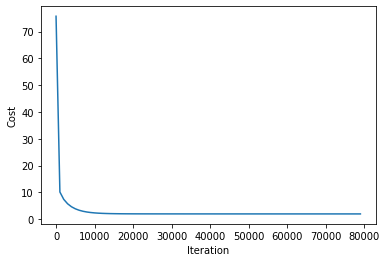

In [12]:
X=X_train.to_numpy()

from sklearn.preprocessing import normalize
X= normalize(X, norm='max', axis=0)

X_Test=X_test.to_numpy()
X_Test= normalize(X_Test, norm='max', axis=0)

model=gradient_descent(X,Y_train.to_numpy(),0.1,80000)


In [13]:
Prediction,Y_test,Y_hat=Predict(X_Test,Y_test.to_numpy(),model)
print(Prediction.T)

                                                           0
Actual     [[73], [76], [76], [77], [64], [60], [57], [62...
Predicted  [[73.36144021240005], [77.50967809778062], [76...


Text(0, 0.5, 'Predicted Values')

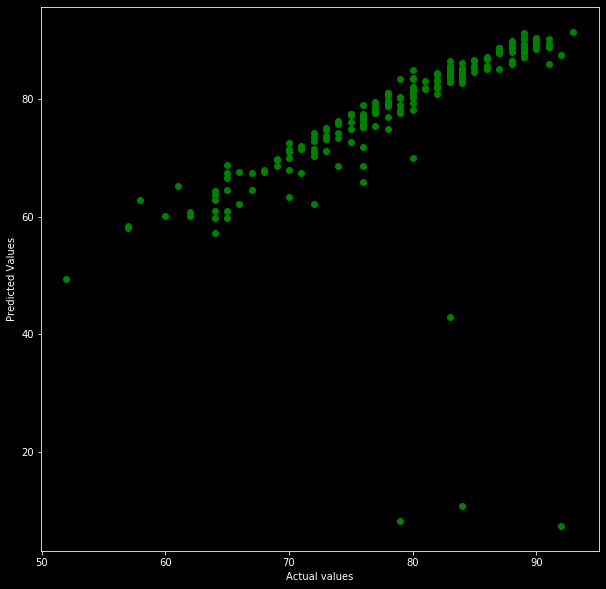

In [14]:
plt.style.use('dark_background')
plt.figure(figsize=(10, 10))
plt.scatter(Y_test,Y_hat, c = 'green')
plt.xlabel('Actual values')
plt.ylabel('Predicted Values')

In [ ]:
manual={}
for col in X_train:
    manual[col]=[float(input(f"Enter {col}  : "))]
    
single=pd.DataFrame.from_dict(manual)
single=single.to_numpy()
single= normalize(single, norm='max', axis=0)
result=manual_predict(z,model)
print(result)